<a href="https://colab.research.google.com/github/pacoiniesta/Codigo-Trabajo-Final-de-Master-IA-3/blob/main/TFMDeteccionSecSueloDyReg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



#Importing Libraries.

Loading libraries and specific functions that we are gonna use during code development.



In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
import sklearn as skl
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras import regularizers
from keras.datasets import imdb
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.layers import LSTM
from keras.layers import Bidirectional
from keras.layers.embeddings import Embedding
from keras.preprocessing import sequence
from sklearn import cross_decomposition
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from string import ascii_uppercase
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
from pylab import rcParams
from sklearn.utils import class_weight

from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import RandomOverSampler
from imblearn.combine import SMOTETomek
from imblearn.ensemble import BalancedBaggingClassifier

from collections import Counter

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.ensemble.bagging module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported fro

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls

drive  sample_data


#Lectura de los datos

In [4]:


#Definimos los nombres de las columnas de nuestro data frame. Cargamos el archivo Training y 
#realizamos selección previa de las variables de interés (S.T de NDVI y valores de clasificación).
names19=['TARGET_FID', 'COORX', 'COORY', 'SIGPACt', 'CONCAT', 'cERMOT', 'cERMOTt', 'REAL', 'I191', 'I192', 'I193','I194', 'I195', 'I196', 'I197', 'I198', 'I199', 
       'I1910', 'I1911', 'I1912', 'I1913','I1914', 'I1915', 'I1916', 'I1917', 'I1918', 'I1919', 'I1920', 'I1921', 'I1922', 'I1923','I1924', 'I1925', 'I1926',
       'I1927', 'I1928', 'I1929', 'I1930']
names18=['I181' ,'I182' ,'I183' ,'I184' ,'I185' , 'I186','I187' ,'I188' ,'I189' ,'I1810' ,'I1811' ,'I1812' ,'I1813' ,'I1814','I1815' ,
         'I1816','I1817','I1818','I1819','I1820','I1821','I1822','I1823','I1824','class2018', 'class2018t']
names17=['I171','I172','I173','I174','I175','I176','I177','I178','I179','I1710','I1711','I1712',
       'I1713','I1714','I1715','I1716','I1717','I1718','I1719','I1720','I1721','I1722','I1723','class2017','class2017t']


datos_NDVI17=pd.read_excel('/content/drive/MyDrive/Training2017.xlsx', header =0, na_values=['NaN'], index_col=False)
print(datos_NDVI17)
datos_NDVI18=pd.read_excel('/content/drive/MyDrive/Training2018.xlsx', header =0, na_values=['NaN'], index_col=False)
print(datos_NDVI18)
datos_NDVI19=pd.read_excel('/content/drive/MyDrive/Training2019.xlsx', header =0, na_values=['NaN'], index_col=False)
print(datos_NDVI19)


        I170208  I170225  I170310  ...  I171202  Clas2017  Clas2017t
0           128      132      138  ...      122        10    PSecano
1           127      132      136  ...      122        10    PSecano
2           129      134      136  ...      120        10    PSecano
3           140      154      165  ...      121        10    PSecano
4           142      163      174  ...      122        10    PSecano
...         ...      ...      ...  ...      ...       ...        ...
947103      122      123      122  ...      119        11      Suelo
947104      122      123      123  ...      120        11      Suelo
947105      123      123      123  ...      120        11      Suelo
947106      123      122      123  ...      120        10    PSecano
947107      122      123      123  ...      121        10    PSecano

[947108 rows x 25 columns]
        I180121  I180215  I180225  ...  I181205  Clas2018  Clas2018t
0           126      130      133  ...      120        11     Secano
1     

#Normalización de los valores de NDVI entre 0 y 1

In [5]:
#datos_NDVI17=datos_NDVI17.drop(0)
datos_NDVI17.iloc[:,0:23]=(datos_NDVI17.iloc[:,0:23]-100)/100
datos_NDVI17.head(1)

,I170208,I170225,I170310,I170320,I170406,I170509,I170526,I170615,I170630,I170710,I170718,I170728,I170804,I170814,I170824,I170911,I170918,I171003,I171011,I171023,I171107,I171117,I171202,Clas2017,Clas2017t
0,0.28,0.32,0.38,0.43,0.54,0.6,0.41,0.25,0.24,0.2,0.22,0.21,0.21,0.2,0.19,0.19,0.2,0.18,0.18,0.19,0.22,0.19,0.22,10,PSecano


In [6]:
#datos_NDVI18=datos_NDVI18.drop(0)
datos_NDVI18.iloc[:,0:24]=(datos_NDVI18.iloc[:,0:24]-100)/100
datos_NDVI18.head(1)

,I180121,I180215,I180225,I180322,I180414,I180426,I180516,I180613,I180620,I180625,I180705,I180713,I180718,I180730,I180814,I180827,I180901,I180916,I180923,I181003,I181016,I181026,I181102,I181205,Clas2018,Clas2018t
0,0.26,0.3,0.33,0.52,0.7,0.66,0.5,0.25,0.23,0.23,0.22,0.22,0.22,0.22,0.21,0.2,0.21,0.18,0.19,0.19,0.2,0.2,0.2,0.2,11,Secano


In [7]:
#datos_NDVI19=datos_NDVI19.drop(0)
datos_NDVI19.iloc[:,8:39]=(datos_NDVI19.iloc[:,8:39]-100)/100
datos_NDVI19.head(1)

,TARGET_FID,COOR_X,COOR_Y,SIGPACt,CONCAT,cERMOT,cERMOTt,REAL,i190101,i190111,i190121,i190205,i190218,i190225,i190310,i190317,i190327,i190404,i190416,i190429,i190506,i190516,i190531,i190610,i190620,i190628,i190705,i190718,i190728,i190809,i190819,i190827,i190903,i190918,i190928,i191001,i191006,i191016,Training,Count
0,374556,588575,4348015,2 73 0 0 19 30 1,588575 4348015,12,Suelo desnudo,0,0.25,0.26,0.25,0.25,0.29,0.32,0.37,0.36,0.39,0.43,0.5,0.63,0.62,0.66,0.47,0.32,0.29,0.24,0.23,0.22,0.22,0.21,0.21,0.23,0.2,0.2,0.23,0.23,0.2,0.2,-1.0,1


#Correspondencia de leyenda entre nombres de cultivo y número asignado

In [8]:
print(datos_NDVI17.Clas2017.unique())
print(datos_NDVI17.Clas2017t.unique())

[10 12 15 11 18 13 21 19 24 14  2 16  1  3  6 22  4  9  7  0  5  8 20 17]
['PSecano' 'Improductivo' 'Vinedo Secano' 'Suelo' 'Olivar Secano'
 'Vinedo R' 'FrutoCascara Secano' 'FrutoCascara R' 'Frutal Secano'
 'Vinedo RProb' 'RP' 'Olivar R' 'R Forrajeras' 'RP AChino' 'RV BC y Hort'
 'Frutal R' 'RP AMorado y Hort' 'DC' 'RV AC' 'Undefined' 'RPTardia'
 'R Alfalfa' 'FrutoCascara RProb' 'Olivar RProb']


In [9]:
print(datos_NDVI18.Clas2018t.unique())
print(datos_NDVI18.Clas2018.unique())

['Secano' 'Improductivo' 'Vinedo Secano' 'Suelo Desnudo' 'Vinedo R'
 'FrutalCascara Secano' 'FrutalCascara R' 'Olivar Secano'
 'FrutalHueso Secano' 'Vinedo RProb' 'Olivar R' 'RP AMorado y Hort' 'RP'
 'FrutalHueso R' 'RP AChino' 'RPTardia' 'RV BC' 'R Alfalfa' 'DC' 'RV AC'
 'R Forrajeras' 'FrutalCascara RProb' 'Olivar RProb']
[11 13 16 12 14 22 20 19 25 15 17  4  2 23  3  6  7  9 10  8  1 21 18]


In [10]:
print(datos_NDVI19.cERMOT.unique())
print(datos_NDVI19.cERMOTt.unique())

[12 13 15 11 18 21 14 23 20 16 17 19  1  4  8  3  6  9  2  5  7 22]
['Suelo desnudo' 'Improductivo' 'Vi├▒edo Secano' 'Secano'
 'Olivar de Secano' 'Frutal de C├íscara de Secano' 'Vi├▒edo Regad├¡o'
 'Frutal de Hueso de Secano' 'Frutal de C├íscara de Regad├¡o de Apoyo'
 'Olivar de Regad├¡o' 'Olivar de Regad├¡o de Apoyo'
 'Frutal de C├íscara de Regad├¡o' 'Regad├¡o de Primavera Temprana'
 'Regad├¡o de Ajo Morado y hort├¡colas' 'Regad├¡o de Alfalfa'
 'Regad├¡o de Ajo Chino' 'Regad├¡o de Verano Baja Cobertura'
 'Regad├¡o Doble Cosecha' 'Regad├¡o de Primavera'
 'Regad├¡o de Primavera Tard├¡a' 'Regad├¡o de Verano Alta Cobertura'
 'Frutal de Hueso de Regad├¡o']


#Eliminación del cultivo improductivo de los datos

In [11]:
#17: Improductivo es el 12, suelo es el 11
#18: Improductivo es el 13, suelo es el 12
#19: Improductivo es el 13, suelo es el 12

In [12]:
print(np.where(datos_NDVI17.Clas2017==12)[0])

print(np.where(datos_NDVI18.Clas2018==13)[0])

print(np.where(datos_NDVI19.cERMOT==13)[0])

[    17     18     19 ... 946896 946897 946898]
[    17     18     19 ... 946896 946897 946898]
[    17     18     19 ... 946896 946897 946898]


Coeficiente de regadío

In [13]:
#Eliminamos los improductivos:

print(datos_NDVI17)
datos_NDVI17.drop(np.where(datos_NDVI17.Clas2017==12)[0], inplace=True)
print(datos_NDVI17)


print(datos_NDVI18)
datos_NDVI18.drop(np.where(datos_NDVI18.Clas2018==13)[0], inplace=True)
print(datos_NDVI18)


print(datos_NDVI19)
datos_NDVI19.drop(np.where(datos_NDVI19.cERMOT==13)[0], inplace=True)
print(datos_NDVI19)

        I170208  I170225  I170310  ...  I171202  Clas2017  Clas2017t
0          0.28     0.32     0.38  ...     0.22        10    PSecano
1          0.27     0.32     0.36  ...     0.22        10    PSecano
2          0.29     0.34     0.36  ...     0.20        10    PSecano
3          0.40     0.54     0.65  ...     0.21        10    PSecano
4          0.42     0.63     0.74  ...     0.22        10    PSecano
...         ...      ...      ...  ...      ...       ...        ...
947103     0.22     0.23     0.22  ...     0.19        11      Suelo
947104     0.22     0.23     0.23  ...     0.20        11      Suelo
947105     0.23     0.23     0.23  ...     0.20        11      Suelo
947106     0.23     0.22     0.23  ...     0.20        10    PSecano
947107     0.22     0.23     0.23  ...     0.21        10    PSecano

[947108 rows x 25 columns]
        I170208  I170225  I170310  ...  I171202  Clas2017  Clas2017t
0          0.28     0.32     0.38  ...     0.22        10    PSecano
1     

#Generamos columna 'REGADIO' con las 3 clases principales

In [14]:
datos_NDVI17['REGADIO']=datos_NDVI17.iloc[:,23].replace({0:3, 1:1, 2:1, 3:1 , 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:0, 11:2, 12:0, 13:1, 14:1, 15:0, 16:1, 17:1, 18:0, 19:1, 20:1, 21:0, 22:1, 24:0})

In [15]:
datos_NDVI18['REGADIO']=datos_NDVI18.iloc[:,24].replace({1:1, 2:1, 3:1 , 4:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:0, 12:2, 13:0, 14:1, 15:1, 16:0, 17:1, 18:1, 19:0, 20:1, 21:1, 22:0, 23:1, 25:0})

In [16]:
datos_NDVI19['REGADIO']=datos_NDVI19.iloc[:,5].replace({1:1, 2:1, 3:1 , 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 11:0, 12:2, 13:0, 14:1, 15:0, 16:1, 17:1, 18:0, 19:1, 20:1, 21:0, 22:1, 23:0})

#Eliminación de cultivos no definidos en 2017 
Correspondientes al valor 3 en la columna REGADIO.

In [17]:
datos_NDVI170=datos_NDVI17[datos_NDVI17.REGADIO==0]
print(datos_NDVI170)
datos_NDVI171=datos_NDVI17[datos_NDVI17.REGADIO==1]
print(datos_NDVI171)
datos_NDVI172=datos_NDVI17[datos_NDVI17.REGADIO==2]
print(datos_NDVI172)
datos_NDVI173=datos_NDVI17[datos_NDVI17.REGADIO==3]
print(datos_NDVI173)

datos_NDVI17_U=pd.concat([datos_NDVI170, datos_NDVI171, datos_NDVI172], axis=0)
print(datos_NDVI17_U)

        I170208  I170225  I170310  ...  Clas2017      Clas2017t  REGADIO
0          0.28     0.32     0.38  ...        10        PSecano        0
1          0.27     0.32     0.36  ...        10        PSecano        0
2          0.29     0.34     0.36  ...        10        PSecano        0
3          0.40     0.54     0.65  ...        10        PSecano        0
4          0.42     0.63     0.74  ...        10        PSecano        0
...         ...      ...      ...  ...       ...            ...      ...
947071     0.21     0.21     0.18  ...        15  Vinedo Secano        0
947072     0.21     0.20     0.20  ...        15  Vinedo Secano        0
947092     0.23     0.24     0.23  ...        10        PSecano        0
947106     0.23     0.22     0.23  ...        10        PSecano        0
947107     0.22     0.23     0.23  ...        10        PSecano        0

[494103 rows x 26 columns]
        I170208  I170225  I170310  ...  Clas2017  Clas2017t  REGADIO
111        0.24     0.25   

#Selección de las fechas disponibles para los años de estudio
Que conforman de manera ordenada las series temporales de NDVI de todas las muestras.

In [18]:
datos_NDVI17X=datos_NDVI17_U.iloc[:,0:23]
print(datos_NDVI17X)
datos_NDVI18X=datos_NDVI18.iloc[:,0:24]
print(datos_NDVI18X)
datos_NDVI19X=datos_NDVI19.iloc[:,8:38]
print(datos_NDVI19X)

        I170208  I170225  I170310  I170320  ...  I171023  I171107  I171117  I171202
0          0.28     0.32     0.38     0.43  ...     0.19     0.22     0.19     0.22
1          0.27     0.32     0.36     0.43  ...     0.18     0.21     0.18     0.22
2          0.29     0.34     0.36     0.39  ...     0.20     0.20     0.19     0.20
3          0.40     0.54     0.65     0.62  ...     0.20     0.22     0.19     0.21
4          0.42     0.63     0.74     0.77  ...     0.20     0.22     0.20     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947101     0.21     0.22     0.22     0.22  ...     0.18     0.19     0.18     0.20
947102     0.21     0.22     0.22     0.23  ...     0.18     0.19     0.18     0.19
947103     0.22     0.23     0.22     0.23  ...     0.18     0.20     0.18     0.19
947104     0.22     0.23     0.23     0.24  ...     0.19     0.20     0.19     0.20
947105     0.23     0.23     0.23     0.24  ...     0.19     0.20     0.19  

#Sustitución de posibles valores 0 ó -1

In [19]:
datos_NDVI17X.replace(to_replace=0, inplace=True, method='ffill')

print(datos_NDVI17X)

        I170208  I170225  I170310  I170320  ...  I171023  I171107  I171117  I171202
0          0.28     0.32     0.38     0.43  ...     0.19     0.22     0.19     0.22
1          0.27     0.32     0.36     0.43  ...     0.18     0.21     0.18     0.22
2          0.29     0.34     0.36     0.39  ...     0.20     0.20     0.19     0.20
3          0.40     0.54     0.65     0.62  ...     0.20     0.22     0.19     0.21
4          0.42     0.63     0.74     0.77  ...     0.20     0.22     0.20     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947101     0.21     0.22     0.22     0.22  ...     0.18     0.19     0.18     0.20
947102     0.21     0.22     0.22     0.23  ...     0.18     0.19     0.18     0.19
947103     0.22     0.23     0.22     0.23  ...     0.18     0.20     0.18     0.19
947104     0.22     0.23     0.23     0.24  ...     0.19     0.20     0.19     0.20
947105     0.23     0.23     0.23     0.24  ...     0.19     0.20     0.19  

In [20]:
datos_NDVI17X.replace(to_replace=-1, inplace=True, method='ffill')

print(datos_NDVI17X)

        I170208  I170225  I170310  I170320  ...  I171023  I171107  I171117  I171202
0          0.28     0.32     0.38     0.43  ...     0.19     0.22     0.19     0.22
1          0.27     0.32     0.36     0.43  ...     0.18     0.21     0.18     0.22
2          0.29     0.34     0.36     0.39  ...     0.20     0.20     0.19     0.20
3          0.40     0.54     0.65     0.62  ...     0.20     0.22     0.19     0.21
4          0.42     0.63     0.74     0.77  ...     0.20     0.22     0.20     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947101     0.21     0.22     0.22     0.22  ...     0.18     0.19     0.18     0.20
947102     0.21     0.22     0.22     0.23  ...     0.18     0.19     0.18     0.19
947103     0.22     0.23     0.22     0.23  ...     0.18     0.20     0.18     0.19
947104     0.22     0.23     0.23     0.24  ...     0.19     0.20     0.19     0.20
947105     0.23     0.23     0.23     0.24  ...     0.19     0.20     0.19  

In [21]:
datos_NDVI18X.replace(to_replace=0, inplace=True, method='ffill')

print(datos_NDVI18X)

        I180121  I180215  I180225  I180322  ...  I181016  I181026  I181102  I181205
0          0.26     0.30     0.33     0.52  ...     0.20     0.20     0.20     0.20
1          0.26     0.30     0.33     0.54  ...     0.19     0.19     0.22     0.24
2          0.25     0.29     0.31     0.44  ...     0.22     0.20     0.21     0.22
3          0.25     0.31     0.33     0.43  ...     0.21     0.20     0.22     0.21
4          0.27     0.31     0.36     0.50  ...     0.25     0.20     0.22     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.22     0.27     0.31     0.38  ...     0.20    -1.00     0.18     0.19
947104     0.23     0.28     0.32     0.41  ...     0.19    -1.00     0.18     0.19
947105     0.22     0.28     0.33     0.41  ...     0.18    -1.00     0.18     0.18
947106     0.23     0.28     0.33     0.43  ...     0.19    -1.00     0.18     0.20
947107     0.24     0.27     0.32     0.43  ...     0.19    -1.00     0.19  

In [22]:
datos_NDVI18X.replace(to_replace=-1, inplace=True, method='ffill')

print(datos_NDVI18X)

        I180121  I180215  I180225  I180322  ...  I181016  I181026  I181102  I181205
0          0.26     0.30     0.33     0.52  ...     0.20     0.20     0.20     0.20
1          0.26     0.30     0.33     0.54  ...     0.19     0.19     0.22     0.24
2          0.25     0.29     0.31     0.44  ...     0.22     0.20     0.21     0.22
3          0.25     0.31     0.33     0.43  ...     0.21     0.20     0.22     0.21
4          0.27     0.31     0.36     0.50  ...     0.25     0.20     0.22     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.22     0.27     0.31     0.38  ...     0.20     0.25     0.18     0.19
947104     0.23     0.28     0.32     0.41  ...     0.19     0.25     0.18     0.19
947105     0.22     0.28     0.33     0.41  ...     0.18     0.25     0.18     0.18
947106     0.23     0.28     0.33     0.43  ...     0.19     0.25     0.18     0.20
947107     0.24     0.27     0.32     0.43  ...     0.19     0.25     0.19  

In [23]:
datos_NDVI19X.replace(to_replace=0, inplace=True, method='ffill')

print(datos_NDVI19X)

        i190101  i190111  i190121  i190205  ...  i190928  i191001  i191006  i191016
0          0.25     0.26     0.25     0.25  ...     0.23     0.23     0.20     0.20
1          0.27     0.26     0.27     0.25  ...     0.23     0.22     0.21     0.20
2          0.25     0.26     0.25     0.21  ...     0.22     0.21     0.21     0.22
3          0.23     0.22     0.21     0.22  ...     0.21     0.22     0.22     0.25
4          0.23     0.23     0.23     0.22  ...     0.22     0.23     0.22     0.24
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.22     0.22     0.23     0.22  ...     0.20     0.20     0.20     0.23
947104     0.22     0.23     0.23     0.22  ...     0.20     0.21     0.21     0.23
947105     0.23     0.23     0.22     0.22  ...     0.20     0.21     0.21     0.23
947106     0.22     0.22     0.23     0.23  ...     0.20     0.21     0.21     0.23
947107     0.23     0.22     0.23     0.22  ...     0.20     0.20     0.20  

In [24]:
datos_NDVI19X.replace(to_replace=-1, inplace=True, method='ffill')

print(datos_NDVI19X)

        i190101  i190111  i190121  i190205  ...  i190928  i191001  i191006  i191016
0          0.25     0.26     0.25     0.25  ...     0.23     0.23     0.20     0.20
1          0.27     0.26     0.27     0.25  ...     0.23     0.22     0.21     0.20
2          0.25     0.26     0.25     0.21  ...     0.22     0.21     0.21     0.22
3          0.23     0.22     0.21     0.22  ...     0.21     0.22     0.22     0.25
4          0.23     0.23     0.23     0.22  ...     0.22     0.23     0.22     0.24
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.22     0.22     0.23     0.22  ...     0.20     0.20     0.20     0.23
947104     0.22     0.23     0.23     0.22  ...     0.20     0.21     0.21     0.23
947105     0.23     0.23     0.22     0.22  ...     0.20     0.21     0.21     0.23
947106     0.22     0.22     0.23     0.23  ...     0.20     0.21     0.21     0.23
947107     0.23     0.22     0.23     0.22  ...     0.20     0.20     0.20  

#Selección de variable respuesta


In [25]:
datos_NDVI17Y=datos_NDVI17_U.REGADIO
datos_NDVI18Y=datos_NDVI18.REGADIO
datos_NDVI19Y=datos_NDVI19.REGADIO

#Preparación de las covariables

Seleccionamos las fechas que utilizaremos, 22 para cada año de estudio.

In [26]:
datos_NDVI17X_S=datos_NDVI17X.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,12,13,14,15,16,17,18,19,20,21,22]]
print(datos_NDVI17X_S)

        I170208  I170225  I170310  I170320  ...  I171023  I171107  I171117  I171202
0          0.28     0.32     0.38     0.43  ...     0.19     0.22     0.19     0.22
1          0.27     0.32     0.36     0.43  ...     0.18     0.21     0.18     0.22
2          0.29     0.34     0.36     0.39  ...     0.20     0.20     0.19     0.20
3          0.40     0.54     0.65     0.62  ...     0.20     0.22     0.19     0.21
4          0.42     0.63     0.74     0.77  ...     0.20     0.22     0.20     0.22
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947101     0.21     0.22     0.22     0.22  ...     0.18     0.19     0.18     0.20
947102     0.21     0.22     0.22     0.23  ...     0.18     0.19     0.18     0.19
947103     0.22     0.23     0.22     0.23  ...     0.18     0.20     0.18     0.19
947104     0.22     0.23     0.23     0.24  ...     0.19     0.20     0.19     0.20
947105     0.23     0.23     0.23     0.24  ...     0.19     0.20     0.19  

In [27]:
datos_NDVI17X_S.head(1)

,I170208,I170225,I170310,I170320,I170406,I170509,I170526,I170615,I170630,I170710,I170718,I170804,I170814,I170824,I170911,I170918,I171003,I171011,I171023,I171107,I171117,I171202
0,0.28,0.32,0.38,0.43,0.54,0.6,0.41,0.25,0.24,0.2,0.22,0.21,0.2,0.19,0.19,0.2,0.18,0.18,0.19,0.22,0.19,0.22


In [28]:
datos_NDVI18X_S=datos_NDVI18X.iloc[:,[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21]]
print(datos_NDVI18X_S)

        I180121  I180215  I180225  I180322  ...  I180923  I181003  I181016  I181026
0          0.26     0.30     0.33     0.52  ...     0.19     0.19     0.20     0.20
1          0.26     0.30     0.33     0.54  ...     0.19     0.21     0.19     0.19
2          0.25     0.29     0.31     0.44  ...     0.19     0.25     0.22     0.20
3          0.25     0.31     0.33     0.43  ...     0.21     0.22     0.21     0.20
4          0.27     0.31     0.36     0.50  ...     0.22     0.24     0.25     0.20
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.22     0.27     0.31     0.38  ...     0.18     0.19     0.20     0.25
947104     0.23     0.28     0.32     0.41  ...     0.18     0.20     0.19     0.25
947105     0.22     0.28     0.33     0.41  ...     0.17     0.19     0.18     0.25
947106     0.23     0.28     0.33     0.43  ...     0.18     0.19     0.19     0.25
947107     0.24     0.27     0.32     0.43  ...     0.17     0.19     0.19  

In [29]:
datos_NDVI18X_S.head(1)

,I180121,I180215,I180225,I180322,I180414,I180426,I180516,I180613,I180620,I180625,I180705,I180713,I180718,I180730,I180814,I180827,I180901,I180916,I180923,I181003,I181016,I181026
0,0.26,0.3,0.33,0.52,0.7,0.66,0.5,0.25,0.23,0.23,0.22,0.22,0.22,0.22,0.21,0.2,0.21,0.18,0.19,0.19,0.2,0.2


In [30]:
datos_NDVI19X_S=datos_NDVI19X.iloc[:,[2,4,5,8,10,11,13,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29]]
print(datos_NDVI19X_S)

        i190121  i190218  i190225  i190327  ...  i190928  i191001  i191006  i191016
0          0.25     0.29     0.32     0.39  ...     0.23     0.23     0.20     0.20
1          0.27     0.29     0.32     0.35  ...     0.23     0.22     0.21     0.20
2          0.25     0.26     0.25     0.29  ...     0.22     0.21     0.21     0.22
3          0.21     0.22     0.24     0.28  ...     0.21     0.22     0.22     0.25
4          0.23     0.25     0.25     0.30  ...     0.22     0.23     0.22     0.24
...         ...      ...      ...      ...  ...      ...      ...      ...      ...
947103     0.23     0.22     0.24     0.27  ...     0.20     0.20     0.20     0.23
947104     0.23     0.23     0.25     0.27  ...     0.20     0.21     0.21     0.23
947105     0.22     0.24     0.25     0.27  ...     0.20     0.21     0.21     0.23
947106     0.23     0.24     0.25     0.28  ...     0.20     0.21     0.21     0.23
947107     0.23     0.24     0.25     0.28  ...     0.20     0.20     0.20  

In [31]:
datos_NDVI19X_S.head(1)

,i190121,i190218,i190225,i190327,i190416,i190429,i190516,i190610,i190620,i190628,i190705,i190718,i190728,i190809,i190819,i190827,i190903,i190918,i190928,i191001,i191006,i191016
0,0.25,0.29,0.32,0.39,0.5,0.63,0.66,0.32,0.29,0.24,0.23,0.22,0.22,0.21,0.21,0.23,0.2,0.2,0.23,0.23,0.2,0.2


#Incorporación de nuevas covariables en forma de parámetros estadísticos

Generamos estas covariables únicamente para los modelos que entienden las covariables como variables independientes. Es decir, **para ejecutar los modelos CNN-1D y 2-BiLSTM no debemos incorporar estas columnas**.

In [ ]:
#2017
datos_NDVI17X_S['STD']=datos_NDVI17X_S.iloc[:, 0:23].std(axis=1)
datos_NDVI17X_S['MEAN']=datos_NDVI17X_S.iloc[:, 0:23].mean(axis=1)
datos_NDVI17X_S['MAX']=datos_NDVI17X_S.iloc[:, 0:23].max(axis=1)
datos_NDVI17X_S['MIN']=datos_NDVI17X_S.iloc[:, 0:23].min(axis=1)

#2018
datos_NDVI18X_S['STD']=datos_NDVI18X_S.iloc[:, 0:23].std(axis=1)
datos_NDVI18X_S['MEAN']=datos_NDVI18X_S.iloc[:, 0:23].mean(axis=1)
datos_NDVI18X_S['MAX']=datos_NDVI18X_S.iloc[:, 0:23].max(axis=1)
datos_NDVI18X_S['MIN']=datos_NDVI18X_S.iloc[:, 0:23].min(axis=1)

#2019
datos_NDVI19X_S['STD']=datos_NDVI19X_S.iloc[:, 0:23].std(axis=1)
datos_NDVI19X_S['MEAN']=datos_NDVI19X_S.iloc[:, 0:23].mean(axis=1)
datos_NDVI19X_S['MAX']=datos_NDVI19X_S.iloc[:, 0:23].max(axis=1)
datos_NDVI19X_S['MIN']=datos_NDVI19X_S.iloc[:, 0:23].min(axis=1)

print(datos_NDVI17X_S)
print(datos_NDVI18X_S)
print(datos_NDVI19X_S)

        I170208  I170225  I170310  I170320  ...       STD      MEAN   MAX       MIN
0          0.28     0.32     0.38     0.43  ...  0.121527  0.267892  0.60  0.121527
1          0.27     0.32     0.36     0.43  ...  0.118542  0.262980  0.59  0.118542
2          0.29     0.34     0.36     0.39  ...  0.093429  0.249280  0.48  0.093429
3          0.40     0.54     0.65     0.62  ...  0.167096  0.289874  0.65  0.160000
4          0.42     0.63     0.74     0.77  ...  0.211650  0.318767  0.77  0.170000
...         ...      ...      ...      ...  ...       ...       ...   ...       ...
947101     0.21     0.22     0.22     0.22  ...  0.048842  0.203428  0.36  0.048842
947102     0.21     0.22     0.22     0.23  ...  0.050933  0.206128  0.38  0.050933
947103     0.22     0.23     0.22     0.23  ...  0.050948  0.209172  0.38  0.050948
947104     0.22     0.23     0.23     0.24  ...  0.053711  0.213640  0.40  0.053711
947105     0.23     0.23     0.23     0.24  ...  0.057253  0.215533  0.40  0

#Matrices de correlación

In [ ]:
datos_NDVI17_UDS=pd.concat([datos_NDVI17X_S, datos_NDVI17Y], axis=1)
print(datos_NDVI17_UDS)
datos_NDVI18_UDS=pd.concat([datos_NDVI18X_S, datos_NDVI18Y], axis=1)
print(datos_NDVI18_UDS)
datos_NDVI19_UDS=pd.concat([datos_NDVI19X_S, datos_NDVI19Y], axis=1)
print(datos_NDVI19_UDS)

##Matriz de correlación 2017

(888565, 27)
Index(['I170208', 'I170225', 'I170310', 'I170320', 'I170406', 'I170509',
       'I170526', 'I170615', 'I170630', 'I170710', 'I170718', 'I170804',
       'I170814', 'I170824', 'I170911', 'I170918', 'I171003', 'I171011',
       'I171023', 'I171107', 'I171117', 'I171202', 'STD', 'MEAN', 'MAX', 'MIN',
       'REGADIO'],
      dtype='object')


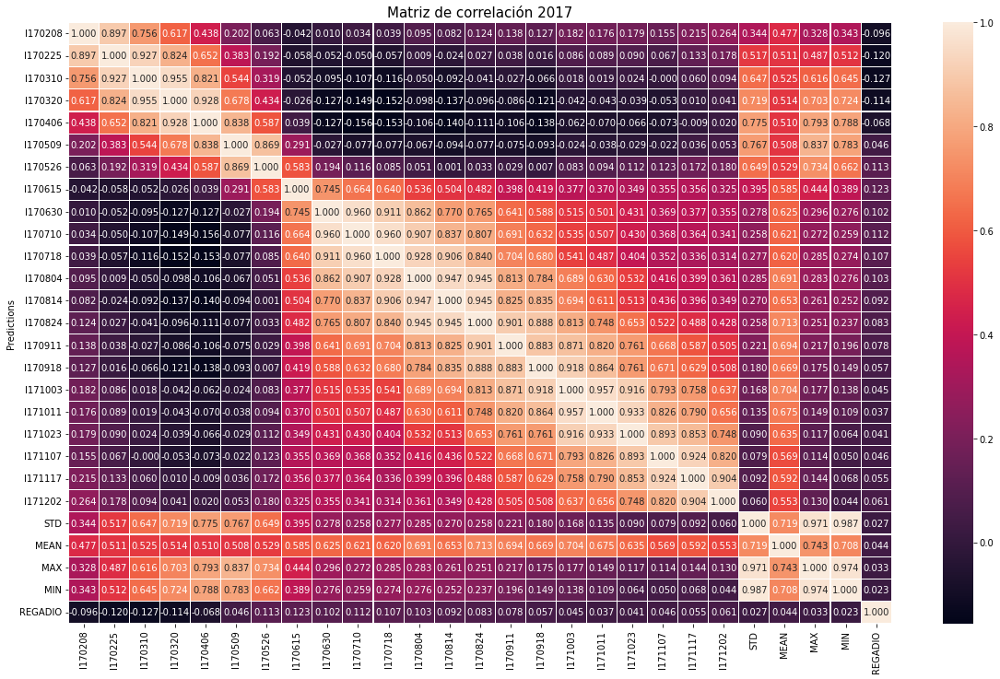

In [ ]:
data17 = datos_NDVI17_UDS

features17 = datos_NDVI17_UDS.columns

df = pd.DataFrame(data17, columns = features17)

print(df.shape)

print(features17)

import seaborn as sns

import matplotlib.pyplot as plt

# taking all rows but only 6 columns
df_small = df.iloc[:,:6]

correlation_mat = df.corr()

fig, ax = plt.subplots(figsize=(20,12))
grafica=sns.heatmap(correlation_mat, annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":10})

plt.title('Matriz de correlación 2017', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


##Matriz de correlación 2018

(888674, 27)
Index(['I180121', 'I180215', 'I180225', 'I180322', 'I180414', 'I180426',
       'I180516', 'I180613', 'I180620', 'I180625', 'I180705', 'I180713',
       'I180718', 'I180730', 'I180814', 'I180827', 'I180901', 'I180916',
       'I180923', 'I181003', 'I181016', 'I181026', 'STD', 'MEAN', 'MAX', 'MIN',
       'REGADIO'],
      dtype='object')


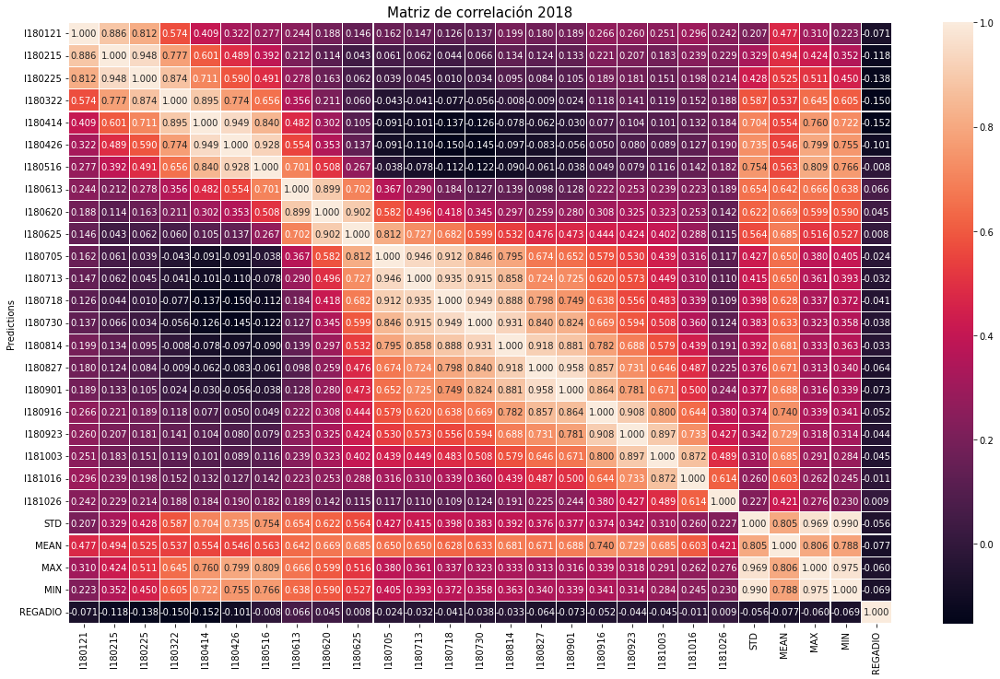

In [ ]:
data18 = datos_NDVI18_UDS

features18 = datos_NDVI18_UDS.columns

df = pd.DataFrame(data18, columns = features18)

print(df.shape)

print(features18)

import seaborn as sns

import matplotlib.pyplot as plt

correlation_mat = df.corr()

fig, ax = plt.subplots(figsize=(20,12))
grafica=sns.heatmap(correlation_mat, annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":10})

plt.title('Matriz de correlación 2018', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()



##Matriz de correlación 2019

(889552, 27)
Index(['i190121', 'i190218', 'i190225', 'i190327', 'i190416', 'i190429',
       'i190516', 'i190610', 'i190620', 'i190628', 'i190705', 'i190718',
       'i190728', 'i190809', 'i190819', 'i190827', 'i190903', 'i190918',
       'i190928', 'i191001', 'i191006', 'i191016', 'STD', 'MEAN', 'MAX', 'MIN',
       'REGADIO'],
      dtype='object')


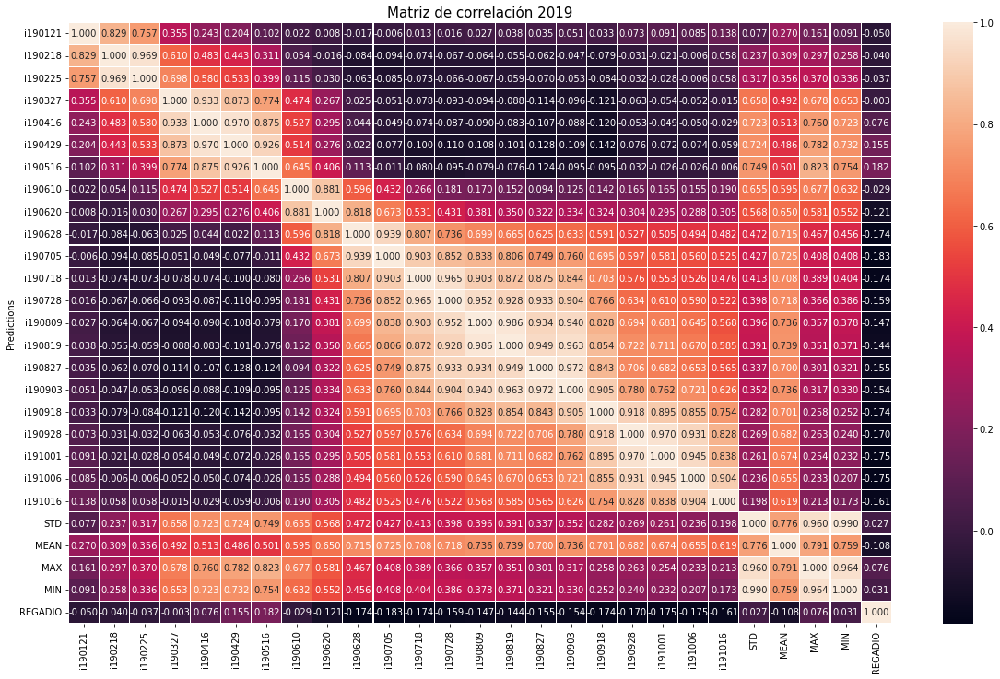

In [ ]:
data19 = datos_NDVI19_UDS

features19 = datos_NDVI19_UDS.columns

df = pd.DataFrame(data19, columns = features19)

print(df.shape)

print(features19)

import seaborn as sns

import matplotlib.pyplot as plt


correlation_mat = df.corr()

fig, ax = plt.subplots(figsize=(20,12))
grafica=sns.heatmap(correlation_mat, annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":10})

plt.title('Matriz de correlación 2019', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()



#Partición datasets ENTRENAMIENTO Y VALIDACIÓN

El 5% del terreno se usa para entrenar y el 95% restante se usa para validar los modelos.


In [32]:
train_X175, val_X175, train_Y175, val_Y175=train_test_split(datos_NDVI17X_S, datos_NDVI17Y, test_size=0.95,shuffle=True, random_state=15)

In [33]:
train_X185, val_X185, train_Y185, val_Y185=train_test_split(datos_NDVI18X_S, datos_NDVI18Y, test_size=0.95,shuffle=True, random_state=15)

In [34]:
train_X195, val_X195, train_Y195, val_Y195=train_test_split(datos_NDVI19X_S, datos_NDVI19Y, test_size=0.95,shuffle=True, random_state=15)

#PESOS DE LAS CLASES
Generamos estos pesos puesto que la clasificación está algo desbalanceada y puede servirnos de ayuda para conseguir desarrollar clasificadores más robustos.


In [35]:
class_weight175 = class_weight.compute_class_weight('balanced' ,np.unique(train_Y175) ,train_Y175)
print(class_weight175)

[0.59823605 1.29102374 1.80557588]


In [36]:
class_weight185 = class_weight.compute_class_weight('balanced' ,np.unique(train_Y185) ,train_Y185)
print(class_weight185)

[0.70572259 1.30862343 1.22122361]


In [37]:
class_weight195 = class_weight.compute_class_weight('balanced' ,np.unique(train_Y195) ,train_Y195)
print(class_weight195)

[0.93342987 1.30795471 0.85901076]


#DICCIONARIOS DE PESOS DE LAS CLASES

In [38]:
class_dictW175={0: class_weight175[0], 1: class_weight175[1], 2:class_weight175[2]+1}
print(class_dictW175)

{0: 0.5982360465899145, 1: 1.2910237410280998, 2: 2.8055758758026497}


In [39]:
class_dictW185={0: class_weight185[0], 1: class_weight185[1], 2: class_weight185[2]+1}
print(class_dictW185)

{0: 0.7057225901748702, 1: 1.308623431701714, 2: 2.2212236147757256}


In [40]:
class_dictW195={0: class_weight195[0], 1: class_weight195[1], 2:class_weight195[2]+1}
print(class_dictW195)

{0: 0.9334298726101282, 1: 1.3079547125422732, 2: 1.8590107576723256}


#Preparación de los datos de entrenamiento y validación para la CNN-1D

In [41]:
train_Xnp175=np.array(train_X175)
train_Xnps175=train_Xnp175.reshape([train_X175.shape[0], train_X175.shape[1], 1])
print(train_Xnps175)

train_Xnp185=np.array(train_X185)
train_Xnps185=train_Xnp185.reshape([train_X185.shape[0], train_X185.shape[1], 1])
print(train_Xnps185)

train_Xnp195=np.array(train_X195)
train_Xnps195=train_Xnp195.reshape([train_X195.shape[0], train_X195.shape[1], 1])
print(train_Xnps195)

[[[0.22]
  [0.21]
  [0.2 ]
  ...
  [0.17]
  [0.16]
  [0.19]]

 [[0.25]
  [0.3 ]
  [0.43]
  ...
  [0.27]
  [0.28]
  [0.32]]

 [[0.24]
  [0.29]
  [0.32]
  ...
  [0.19]
  [0.18]
  [0.21]]

 ...

 [[0.22]
  [0.23]
  [0.23]
  ...
  [0.19]
  [0.18]
  [0.18]]

 [[0.24]
  [0.25]
  [0.29]
  ...
  [0.2 ]
  [0.19]
  [0.21]]

 [[0.21]
  [0.21]
  [0.22]
  ...
  [0.21]
  [0.19]
  [0.21]]]
[[[0.23]
  [0.28]
  [0.3 ]
  ...
  [0.29]
  [0.24]
  [0.69]]

 [[0.22]
  [0.27]
  [0.31]
  ...
  [0.26]
  [0.21]
  [0.24]]

 [[0.19]
  [0.23]
  [0.23]
  ...
  [0.28]
  [0.31]
  [0.23]]

 ...

 [[0.24]
  [0.21]
  [0.26]
  ...
  [0.65]
  [0.67]
  [0.52]]

 [[0.21]
  [0.21]
  [0.23]
  ...
  [0.28]
  [0.29]
  [0.27]]

 [[0.16]
  [0.17]
  [0.23]
  ...
  [0.36]
  [0.39]
  [0.67]]]
[[[0.25]
  [0.28]
  [0.3 ]
  ...
  [0.24]
  [0.25]
  [0.27]]

 [[0.2 ]
  [0.24]
  [0.26]
  ...
  [0.29]
  [0.27]
  [0.29]]

 [[0.2 ]
  [0.19]
  [0.19]
  ...
  [0.29]
  [0.31]
  [0.32]]

 ...

 [[0.21]
  [0.27]
  [0.29]
  ...
  [0.21]
  [0.21]
 

In [42]:
val_Xnp175=np.array(val_X175)
val_Xnps175=val_Xnp175.reshape([val_X175.shape[0], val_X175.shape[1], 1])
print(val_Xnps175)


val_Xnp185=np.array(val_X185)
val_Xnps185=val_Xnp185.reshape([val_X185.shape[0], val_X185.shape[1], 1])
print(val_Xnps185)

val_Xnp195=np.array(val_X195)
val_Xnps195=val_Xnp195.reshape([val_X195.shape[0], val_X195.shape[1], 1])
print(val_Xnps195)


[[[0.23]
  [0.25]
  [0.26]
  ...
  [0.2 ]
  [0.2 ]
  [0.2 ]]

 [[0.3 ]
  [0.3 ]
  [0.24]
  ...
  [0.24]
  [0.21]
  [0.27]]

 [[0.22]
  [0.21]
  [0.26]
  ...
  [0.21]
  [0.2 ]
  [0.21]]

 ...

 [[0.25]
  [0.31]
  [0.46]
  ...
  [0.19]
  [0.18]
  [0.2 ]]

 [[0.23]
  [0.23]
  [0.2 ]
  ...
  [0.2 ]
  [0.18]
  [0.21]]

 [[0.25]
  [0.28]
  [0.4 ]
  ...
  [0.21]
  [0.18]
  [0.2 ]]]
[[[0.17]
  [0.19]
  [0.21]
  ...
  [0.26]
  [0.27]
  [0.25]]

 [[0.21]
  [0.2 ]
  [0.21]
  ...
  [0.31]
  [0.32]
  [0.26]]

 [[0.22]
  [0.22]
  [0.24]
  ...
  [0.34]
  [0.32]
  [0.33]]

 ...

 [[0.19]
  [0.19]
  [0.21]
  ...
  [0.26]
  [0.29]
  [0.32]]

 [[0.26]
  [0.32]
  [0.36]
  ...
  [0.28]
  [0.26]
  [0.29]]

 [[0.19]
  [0.2 ]
  [0.23]
  ...
  [0.32]
  [0.4 ]
  [0.22]]]
[[[0.2 ]
  [0.26]
  [0.3 ]
  ...
  [0.35]
  [0.33]
  [0.23]]

 [[0.2 ]
  [0.19]
  [0.2 ]
  ...
  [0.24]
  [0.2 ]
  [0.21]]

 [[0.23]
  [0.23]
  [0.25]
  ...
  [0.21]
  [0.22]
  [0.23]]

 ...

 [[0.49]
  [0.42]
  [0.47]
  ...
  [0.27]
  [0.27]
 

In [43]:
TX_val175=tf.convert_to_tensor(val_Xnps175, dtype=float)

TX_train175=tf.convert_to_tensor(train_Xnps175,dtype=float)
print(TX_train175)


TX_val185=tf.convert_to_tensor(val_Xnps185, dtype=float)

TX_train185=tf.convert_to_tensor(train_Xnps185,dtype=float)
print(TX_train185)


TX_val195=tf.convert_to_tensor(val_Xnps195, dtype=float)

TX_train195=tf.convert_to_tensor(train_Xnps195,dtype=float)
print(TX_train195)

tf.Tensor(
[[[0.22]
  [0.21]
  [0.2 ]
  ...
  [0.17]
  [0.16]
  [0.19]]

 [[0.25]
  [0.3 ]
  [0.43]
  ...
  [0.27]
  [0.28]
  [0.32]]

 [[0.24]
  [0.29]
  [0.32]
  ...
  [0.19]
  [0.18]
  [0.21]]

 ...

 [[0.22]
  [0.23]
  [0.23]
  ...
  [0.19]
  [0.18]
  [0.18]]

 [[0.24]
  [0.25]
  [0.29]
  ...
  [0.2 ]
  [0.19]
  [0.21]]

 [[0.21]
  [0.21]
  [0.22]
  ...
  [0.21]
  [0.19]
  [0.21]]], shape=(44428, 22, 1), dtype=float32)
tf.Tensor(
[[[0.23]
  [0.28]
  [0.3 ]
  ...
  [0.29]
  [0.24]
  [0.69]]

 [[0.22]
  [0.27]
  [0.31]
  ...
  [0.26]
  [0.21]
  [0.24]]

 [[0.19]
  [0.23]
  [0.23]
  ...
  [0.28]
  [0.31]
  [0.23]]

 ...

 [[0.24]
  [0.21]
  [0.26]
  ...
  [0.65]
  [0.67]
  [0.52]]

 [[0.21]
  [0.21]
  [0.23]
  ...
  [0.28]
  [0.29]
  [0.27]]

 [[0.16]
  [0.17]
  [0.23]
  ...
  [0.36]
  [0.39]
  [0.67]]], shape=(44433, 22, 1), dtype=float32)
tf.Tensor(
[[[0.25]
  [0.28]
  [0.3 ]
  ...
  [0.24]
  [0.25]
  [0.27]]

 [[0.2 ]
  [0.24]
  [0.26]
  ...
  [0.29]
  [0.27]
  [0.29]]

 [[0.2 ]
  

#Modelo CNN-1D


##Modelos con diferentes hiperparámetros planteados



In [44]:
from keras.layers import Convolution1D, ZeroPadding1D, MaxPooling1D, BatchNormalization, Activation, Dropout, Flatten


#La variación que realizaremos sobre los hiperparámetros será k_s=3,5; dt=0.8,0.6; batch_size=32, 64;
# (3, 0.6, 32)==1, (3, 0.6,64)==2, (3, 0.8, 32)==3, (3, 0.8, 64)==4, (5, 0.6, 32)==5, (5, 0.8, 32)==6, (5, 0.6, 64)==7, (5, 0.8, 64)==8
k_s=3
dt=0.6
lr=0.001
batch_size=32
num_classes=3
epochs=20
input_shape=(train_Xnps175.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model1_C1D175= Sequential()


model1_C1D175.add(Convolution1D(256, kernel_size=k_s, activation='relu', padding='same',input_shape=input_shape))
model1_C1D175.add(BatchNormalization())
model1_C1D175.add(MaxPooling1D(pool_size=(2)))
model1_C1D175.add(Convolution1D(128, kernel_size=3, activation='relu'))
model1_C1D175.add(BatchNormalization())
model1_C1D175.add(Flatten())
model1_C1D175.add(Dense(128, activation='tanh'))
model1_C1D175.add(Dropout(dt))
model1_C1D175.add(Dense(64, activation='relu'))
model1_C1D175.add(Dropout(dt))
model1_C1D175.add(Dense(3, activation='softmax'))

model1_C1D175.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model1_C1D175.summary()




Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 22, 256)           1024      
_________________________________________________________________
batch_normalization (BatchNo (None, 22, 256)           1024      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 11, 256)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 9, 128)            98432     
_________________________________________________________________
batch_normalization_1 (Batch (None, 9, 128)            512       
_________________________________________________________________
flatten (Flatten)            (None, 1152)              0         
_________________________________________________________________
dense (Dense)                (None, 128)               1

In [45]:
#La variación que realizaremos sobre los hiperparámetros será k_s=3,5; dt=0.8,0.6; batch_size=32, 64;
# (3, 0.6, 32)==1, (3, 0.6,64)==2, (3, 0.8, 32)==3, (3, 0.8, 64)==4, (5, 0.6, 32)==5, (5, 0.8, 32)==6, (5, 0.6, 64)==7, (5, 0.8, 64)==8
k_s=3
dt=0.6
lr=0.001
batch_size=64
num_classes=3
epochs=20
input_shape=(train_Xnps175.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model2_C1D175= Sequential()


model2_C1D175.add(Convolution1D(256, kernel_size=k_s, activation='relu', input_shape=input_shape))
model2_C1D175.add(BatchNormalization())
model2_C1D175.add(MaxPooling1D(pool_size=(2)))
model2_C1D175.add(Convolution1D(128, kernel_size=3, activation='relu'))
model2_C1D175.add(BatchNormalization())
model2_C1D175.add(Flatten())
model2_C1D175.add(Dense(128, activation='tanh'))
model2_C1D175.add(Dropout(dt))
model2_C1D175.add(Dense(64, activation='relu'))
model2_C1D175.add(Dropout(dt))
model2_C1D175.add(Dense(3, activation='softmax'))

model2_C1D175.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model2_C1D175.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_2 (Conv1D)            (None, 20, 256)           1024      
_________________________________________________________________
batch_normalization_2 (Batch (None, 20, 256)           1024      
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 10, 256)           0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 8, 128)            98432     
_________________________________________________________________
batch_normalization_3 (Batch (None, 8, 128)            512       
_________________________________________________________________
flatten_1 (Flatten)          (None, 1024)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)              

In [46]:
#La variación que realizaremos sobre los hiperparámetros será k_s=3,5; dt=0.8,0.6; batch_size=32, 64;
# (3, 0.6, 32)==1, (3, 0.6,64)==2, (3, 0.8, 32)==3, (3, 0.8, 64)==4, (5, 0.6, 32)==5, (5, 0.8, 32)==6, (5, 0.6, 64)==7, (5, 0.8, 64)==8
k_s=3
dt=0.8
lr=0.001
batch_size=32
num_classes=3
epochs=20
input_shape=(train_Xnps175.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model3_C1D175= Sequential()


model3_C1D175.add(Convolution1D(256, kernel_size=k_s, activation='relu', input_shape=input_shape))
model3_C1D175.add(BatchNormalization())
model3_C1D175.add(MaxPooling1D(pool_size=(2)))
model3_C1D175.add(Convolution1D(128, kernel_size=3, activation='relu'))
model3_C1D175.add(BatchNormalization())
model3_C1D175.add(Flatten())
model3_C1D175.add(Dense(128, activation='tanh'))
model3_C1D175.add(Dropout(dt))
model3_C1D175.add(Dense(64, activation='relu'))
model3_C1D175.add(Dropout(dt))
model3_C1D175.add(Dense(3, activation='softmax'))

model3_C1D175.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model3_C1D175.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_4 (Conv1D)            (None, 20, 256)           1024      
_________________________________________________________________
batch_normalization_4 (Batch (None, 20, 256)           1024      
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 10, 256)           0         
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 8, 128)            98432     
_________________________________________________________________
batch_normalization_5 (Batch (None, 8, 128)            512       
_________________________________________________________________
flatten_2 (Flatten)          (None, 1024)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)              

In [47]:
#La variación que realizaremos sobre los hiperparámetros será k_s=3,5; dt=0.8,0.6; batch_size=32, 64;
# (3, 0.6, 32)==1, (3, 0.6,64)==2, (3, 0.8, 32)==3, (3, 0.8, 64)==4, (5, 0.6, 32)==5, (5, 0.8, 32)==6, (5, 0.6, 64)==7, (5, 0.8, 64)==8
k_s=3
dt=0.8
lr=0.001
batch_size=64
num_classes=3
epochs=20
input_shape=(train_Xnps175.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model4_C1D175= Sequential()


model4_C1D175.add(Convolution1D(256, kernel_size=k_s, activation='relu', input_shape=input_shape))
model4_C1D175.add(BatchNormalization())
model4_C1D175.add(MaxPooling1D(pool_size=(2)))
model4_C1D175.add(Convolution1D(128, kernel_size=3, activation='relu'))
model4_C1D175.add(BatchNormalization())
model4_C1D175.add(Flatten())
model4_C1D175.add(Dense(128, activation='tanh'))
model4_C1D175.add(Dropout(dt))
model4_C1D175.add(Dense(64, activation='relu'))
model4_C1D175.add(Dropout(dt))
model4_C1D175.add(Dense(3, activation='softmax'))

model4_C1D175.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model4_C1D175.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_6 (Conv1D)            (None, 20, 256)           1024      
_________________________________________________________________
batch_normalization_6 (Batch (None, 20, 256)           1024      
_________________________________________________________________
max_pooling1d_3 (MaxPooling1 (None, 10, 256)           0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 8, 128)            98432     
_________________________________________________________________
batch_normalization_7 (Batch (None, 8, 128)            512       
_________________________________________________________________
flatten_3 (Flatten)          (None, 1024)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 128)              

In [48]:
#La variación que realizaremos sobre los hiperparámetros será k_s=3,5; dt=0.8,0.6; batch_size=32, 64;
# (3, 0.6, 32)==1, (3, 0.6,64)==2, (3, 0.8, 32)==3, (3, 0.8, 64)==4, (5, 0.6, 32)==5, (5, 0.8, 32)==6, (5, 0.6, 64)==7, (5, 0.8, 64)==8
k_s=5
dt=0.6
lr=0.001
batch_size=32
num_classes=3
epochs=20
input_shape=(train_Xnps175.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model5_C1D175= Sequential()


model5_C1D175.add(Convolution1D(256, kernel_size=k_s, activation='relu', input_shape=input_shape))
model5_C1D175.add(BatchNormalization())
model5_C1D175.add(MaxPooling1D(pool_size=(2)))
model5_C1D175.add(Convolution1D(128, kernel_size=3, activation='relu'))
model5_C1D175.add(BatchNormalization())
model5_C1D175.add(Flatten())
model5_C1D175.add(Dense(128, activation='tanh'))
model5_C1D175.add(Dropout(dt))
model5_C1D175.add(Dense(64, activation='relu'))
model5_C1D175.add(Dropout(dt))
model5_C1D175.add(Dense(3, activation='softmax'))

model5_C1D175.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model5_C1D175.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_8 (Conv1D)            (None, 18, 256)           1536      
_________________________________________________________________
batch_normalization_8 (Batch (None, 18, 256)           1024      
_________________________________________________________________
max_pooling1d_4 (MaxPooling1 (None, 9, 256)            0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 7, 128)            98432     
_________________________________________________________________
batch_normalization_9 (Batch (None, 7, 128)            512       
_________________________________________________________________
flatten_4 (Flatten)          (None, 896)               0         
_________________________________________________________________
dense_12 (Dense)             (None, 128)              

In [49]:
#La variación que realizaremos sobre los hiperparámetros será k_s=3,5; dt=0.8,0.6; batch_size=32, 64;
# (3, 0.6, 32)==1, (3, 0.6,64)==2, (3, 0.8, 32)==3, (3, 0.8, 64)==4, (5, 0.6, 32)==5, (5, 0.8, 32)==6, (5, 0.6, 64)==7, (5, 0.8, 64)==8
k_s=5
dt=0.8
lr=0.001
batch_size=32
num_classes=3
epochs=20
input_shape=(train_Xnps175.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model6_C1D175= Sequential()


model6_C1D175.add(Convolution1D(256, kernel_size=k_s, activation='relu', input_shape=input_shape))
model6_C1D175.add(BatchNormalization())
model6_C1D175.add(MaxPooling1D(pool_size=(2)))
model6_C1D175.add(Convolution1D(128, kernel_size=3, activation='relu'))
model6_C1D175.add(BatchNormalization())
model6_C1D175.add(Flatten())
model6_C1D175.add(Dense(128, activation='tanh'))
model6_C1D175.add(Dropout(dt))
model6_C1D175.add(Dense(64, activation='relu'))
model6_C1D175.add(Dropout(dt))
model6_C1D175.add(Dense(3, activation='softmax'))

model6_C1D175.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model6_C1D175.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_10 (Conv1D)           (None, 18, 256)           1536      
_________________________________________________________________
batch_normalization_10 (Batc (None, 18, 256)           1024      
_________________________________________________________________
max_pooling1d_5 (MaxPooling1 (None, 9, 256)            0         
_________________________________________________________________
conv1d_11 (Conv1D)           (None, 7, 128)            98432     
_________________________________________________________________
batch_normalization_11 (Batc (None, 7, 128)            512       
_________________________________________________________________
flatten_5 (Flatten)          (None, 896)               0         
_________________________________________________________________
dense_15 (Dense)             (None, 128)              

In [50]:
#La variación que realizaremos sobre los hiperparámetros será k_s=3,5; dt=0.8,0.6; batch_size=32, 64;
# (3, 0.6, 32)==1, (3, 0.6,64)==2, (3, 0.8, 32)==3, (3, 0.8, 64)==4, (5, 0.6, 32)==5, (5, 0.8, 32)==6, (5, 0.6, 64)==7, (5, 0.8, 64)==8
k_s=5
dt=0.6
lr=0.001
batch_size=64
num_classes=3
epochs=20
input_shape=(train_Xnps175.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model7_C1D175= Sequential()


model7_C1D175.add(Convolution1D(256, kernel_size=k_s, activation='relu', input_shape=input_shape))
model7_C1D175.add(BatchNormalization())
model7_C1D175.add(MaxPooling1D(pool_size=(2)))
model7_C1D175.add(Convolution1D(128, kernel_size=3, activation='relu'))
model7_C1D175.add(BatchNormalization())
model7_C1D175.add(Flatten())
model7_C1D175.add(Dense(128, activation='tanh'))
model7_C1D175.add(Dropout(dt))
model7_C1D175.add(Dense(64, activation='relu'))
model7_C1D175.add(Dropout(dt))
model7_C1D175.add(Dense(3, activation='softmax'))

model7_C1D175.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model7_C1D175.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_12 (Conv1D)           (None, 18, 256)           1536      
_________________________________________________________________
batch_normalization_12 (Batc (None, 18, 256)           1024      
_________________________________________________________________
max_pooling1d_6 (MaxPooling1 (None, 9, 256)            0         
_________________________________________________________________
conv1d_13 (Conv1D)           (None, 7, 128)            98432     
_________________________________________________________________
batch_normalization_13 (Batc (None, 7, 128)            512       
_________________________________________________________________
flatten_6 (Flatten)          (None, 896)               0         
_________________________________________________________________
dense_18 (Dense)             (None, 128)              

In [51]:
#La variación que realizaremos sobre los hiperparámetros será k_s=3,5; dt=0.8,0.6; batch_size=32, 64;
# (3, 0.6, 32)==1, (3, 0.6,64)==2, (3, 0.8, 32)==3, (3, 0.8, 64)==4, (5, 0.6, 32)==5, (5, 0.8, 32)==6, (5, 0.6, 64)==7, (5, 0.8, 64)==8
k_s=3
dt=0.6
lr=0.001
batch_size=32
num_classes=3
epochs=20
input_shape=(train_Xnps175.shape[1],1)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

model8_C1D175= Sequential()


model8_C1D175.add(Convolution1D(256, kernel_size=k_s, activation='relu', input_shape=input_shape))
model8_C1D175.add(BatchNormalization())
model8_C1D175.add(MaxPooling1D(pool_size=(2)))
model8_C1D175.add(Convolution1D(128, kernel_size=3, activation='relu'))
model8_C1D175.add(BatchNormalization())
model8_C1D175.add(Flatten())
model8_C1D175.add(Dense(128, activation='tanh'))
model8_C1D175.add(Dropout(dt))
model8_C1D175.add(Dense(64, activation='relu'))
model8_C1D175.add(Dropout(dt))
model8_C1D175.add(Dense(3, activation='softmax'))

model8_C1D175.compile(optimizer=optimizer,loss='categorical_crossentropy', metrics=['accuracy'])

model8_C1D175.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_14 (Conv1D)           (None, 20, 256)           1024      
_________________________________________________________________
batch_normalization_14 (Batc (None, 20, 256)           1024      
_________________________________________________________________
max_pooling1d_7 (MaxPooling1 (None, 10, 256)           0         
_________________________________________________________________
conv1d_15 (Conv1D)           (None, 8, 128)            98432     
_________________________________________________________________
batch_normalization_15 (Batc (None, 8, 128)            512       
_________________________________________________________________
flatten_7 (Flatten)          (None, 1024)              0         
_________________________________________________________________
dense_21 (Dense)             (None, 128)              

##Función para visualizar el entrenamiento de la rez época a época

In [52]:
from matplotlib.ticker import MaxNLocator
from IPython.display import clear_output

def grafica_entrenamiento(tr_acc, val_acc):
    ax=plt.figure(figsize=(10,4)).gca()
    plt.plot(1+np.arange(len(tr_acc)), 100*np.array(tr_acc))
    plt.plot(1+np.arange(len(val_acc)), 100*np.array(val_acc))
    plt.title('tasa de acierto del modelo (%)', fontsize=18)
    plt.ylabel('tasa de acierto (%)', fontsize=18)
    plt.xlabel('epoca', fontsize=18)
    plt.legend(['entrenamiento', 'validacion'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

acum_tr_acc = []
acum_val_acc = []

## Selección de hiperparámetros con CNN-1D sobre los datos de 2017

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model1_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                               validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=32, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            ) 
 # evaluate the model
 scores = model1_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model1_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 97s 86ms/step - loss: 0.8850 - accuracy: 0.5724 - val_loss: 1.1030 - val_accuracy: 0.4761

Epoch 00001: val_accuracy improved from -inf to 0.47609, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 97s 87ms/step - loss: 0.7530 - accuracy: 0.6315 - val_loss: 0.7533 - val_accuracy: 0.5577

Epoch 00002: val_accuracy improved from 0.47609 to 0.55767, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 104s 93ms/step - loss: 0.7229 - accuracy: 0.6537 - val_loss: 0.6541 - val_accuracy: 0.6540

Epoch 00003: val_accuracy improved from 0.55767 to 0.65402, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
1111/1111 [==============================] - 96s 86ms/step - loss: 0.7078 - accura

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model2_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=64, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model2_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model2_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
556/556 [==============================] - 66s 118ms/step - loss: 0.9094 - accuracy: 0.5643 - val_loss: 0.8631 - val_accuracy: 0.4606

Epoch 00001: val_accuracy improved from -inf to 0.46057, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
556/556 [==============================] - 66s 119ms/step - loss: 0.7550 - accuracy: 0.6243 - val_loss: 0.7486 - val_accuracy: 0.5671

Epoch 00002: val_accuracy improved from 0.46057 to 0.56708, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
556/556 [==============================] - 69s 124ms/step - loss: 0.7242 - accuracy: 0.6402 - val_loss: 0.7811 - val_accuracy: 0.6369

Epoch 00003: val_accuracy improved from 0.56708 to 0.63688, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
556/556 [==============================] - 66s 119ms/step - loss: 0.7082 - accuracy: 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model3_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=32, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model3_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model3_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 98s 87ms/step - loss: 1.2605 - accuracy: 0.4234 - val_loss: 0.8119 - val_accuracy: 0.4300

Epoch 00001: val_accuracy improved from -inf to 0.42996, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 100s 90ms/step - loss: 0.8855 - accuracy: 0.5042 - val_loss: 0.7396 - val_accuracy: 0.5895

Epoch 00002: val_accuracy improved from 0.42996 to 0.58949, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 100s 90ms/step - loss: 0.8489 - accuracy: 0.5744 - val_loss: 0.8334 - val_accuracy: 0.5719

Epoch 00003: val_accuracy did not improve from 0.58949
Epoch 4/20
1111/1111 [==============================] - 101s 91ms/step - loss: 0.8105 - accuracy: 0.6050 - val_loss: 0.6793 - val_accuracy: 0.7235

Epoch 00004: val_accuracy improved from 0.589

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model4_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=64, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model4_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model4_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 102s 91ms/step - loss: 0.7547 - accuracy: 0.6656 - val_loss: 0.6342 - val_accuracy: 0.5794

Epoch 00001: val_accuracy improved from -inf to 0.57939, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 101s 91ms/step - loss: 0.7438 - accuracy: 0.6560 - val_loss: 0.7264 - val_accuracy: 0.6949

Epoch 00002: val_accuracy improved from 0.57939 to 0.69488, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 155s 140ms/step - loss: 0.7479 - accuracy: 0.6321 - val_loss: 0.7240 - val_accuracy: 0.6818

Epoch 00003: val_accuracy did not improve from 0.69488
Epoch 4/20
1111/1111 [==============================] - 90s 81ms/step - loss: 0.7406 - accuracy: 0.6617 - val_loss: 0.6832 - val_accuracy: 0.7039

Epoch 00004: val_accuracy improved from 0.69

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model5_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=32, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model5_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model5_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 79s 71ms/step - loss: 0.9202 - accuracy: 0.5644 - val_loss: 0.8530 - val_accuracy: 0.4783

Epoch 00001: val_accuracy improved from -inf to 0.47827, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 78s 70ms/step - loss: 0.7630 - accuracy: 0.6156 - val_loss: 0.7964 - val_accuracy: 0.5823

Epoch 00002: val_accuracy improved from 0.47827 to 0.58230, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 77s 70ms/step - loss: 0.7305 - accuracy: 0.6379 - val_loss: 0.6318 - val_accuracy: 0.7264

Epoch 00003: val_accuracy improved from 0.58230 to 0.72637, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
1111/1111 [==============================] - 93s 84ms/step - loss: 0.7132 - accurac

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model6_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=64, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model6_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model6_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 155s 139ms/step - loss: 1.2455 - accuracy: 0.4182 - val_loss: 0.8264 - val_accuracy: 0.4922

Epoch 00001: val_accuracy improved from -inf to 0.49220, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 98s 88ms/step - loss: 0.8901 - accuracy: 0.4550 - val_loss: 0.7540 - val_accuracy: 0.5130

Epoch 00002: val_accuracy improved from 0.49220 to 0.51300, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 91s 82ms/step - loss: 0.8420 - accuracy: 0.5313 - val_loss: 0.8947 - val_accuracy: 0.4475

Epoch 00003: val_accuracy did not improve from 0.51300
Epoch 4/20
1111/1111 [==============================] - 93s 84ms/step - loss: 0.8172 - accuracy: 0.5726 - val_loss: 0.6776 - val_accuracy: 0.6737

Epoch 00004: val_accuracy improved from 0.5130

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model7_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=32, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model7_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model7_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 72s 64ms/step - loss: 0.9105 - accuracy: 0.5551 - val_loss: 0.7788 - val_accuracy: 0.5468

Epoch 00001: val_accuracy improved from -inf to 0.54683, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 71s 64ms/step - loss: 0.7657 - accuracy: 0.6102 - val_loss: 0.6047 - val_accuracy: 0.7761

Epoch 00002: val_accuracy improved from 0.54683 to 0.77612, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 67s 61ms/step - loss: 0.7333 - accuracy: 0.6323 - val_loss: 0.6368 - val_accuracy: 0.7434

Epoch 00003: val_accuracy did not improve from 0.77612
Epoch 4/20
1111/1111 [==============================] - 68s 61ms/step - loss: 0.7215 - accuracy: 0.6483 - val_loss: 0.7407 - val_accuracy: 0.6268

Epoch 00004: val_accuracy did not improve from 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model8_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=64, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model8_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model8_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 106s 95ms/step - loss: 0.9364 - accuracy: 0.5588 - val_loss: 0.6579 - val_accuracy: 0.6593

Epoch 00001: val_accuracy improved from -inf to 0.65932, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 104s 94ms/step - loss: 0.7551 - accuracy: 0.6132 - val_loss: 0.7154 - val_accuracy: 0.6595

Epoch 00002: val_accuracy improved from 0.65932 to 0.65947, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 99s 89ms/step - loss: 0.7317 - accuracy: 0.6360 - val_loss: 0.6342 - val_accuracy: 0.5978

Epoch 00003: val_accuracy did not improve from 0.65947
Epoch 4/20
1111/1111 [==============================] - 99s 89ms/step - loss: 0.7097 - accuracy: 0.6523 - val_loss: 0.6552 - val_accuracy: 0.7087

Epoch 00004: val_accuracy improved from 0.6594

##Entrenamiento y resultados obtenidos con el mejor modelo CNN-1D encontrado en 2017

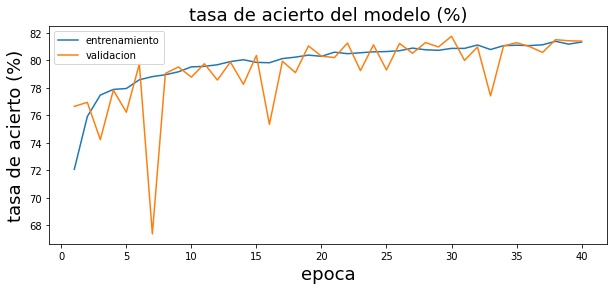

In [53]:
import os

acum_tr_acc = []
acum_val_acc = []

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

epochs=40

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]
    
    for e in range(epochs):
        history = model1_C1D175.fit(train_Xnps175, pd.get_dummies(train_Y175), 
                                validation_data=(val_Xnps175, pd.get_dummies(val_Y175)), 
                                batch_size=32, 
                                epochs=1, verbose=1,
                                callbacks=callbacks_list)
        
        acum_tr_acc = acum_tr_acc + history.history['accuracy']
        acum_val_acc = acum_val_acc + history.history['val_accuracy']
        
        if len(acum_tr_acc) > 1:
            clear_output()
            grafica_entrenamiento(acum_tr_acc, acum_val_acc)

In [54]:
y_pred_vl=model1_C1D175.predict(TX_val175)
print(y_pred_vl)

y_pred_val_am=np.argmax(y_pred_vl, axis=1)
print(y_pred_val_am)

[[0.8405523  0.11147558 0.0479722 ]
 [0.7461331  0.01914653 0.23472041]
 [0.83760375 0.07842836 0.08396786]
 ...
 [0.87239444 0.00619153 0.12141409]
 [0.22193907 0.04197289 0.73608804]
 [0.96897507 0.00396069 0.02706425]]
[0 0 0 ... 0 2 0]


In [55]:
from sklearn.metrics import classification_report

print(classification_report(val_Y175, y_pred_val_am))

              precision    recall  f1-score   support

           0       0.81      0.89      0.85    469348
           1       0.88      0.84      0.86    219834
           2       0.70      0.54      0.61    154955

    accuracy                           0.81    844137
   macro avg       0.80      0.76      0.77    844137
weighted avg       0.81      0.81      0.81    844137



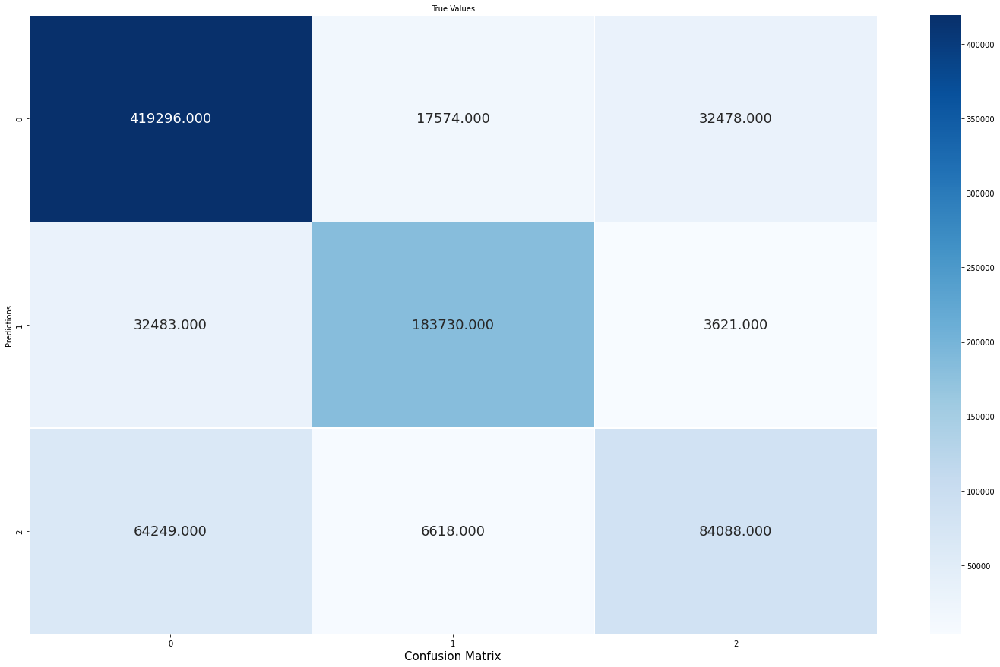

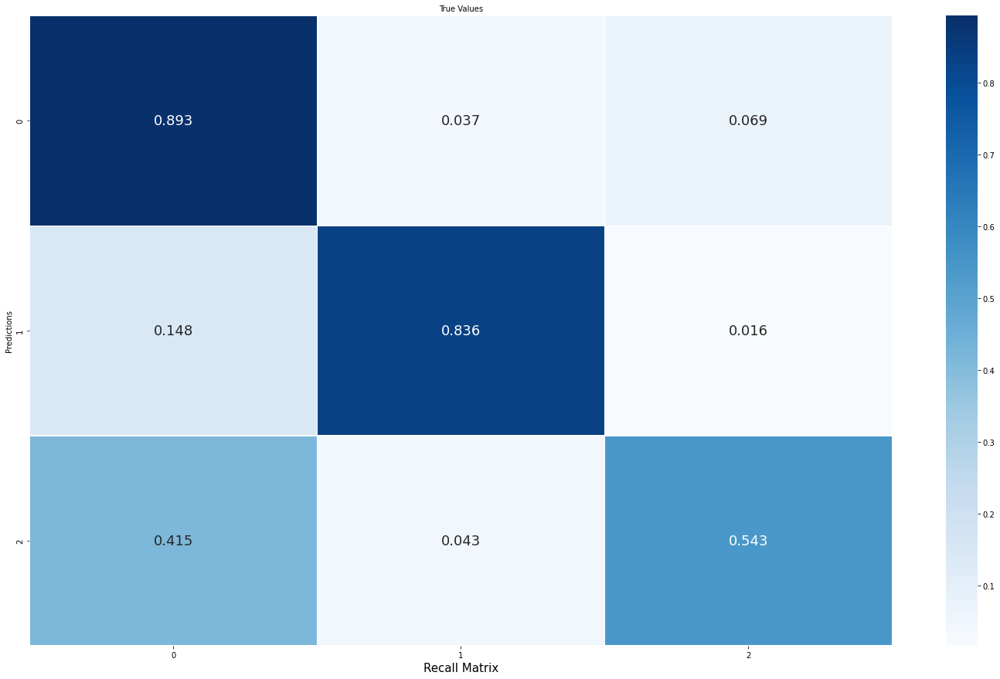

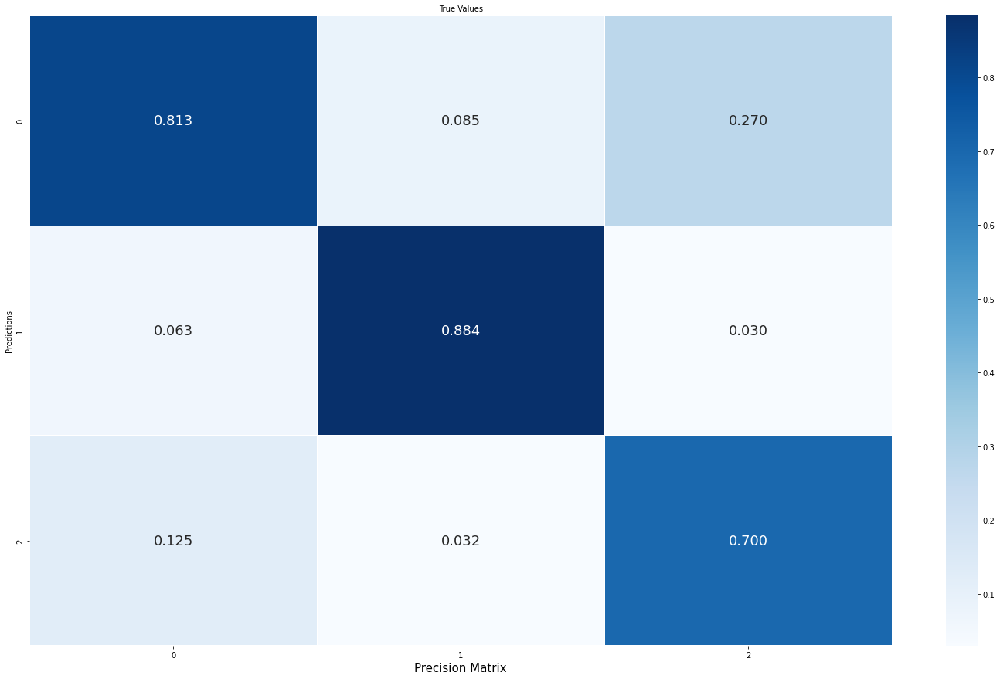

In [56]:
import seaborn as sns

confm=pd.crosstab(val_Y175, y_pred_val_am)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Seleccion de hiperparámetros con CNN-1D sobre los datos de 2018

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model1_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model1_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model1_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 91s 82ms/step - loss: 0.6124 - accuracy: 0.7583 - val_loss: 1.2997 - val_accuracy: 0.4900

Epoch 00001: val_accuracy improved from -inf to 0.48998, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 92s 83ms/step - loss: 0.6035 - accuracy: 0.7592 - val_loss: 0.9595 - val_accuracy: 0.6468

Epoch 00002: val_accuracy improved from 0.48998 to 0.64678, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 95s 85ms/step - loss: 0.5924 - accuracy: 0.7674 - val_loss: 1.0128 - val_accuracy: 0.5828

Epoch 00003: val_accuracy did not improve from 0.64678
Epoch 4/20
1111/1111 [==============================] - 94s 85ms/step - loss: 0.5920 - accuracy: 0.7651 - val_loss: 1.1268 - val_accuracy: 0.5534

Epoch 00004: val_accuracy did not improve from 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model2_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model2_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model2_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
556/556 [==============================] - 59s 104ms/step - loss: 0.8814 - accuracy: 0.6523 - val_loss: 0.9775 - val_accuracy: 0.4984

Epoch 00001: val_accuracy improved from -inf to 0.49836, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
556/556 [==============================] - 65s 116ms/step - loss: 0.6915 - accuracy: 0.7233 - val_loss: 0.5188 - val_accuracy: 0.7973

Epoch 00002: val_accuracy improved from 0.49836 to 0.79732, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
556/556 [==============================] - 62s 112ms/step - loss: 0.6454 - accuracy: 0.7426 - val_loss: 0.5878 - val_accuracy: 0.7349

Epoch 00003: val_accuracy did not improve from 0.79732
Epoch 4/20
556/556 [==============================] - 64s 116ms/step - loss: 0.6297 - accuracy: 0.7508 - val_loss: 0.5328 - val_accuracy: 0.7794

Epoch 00004: val_accuracy did not improve from 0.797

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model3_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model3_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model3_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 99s 88ms/step - loss: 1.1930 - accuracy: 0.5350 - val_loss: 0.8098 - val_accuracy: 0.6066

Epoch 00001: val_accuracy improved from -inf to 0.60656, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 100s 90ms/step - loss: 0.8274 - accuracy: 0.6483 - val_loss: 0.6429 - val_accuracy: 0.7072

Epoch 00002: val_accuracy improved from 0.60656 to 0.70724, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 102s 92ms/step - loss: 0.7763 - accuracy: 0.6838 - val_loss: 0.7785 - val_accuracy: 0.6298

Epoch 00003: val_accuracy did not improve from 0.70724
Epoch 4/20
1111/1111 [==============================] - 155s 140ms/step - loss: 0.7405 - accuracy: 0.7020 - val_loss: 0.6671 - val_accuracy: 0.7034

Epoch 00004: val_accuracy did not improve fr

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model4_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model4_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model4_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 102s 91ms/step - loss: 1.2841 - accuracy: 0.5341 - val_loss: 0.6558 - val_accuracy: 0.7191

Epoch 00001: val_accuracy improved from -inf to 0.71905, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 101s 91ms/step - loss: 0.8340 - accuracy: 0.6518 - val_loss: 0.6435 - val_accuracy: 0.7464

Epoch 00002: val_accuracy improved from 0.71905 to 0.74644, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 104s 93ms/step - loss: 0.7753 - accuracy: 0.6863 - val_loss: 0.7598 - val_accuracy: 0.6265

Epoch 00003: val_accuracy did not improve from 0.74644
Epoch 4/20
1111/1111 [==============================] - 103s 92ms/step - loss: 0.7459 - accuracy: 0.6983 - val_loss: 0.5653 - val_accuracy: 0.7556

Epoch 00004: val_accuracy improved from 0.74

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model5_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model5_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model5_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 101s 90ms/step - loss: 0.8457 - accuracy: 0.6687 - val_loss: 0.6615 - val_accuracy: 0.7012

Epoch 00001: val_accuracy improved from -inf to 0.70117, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 155s 139ms/step - loss: 0.6907 - accuracy: 0.7259 - val_loss: 0.6498 - val_accuracy: 0.7168

Epoch 00002: val_accuracy improved from 0.70117 to 0.71675, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 102s 92ms/step - loss: 0.6622 - accuracy: 0.7380 - val_loss: 0.8806 - val_accuracy: 0.6232

Epoch 00003: val_accuracy did not improve from 0.71675
Epoch 4/20
1111/1111 [==============================] - 99s 90ms/step - loss: 0.6389 - accuracy: 0.7486 - val_loss: 0.6795 - val_accuracy: 0.6920

Epoch 00004: val_accuracy did not improve fr

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model6_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model6_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model6_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 97s 86ms/step - loss: 1.2908 - accuracy: 0.5422 - val_loss: 0.9334 - val_accuracy: 0.5382

Epoch 00001: val_accuracy improved from -inf to 0.53823, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 155s 139ms/step - loss: 0.8183 - accuracy: 0.6630 - val_loss: 0.7007 - val_accuracy: 0.6854

Epoch 00002: val_accuracy improved from 0.53823 to 0.68536, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 97s 87ms/step - loss: 0.7603 - accuracy: 0.6921 - val_loss: 0.5397 - val_accuracy: 0.7761

Epoch 00003: val_accuracy improved from 0.68536 to 0.77611, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
1111/1111 [==============================] - 155s 139ms/step - loss: 0.7443 - acc

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model7_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model7_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model7_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 95s 84ms/step - loss: 0.8644 - accuracy: 0.6433 - val_loss: 1.2150 - val_accuracy: 0.5507

Epoch 00001: val_accuracy improved from -inf to 0.55070, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 93s 84ms/step - loss: 0.6996 - accuracy: 0.7002 - val_loss: 0.6158 - val_accuracy: 0.7307

Epoch 00002: val_accuracy improved from 0.55070 to 0.73074, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 82s 74ms/step - loss: 0.6586 - accuracy: 0.7158 - val_loss: 0.9514 - val_accuracy: 0.6391

Epoch 00003: val_accuracy did not improve from 0.73074
Epoch 4/20
1111/1111 [==============================] - 83s 74ms/step - loss: 0.6467 - accuracy: 0.7276 - val_loss: 0.7234 - val_accuracy: 0.6378

Epoch 00004: val_accuracy did not improve from 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model8_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model8_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model8_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1111/1111 [==============================] - 89s 79ms/step - loss: 0.8939 - accuracy: 0.6385 - val_loss: 0.8136 - val_accuracy: 0.6291

Epoch 00001: val_accuracy improved from -inf to 0.62910, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1111/1111 [==============================] - 94s 85ms/step - loss: 0.6989 - accuracy: 0.6995 - val_loss: 0.6925 - val_accuracy: 0.6700

Epoch 00002: val_accuracy improved from 0.62910 to 0.66998, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1111/1111 [==============================] - 94s 85ms/step - loss: 0.6599 - accuracy: 0.7165 - val_loss: 0.6425 - val_accuracy: 0.7085

Epoch 00003: val_accuracy improved from 0.66998 to 0.70854, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
1111/1111 [==============================] - 94s 85ms/step - loss: 0.6489 - accurac

##Entrenamiento y resultados obtenidos con el mejor modelo CNN-1D encontrado en 2018

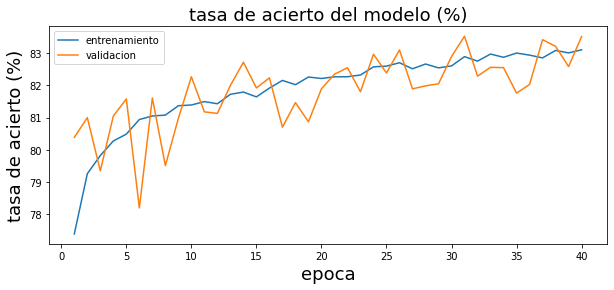

In [ ]:
import os

acum_tr_acc = []
acum_val_acc = []

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

epochs=40

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]
    
    for e in range(epochs):
        history = model1_C1D175.fit(train_Xnps185, pd.get_dummies(train_Y185), 
                                validation_data=(val_Xnps185, pd.get_dummies(val_Y185)), 
                                batch_size=batch_size, 
                                epochs=1, verbose=1,
                                callbacks=callbacks_list)
        
        acum_tr_acc = acum_tr_acc + history.history['accuracy']
        acum_val_acc = acum_val_acc + history.history['val_accuracy']
        
        if len(acum_tr_acc) > 1:
            clear_output()
            grafica_entrenamiento(acum_tr_acc, acum_val_acc)

In [ ]:
y_pred_vl=model1_C1D175.predict(val_Xnps185)
print(y_pred_vl)

y_pred_val_am=np.argmax(y_pred_vl, axis=1)
print(y_pred_val_am)

[[5.3659970e-01 1.9127633e-01 2.7212396e-01]
 [6.4809310e-01 3.2526258e-01 2.6644306e-02]
 [1.6445585e-01 1.4611742e-03 8.3408302e-01]
 ...
 [4.5046452e-01 1.6519058e-01 3.8434494e-01]
 [9.9684530e-01 2.5136131e-03 6.4107281e-04]
 [5.4804337e-01 9.9732444e-02 3.5222417e-01]]
[0 0 2 ... 0 0 0]


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(val_Y185, y_pred_val_am))

              precision    recall  f1-score   support

           0       0.84      0.85      0.84    400234
           1       0.90      0.82      0.85    215759
           2       0.78      0.83      0.80    228248

    accuracy                           0.84    844241
   macro avg       0.84      0.83      0.83    844241
weighted avg       0.84      0.84      0.84    844241



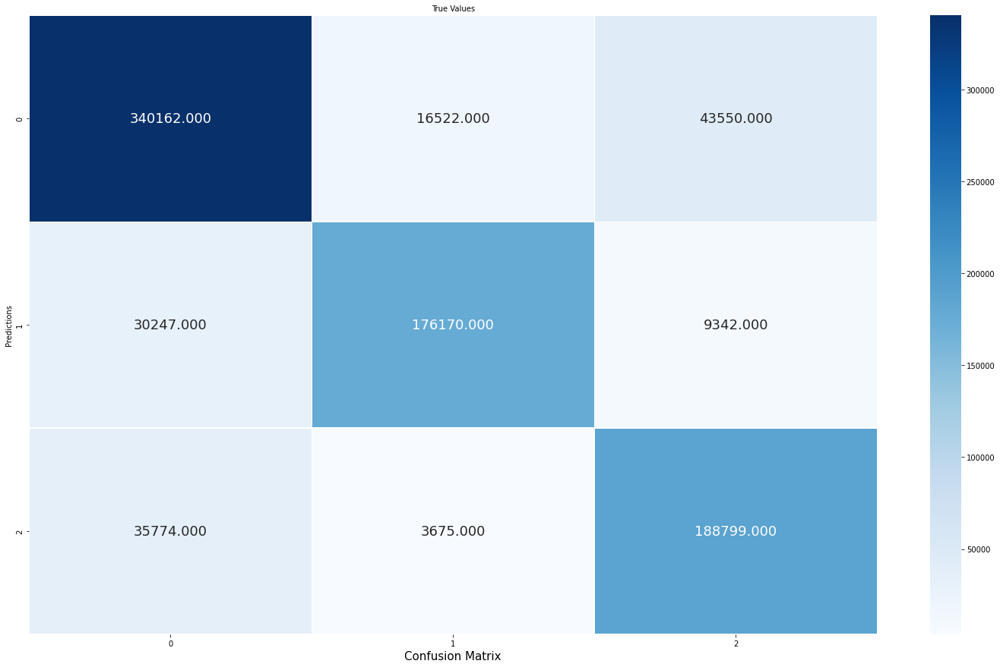

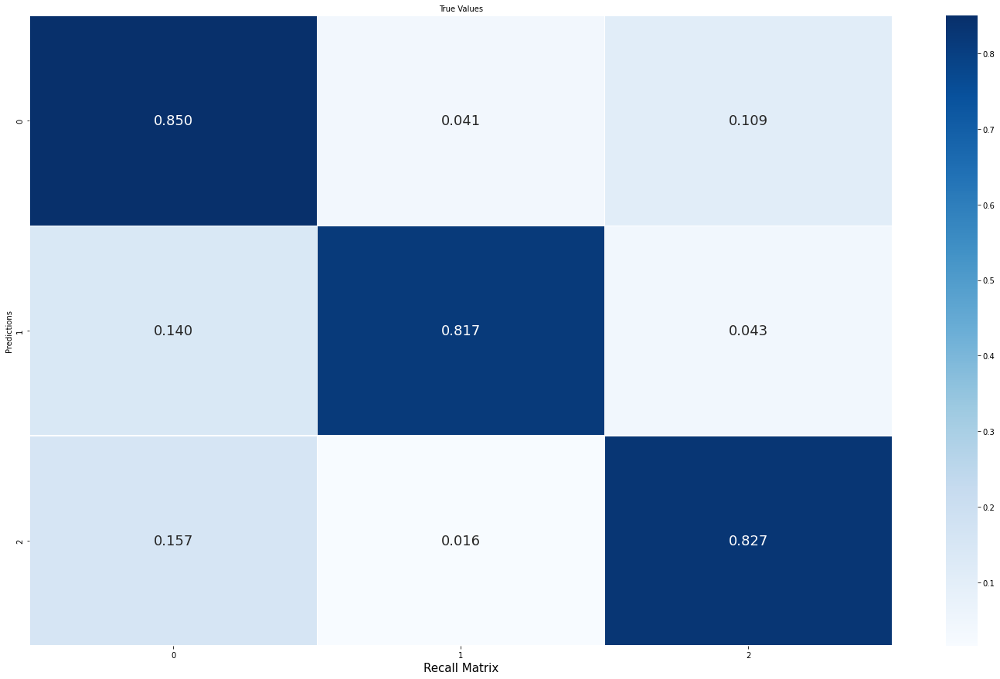

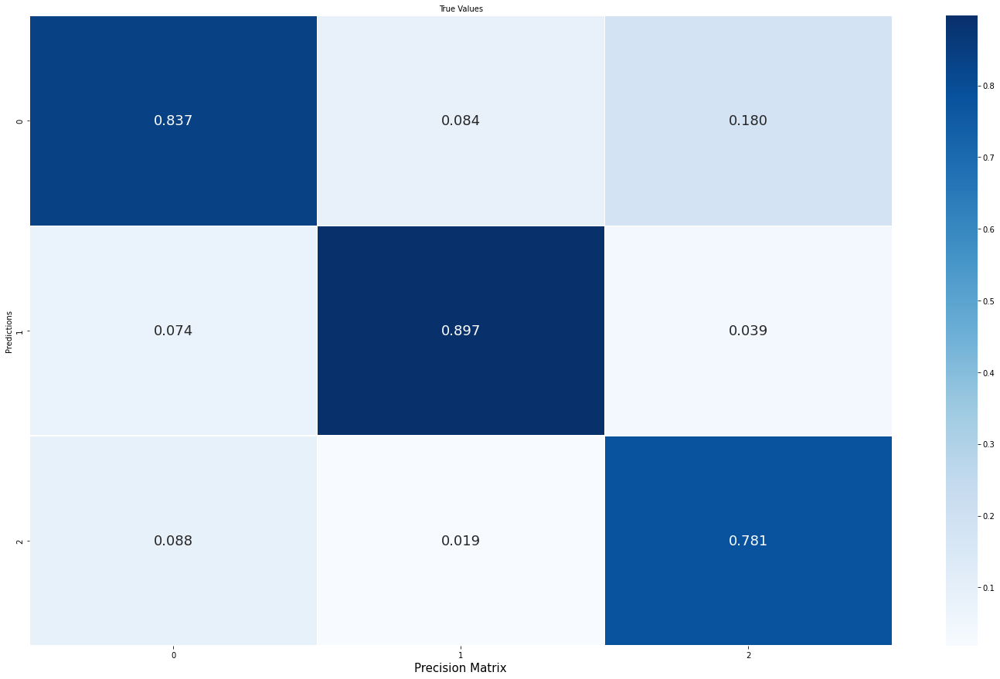

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y185, y_pred_val_am)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Selección de hiperparámetros con CNN-1D sobre los datos de 2019

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model1_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model1_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model1_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1112/1112 [==============================] - 85s 76ms/step - loss: 0.9455 - accuracy: 0.6850 - val_loss: 0.5928 - val_accuracy: 0.7608

Epoch 00001: val_accuracy improved from -inf to 0.76077, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1112/1112 [==============================] - 94s 85ms/step - loss: 0.7883 - accuracy: 0.7371 - val_loss: 0.5919 - val_accuracy: 0.7526

Epoch 00002: val_accuracy did not improve from 0.76077
Epoch 3/20
1112/1112 [==============================] - 89s 80ms/step - loss: 0.7481 - accuracy: 0.7514 - val_loss: 0.5027 - val_accuracy: 0.8000

Epoch 00003: val_accuracy improved from 0.76077 to 0.80000, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
1112/1112 [==============================] - 88s 79ms/step - loss: 0.7164 - accuracy: 0.7648 - val_loss: 0.5602 - val_accuracy: 0.7718

Epoch 00004: val_accuracy did not improve from 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model2_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model2_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model2_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1112/1112 [==============================] - 95s 84ms/step - loss: 0.9765 - accuracy: 0.6801 - val_loss: 0.6411 - val_accuracy: 0.7325

Epoch 00001: val_accuracy improved from -inf to 0.73248, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1112/1112 [==============================] - 92s 83ms/step - loss: 0.7927 - accuracy: 0.7362 - val_loss: 0.6510 - val_accuracy: 0.7046

Epoch 00002: val_accuracy did not improve from 0.73248
Epoch 3/20
1112/1112 [==============================] - 92s 82ms/step - loss: 0.7477 - accuracy: 0.7490 - val_loss: 0.5401 - val_accuracy: 0.7775

Epoch 00003: val_accuracy improved from 0.73248 to 0.77748, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
1112/1112 [==============================] - 94s 85ms/step - loss: 0.7229 - accuracy: 0.7597 - val_loss: 0.6813 - val_accuracy: 0.7106

Epoch 00004: val_accuracy did not improve from 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model3_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model3_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model3_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1112/1112 [==============================] - 99s 89ms/step - loss: 0.6856 - accuracy: 0.7731 - val_loss: 0.4844 - val_accuracy: 0.8001

Epoch 00001: val_accuracy improved from -inf to 0.80007, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1112/1112 [==============================] - 96s 86ms/step - loss: 0.6811 - accuracy: 0.7693 - val_loss: 0.4692 - val_accuracy: 0.8068

Epoch 00002: val_accuracy improved from 0.80007 to 0.80679, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1112/1112 [==============================] - 88s 79ms/step - loss: 0.6904 - accuracy: 0.7654 - val_loss: 0.5465 - val_accuracy: 0.7687

Epoch 00003: val_accuracy did not improve from 0.80679
Epoch 4/20
1112/1112 [==============================] - 87s 79ms/step - loss: 0.6814 - accuracy: 0.7700 - val_loss: 0.5228 - val_accuracy: 0.7789

Epoch 00004: val_accuracy did not improve from 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model4_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model4_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model4_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1112/1112 [==============================] - 95s 84ms/step - loss: 1.4141 - accuracy: 0.5697 - val_loss: 0.6727 - val_accuracy: 0.7059

Epoch 00001: val_accuracy improved from -inf to 0.70586, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1112/1112 [==============================] - 77s 70ms/step - loss: 0.9080 - accuracy: 0.6756 - val_loss: 0.7068 - val_accuracy: 0.6895

Epoch 00002: val_accuracy did not improve from 0.70586
Epoch 3/20
1112/1112 [==============================] - 77s 70ms/step - loss: 0.8567 - accuracy: 0.7038 - val_loss: 0.6193 - val_accuracy: 0.7341

Epoch 00003: val_accuracy improved from 0.70586 to 0.73406, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
1112/1112 [==============================] - 77s 69ms/step - loss: 0.8338 - accuracy: 0.7207 - val_loss: 0.6994 - val_accuracy: 0.7024

Epoch 00004: val_accuracy did not improve from 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model5_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model5_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model5_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1112/1112 [==============================] - 81s 72ms/step - loss: 0.9814 - accuracy: 0.6777 - val_loss: 0.7028 - val_accuracy: 0.6806

Epoch 00001: val_accuracy improved from -inf to 0.68057, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1112/1112 [==============================] - 82s 74ms/step - loss: 0.7908 - accuracy: 0.7364 - val_loss: 0.6009 - val_accuracy: 0.7560

Epoch 00002: val_accuracy improved from 0.68057 to 0.75603, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1112/1112 [==============================] - 80s 72ms/step - loss: 0.7443 - accuracy: 0.7525 - val_loss: 0.5383 - val_accuracy: 0.7718

Epoch 00003: val_accuracy improved from 0.75603 to 0.77179, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
1112/1112 [==============================] - 94s 85ms/step - loss: 0.7211 - accurac

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model6_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model6_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model6_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
556/556 [==============================] - 53s 93ms/step - loss: 1.5145 - accuracy: 0.5500 - val_loss: 0.9162 - val_accuracy: 0.4646

Epoch 00001: val_accuracy improved from -inf to 0.46456, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
556/556 [==============================] - 52s 94ms/step - loss: 0.9734 - accuracy: 0.6438 - val_loss: 0.8072 - val_accuracy: 0.6409

Epoch 00002: val_accuracy improved from 0.46456 to 0.64094, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
556/556 [==============================] - 53s 96ms/step - loss: 0.8975 - accuracy: 0.6851 - val_loss: 0.6029 - val_accuracy: 0.7619

Epoch 00003: val_accuracy improved from 0.64094 to 0.76192, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
556/556 [==============================] - 52s 94ms/step - loss: 0.8530 - accuracy: 0.706

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model7_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model7_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model7_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1112/1112 [==============================] - 78s 70ms/step - loss: 0.5741 - accuracy: 0.8067 - val_loss: 0.4643 - val_accuracy: 0.8134

Epoch 00001: val_accuracy improved from -inf to 0.81338, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1112/1112 [==============================] - 93s 84ms/step - loss: 0.5820 - accuracy: 0.8035 - val_loss: 0.4342 - val_accuracy: 0.8255

Epoch 00002: val_accuracy improved from 0.81338 to 0.82549, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/20
1112/1112 [==============================] - 93s 84ms/step - loss: 0.5786 - accuracy: 0.8059 - val_loss: 0.4505 - val_accuracy: 0.8154

Epoch 00003: val_accuracy did not improve from 0.82549
Epoch 4/20
1112/1112 [==============================] - 77s 69ms/step - loss: 0.5713 - accuracy: 0.8072 - val_loss: 0.4841 - val_accuracy: 0.7929

Epoch 00004: val_accuracy did not improve from 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model8_C1D175.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model8_C1D175.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model8_C1D175.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
1112/1112 [==============================] - 84s 75ms/step - loss: 0.9817 - accuracy: 0.6772 - val_loss: 0.6245 - val_accuracy: 0.7273

Epoch 00001: val_accuracy improved from -inf to 0.72731, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
1112/1112 [==============================] - 83s 75ms/step - loss: 0.7878 - accuracy: 0.7359 - val_loss: 0.6869 - val_accuracy: 0.6855

Epoch 00002: val_accuracy did not improve from 0.72731
Epoch 3/20
1112/1112 [==============================] - 87s 78ms/step - loss: 0.7480 - accuracy: 0.7500 - val_loss: 0.5511 - val_accuracy: 0.7591

Epoch 00003: val_accuracy improved from 0.72731 to 0.75906, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/20
1112/1112 [==============================] - 87s 78ms/step - loss: 0.7172 - accuracy: 0.7596 - val_loss: 0.6555 - val_accuracy: 0.6734

Epoch 00004: val_accuracy did not improve from 0

In [ ]:
TX_val175=tf.convert_to_tensor(val_Xnps175, dtype=float, dtype_hint=None, name=None)

TX_train175=tf.convert_to_tensor(train_Xnps175,dtype=float, dtype_hint=None, name=None)
print(TX_train175)


TX_val185=tf.convert_to_tensor(val_Xnps185, dtype=float, dtype_hint=None, name=None)

TX_train185=tf.convert_to_tensor(train_Xnps185,dtype=float, dtype_hint=None, name=None)
print(TX_train185)


TX_val195=tf.convert_to_tensor(val_Xnps195, dtype=float, dtype_hint=None, name=None)

TX_train195=tf.convert_to_tensor(train_Xnps195,dtype=float, dtype_hint=None, name=None)
print(TX_train195)

tf.Tensor(
[[[0.22]
  [0.21]
  [0.22]
  ...
  [0.2 ]
  [0.18]
  [0.19]]

 [[0.23]
  [0.28]
  [0.36]
  ...
  [0.2 ]
  [0.19]
  [0.21]]

 [[0.32]
  [0.41]
  [0.49]
  ...
  [0.21]
  [0.2 ]
  [0.22]]

 ...

 [[0.19]
  [0.28]
  [0.39]
  ...
  [0.26]
  [0.26]
  [0.3 ]]

 [[0.29]
  [0.31]
  [0.31]
  ...
  [0.19]
  [0.19]
  [0.19]]

 [[0.21]
  [0.26]
  [0.38]
  ...
  [0.2 ]
  [0.18]
  [0.19]]], shape=(44428, 22, 1), dtype=float32)
tf.Tensor(
[[[0.19]
  [0.21]
  [0.24]
  ...
  [0.26]
  [0.23]
  [0.22]]

 [[0.2 ]
  [0.22]
  [0.26]
  ...
  [0.3 ]
  [0.3 ]
  [0.21]]

 [[0.18]
  [0.22]
  [0.27]
  ...
  [0.19]
  [0.18]
  [0.17]]

 ...

 [[0.19]
  [0.21]
  [0.22]
  ...
  [0.19]
  [0.18]
  [0.22]]

 [[0.17]
  [0.18]
  [0.22]
  ...
  [0.3 ]
  [0.31]
  [0.29]]

 [[0.24]
  [0.25]
  [0.26]
  ...
  [0.26]
  [0.24]
  [0.24]]], shape=(44433, 22, 1), dtype=float32)
tf.Tensor(
[[[0.23]
  [0.22]
  [0.21]
  ...
  [0.27]
  [0.28]
  [0.28]]

 [[0.21]
  [0.21]
  [0.2 ]
  ...
  [0.27]
  [0.28]
  [0.27]]

 [[0.21]
  

In [ ]:
import os

acum_tr_acc = []
acum_val_acc = []

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

epochs=40

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]
    
    for e in range(epochs):
        history = model5_C1D175.fit(tf.convert_to_tensor(train_X175), pd.get_dummies(train_Y175), 
                                validation_data=(tf.convert_to_tensor(), pd.get_dummies(val_Y175)), 
                                batch_size=batch_size, 
                                epochs=1, verbose=1,
                                callbacks=callbacks_list)
        
        acum_tr_acc = acum_tr_acc + history.history['accuracy']
        acum_val_acc = acum_val_acc + history.history['val_accuracy']
        
        if len(acum_tr_acc) > 1:
            clear_output()
            grafica_entrenamiento(acum_tr_acc, acum_val_acc)

ValueError: ignored

In [ ]:
#Tdatos_TST=tf.convert_to_tensor(test_Xnps, dtype=float, dtype_hint=None, name=None)
#y_pred=model_C1D.predict(Tdatos_TST)
y_pred_vl=model5_C1D175.predict(TX_val175)
print(y_pred_vl)

#y_pred_am=np.argmax(y_pred, axis=1)
y_pred_val_am=np.argmax(y_pred_vl, axis=1)
print(y_pred_val_am)

[[0.00683366 0.01431305 0.9788533 ]
 [0.3347439  0.38444844 0.28080773]
 [0.555646   0.34662047 0.09773351]
 ...
 [0.5244392  0.03927208 0.43628874]
 [0.2018061  0.76682484 0.03136904]
 [0.9686248  0.00165943 0.02971587]]
[2 1 0 ... 0 1 0]


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(val_Y175, y_pred_val_am))

#print(classification_report(test_Y, y_pred_am))

              precision    recall  f1-score   support

           0       0.80      0.91      0.86    469403
           1       0.91      0.83      0.87    219765
           2       0.72      0.52      0.60    154969

    accuracy                           0.82    844137
   macro avg       0.81      0.75      0.77    844137
weighted avg       0.82      0.82      0.81    844137



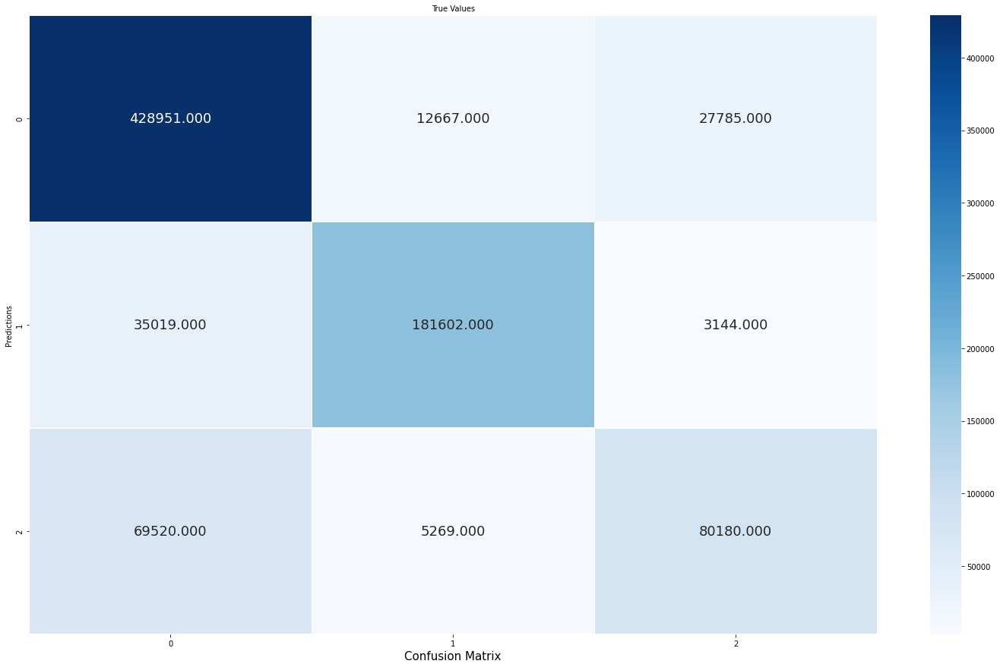

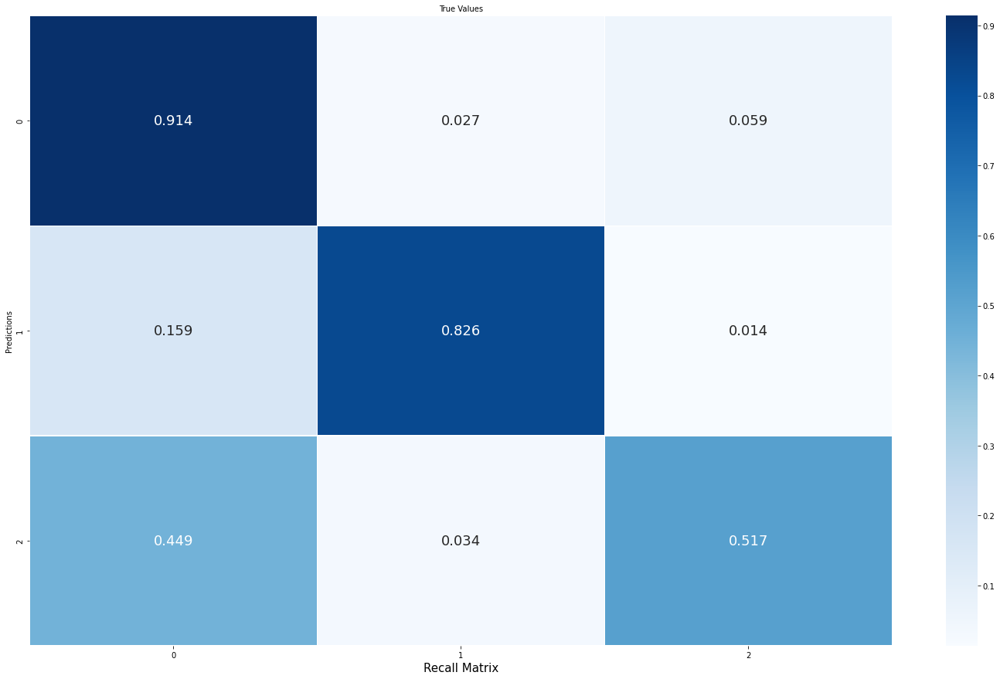

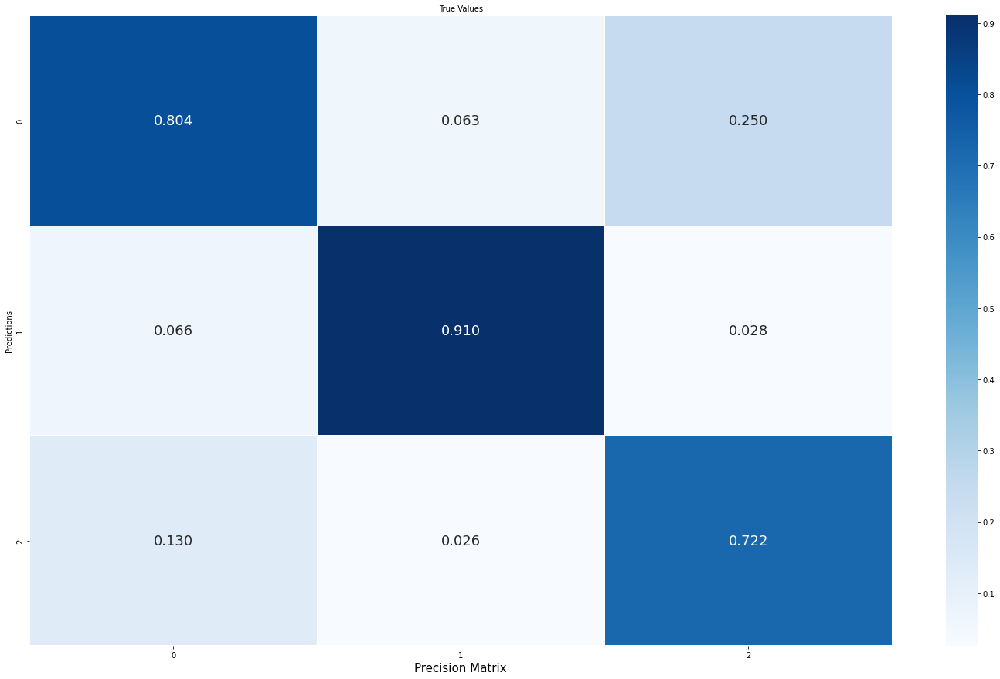

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y175, y_pred_val_am)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

## Entrenamiento y resultados obtenidos con mejor modelo CNN-1D sobre los datos de 2019

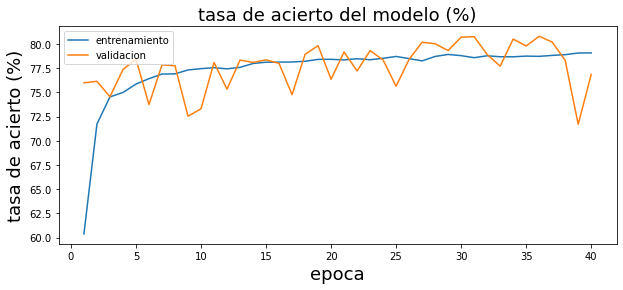

In [ ]:
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

acum_tr_acc=[]
acum_val_acc=[]

epochs=40


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]
    
    for e in range(epochs):
        history = model3_C1D175.fit(train_Xnps195, pd.get_dummies(train_Y195), 
                                validation_data=(val_Xnps195, pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=1, verbose=1,
                                callbacks=callbacks_list)
        
        acum_tr_acc = acum_tr_acc + history.history['accuracy']
        acum_val_acc = acum_val_acc + history.history['val_accuracy']
        
        if len(acum_tr_acc) > 1:
            clear_output()
            grafica_entrenamiento(acum_tr_acc, acum_val_acc)

In [ ]:
#Tdatos_TST=tf.convert_to_tensor(test_Xnps, dtype=float, dtype_hint=None, name=None)
#y_pred=model_C1D.predict(Tdatos_TST)
y_pred_vl=model3_C1D175.predict(TX_val195)
print(y_pred_vl)

#y_pred_am=np.argmax(y_pred, axis=1)
y_pred_val_am=np.argmax(y_pred_vl, axis=1)
print(y_pred_val_am)

[[3.3774577e-02 5.8119069e-03 9.6041352e-01]
 [2.0850076e-01 2.8013771e-02 7.6348549e-01]
 [1.3320835e-01 2.5560467e-02 8.4123123e-01]
 ...
 [9.8838717e-01 7.5256913e-03 4.0870765e-03]
 [2.3347368e-03 9.9762887e-01 3.6427293e-05]
 [2.0780913e-03 9.9791723e-01 4.6982509e-06]]
[2 2 2 ... 0 1 1]


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(val_Y195, y_pred_val_am))
#print(classification_report(test_Y, y_pred_am))

              precision    recall  f1-score   support

           0       0.64      0.89      0.75    299566
           1       0.92      0.72      0.81    221105
           2       0.87      0.69      0.77    324404

    accuracy                           0.77    845075
   macro avg       0.81      0.77      0.77    845075
weighted avg       0.80      0.77      0.77    845075



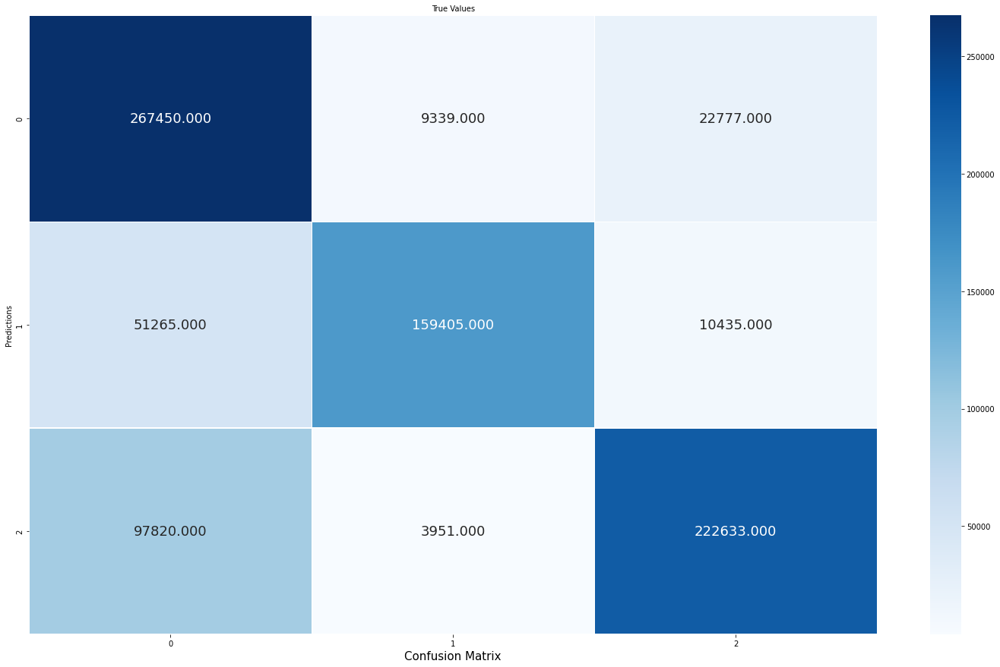

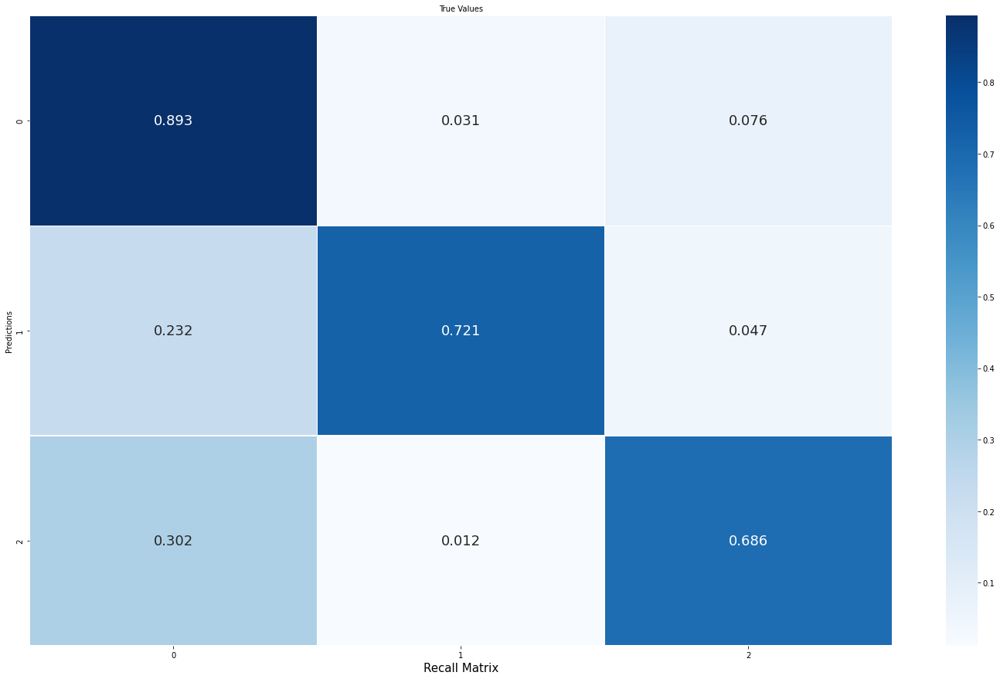

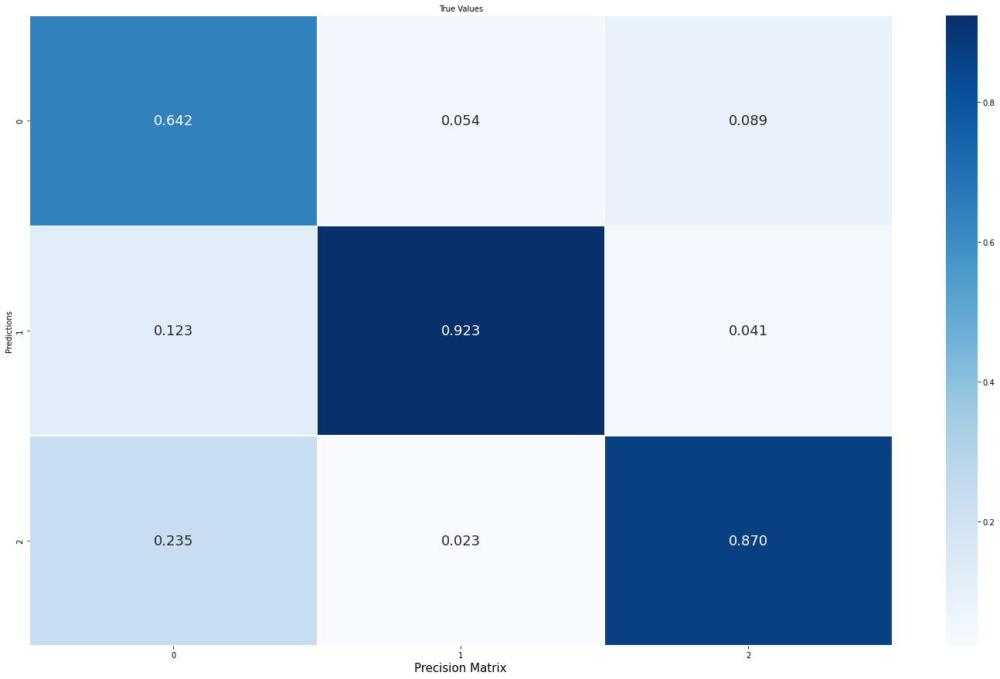

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y195, y_pred_val_am)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

#Modelo Light Gradient Boosting Classifier

##Random Grid Search con LGBC sobre datos de 2017

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from lightgbm import LGBMClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from matplotlib import pyplot

# Number of trees in random forest
n_estimators = [100, 200, 300, 400]
# Number of features to consider at every split
class_weight=[None, class_weight175]

# Maximum number of levels in tree
max_depth = [-1, 10,15,20,25,30,35]

#Learning rate
learning_rate=[0.1, 0.05, 0.01, 0.001]

#num leaves
num_leaves=[30, 35, 40, 45, 50, 55, 60]

#subsample for bin
subsample_for_bin=[1000, 5000, 10000, 15000, 20000, 25000]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'class_weight': class_weight,
               'max_depth': max_depth,
               'learning_rate': learning_rate,
               'num_leaves': num_leaves,
               'subsample_for_bin': subsample_for_bin}

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
lgbc = LGBMClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
lgbc_random17= RandomizedSearchCV(estimator = lgbc, param_distributions = random_grid, scoring='balanced_accuracy' ,n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbc_random17.fit(train_X175, train_Y175)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   37.6s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 11.9min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective=None,
                                            random_state=None, reg_alpha=0.0,
                                            reg_lambda=0.0, sile...
                                                         array([0.59956815, 1.28330445, 1.80866308])],
                      

In [ ]:
lgbc_random17.best_params_

{'class_weight': None,
 'learning_rate': 0.1,
 'max_depth': 35,
 'n_estimators': 300,
 'num_leaves': 55,
 'subsample_for_bin': 5000}

In [ ]:
lgbc_random17.cv_results_

In [ ]:
lgbc_random17.best_estimator_

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from lightgbm import LGBMClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from matplotlib import pyplot

model=LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

model.fit(train_X175, train_Y175)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
model=lgbc_random17.best_estimator_
model.fit(train_X175, train_Y175)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
lgbc_random17.best_score_

0.7670867862663469

In [ ]:
#y_pred=model.predict(np.array(ttrain_X))
#y_pred_train=model.predict(np.array(ttrain_X))
y_pred_val=model.predict(np.array(val_X175))
#y_pred_test=model.predict(np.array(test_X))

##Resultados obtenidos sobre los datos de 2017

In [ ]:
from sklearn.metrics import classification_report
#print(classification_report(ttrain_Y, y_pred_train))
print(classification_report(val_Y175, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.82      0.91      0.86    469403
           1       0.90      0.86      0.88    219765
           2       0.75      0.54      0.63    154969

    accuracy                           0.83    844137
   macro avg       0.82      0.77      0.79    844137
weighted avg       0.83      0.83      0.82    844137



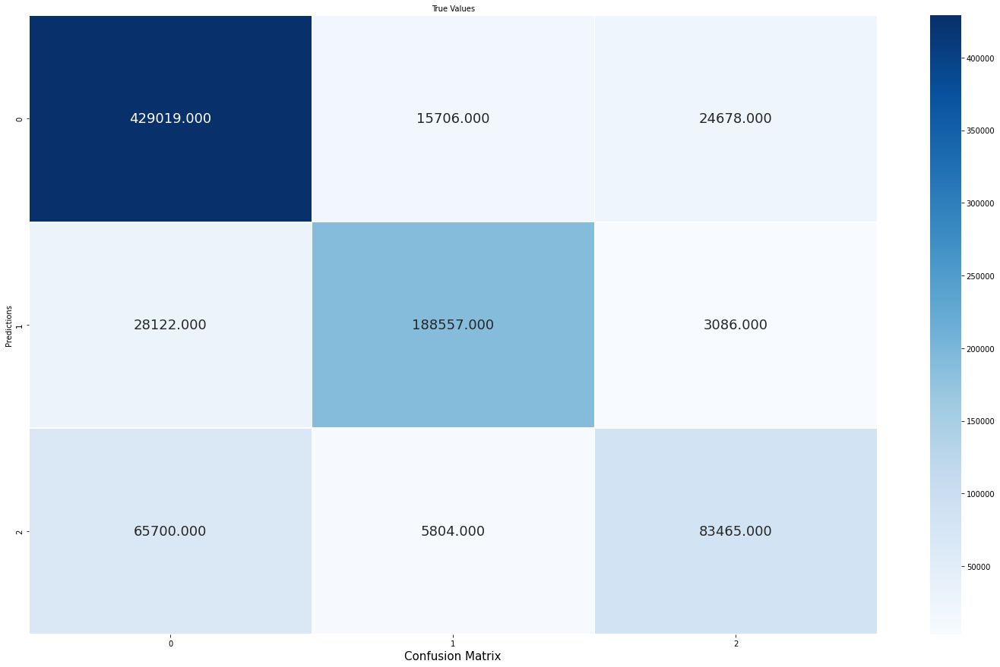

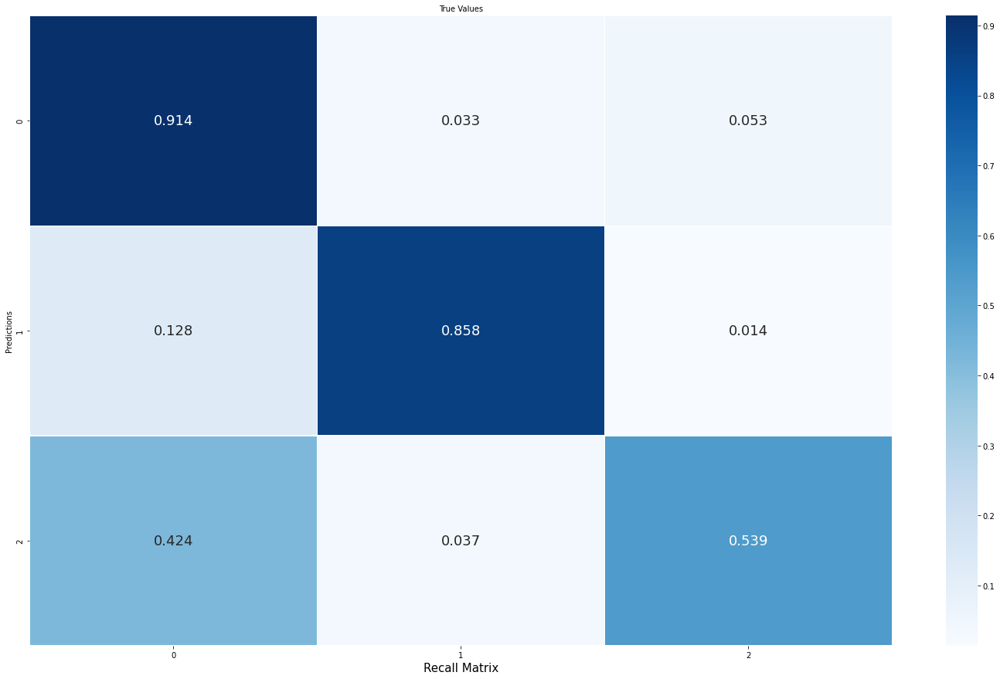

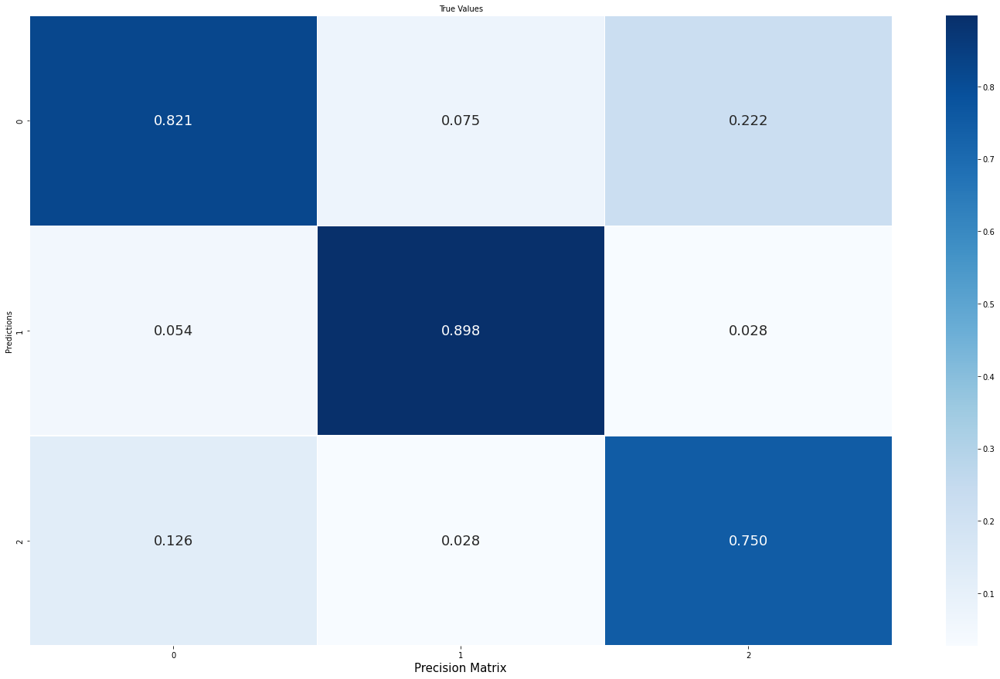

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y175, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Importancia de características en LGBC sobre datos de 2017

In [ ]:
!pip install eli5

In [ ]:
for i in range(22):
  val_X175.iloc[:,i]=pd.to_numeric(val_X175.iloc[:,i])

In [ ]:
import eli5

from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state=1).fit(train_X175, train_Y175)

eli5.show_weights(perm, feature_names= val_X175.columns.tolist())

Weight,Feature
0.0862 ± 0.0024,I170509
0.0681 ± 0.0015,I170615
0.0660 ± 0.0011,I170526
0.0465 ± 0.0013,I170630
0.0433 ± 0.0017,I170406
0.0408 ± 0.0022,I170208
0.0397 ± 0.0013,I170320
0.0290 ± 0.0019,I171003
0.0264 ± 0.0021,I170911
0.0263 ± 0.0016,I170814


In [ ]:
!pip install pdpbox

     |████████████████████████████████| 34.0 MB 67 kB/s 
     |████████████████████████████████| 13.1 MB 32.1 MB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.1-py3-none-any.whl size=35758225 sha256=d84c0efcef367f01fa3b7b0fdce9a0018f48b65c3a7e3ee1cc10a4a658c92b9c
  Stored in directory: /root/.cache/pip/wheels/f4/d0/1a/b80035625c53131f52906a6fc4dd690d8efd2bf8af6a4015eb
Successfully built pdpbox
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


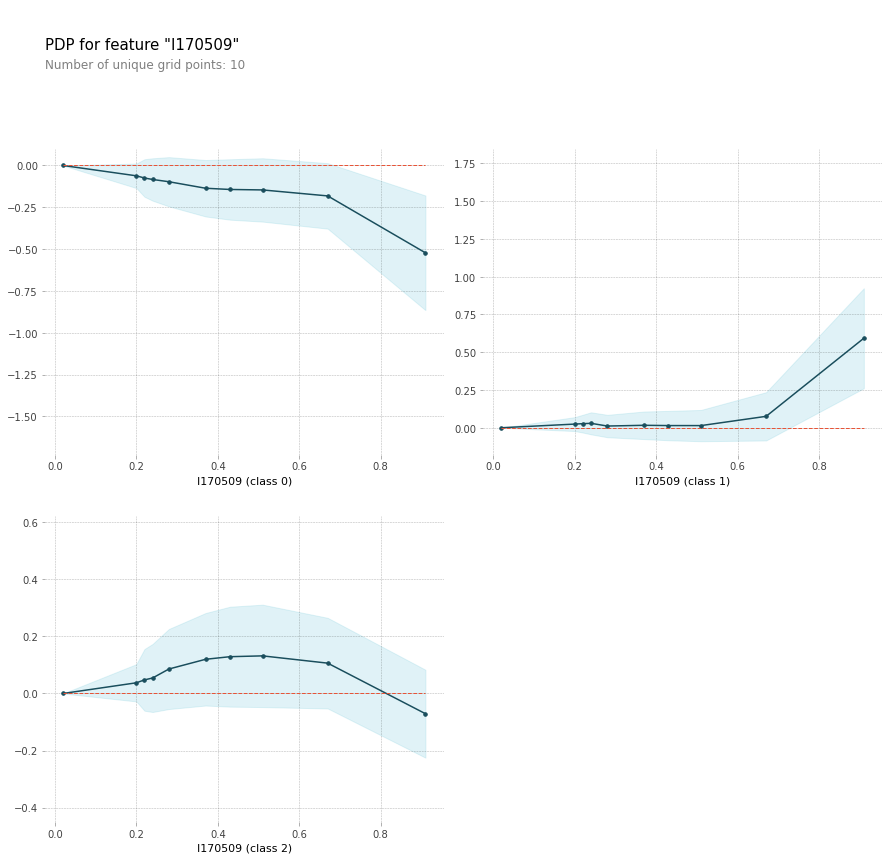

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='I170509'
feature_names=val_X175.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X175, model_features=val_X175.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

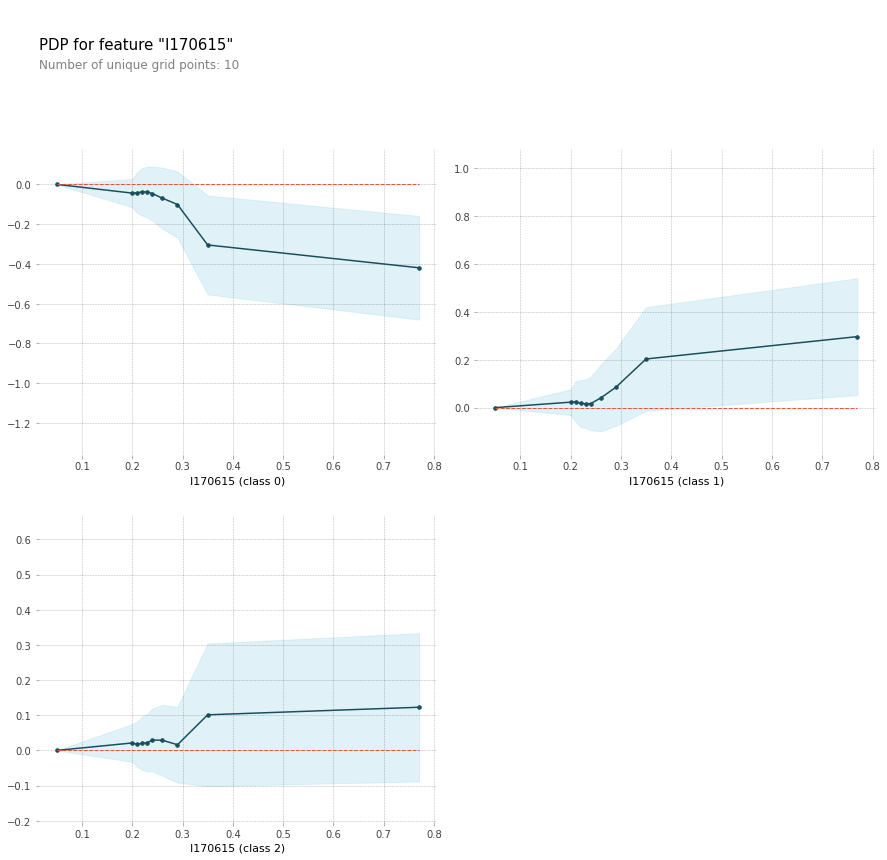

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='I170615'
feature_names=val_X175.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X175, model_features=val_X175.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

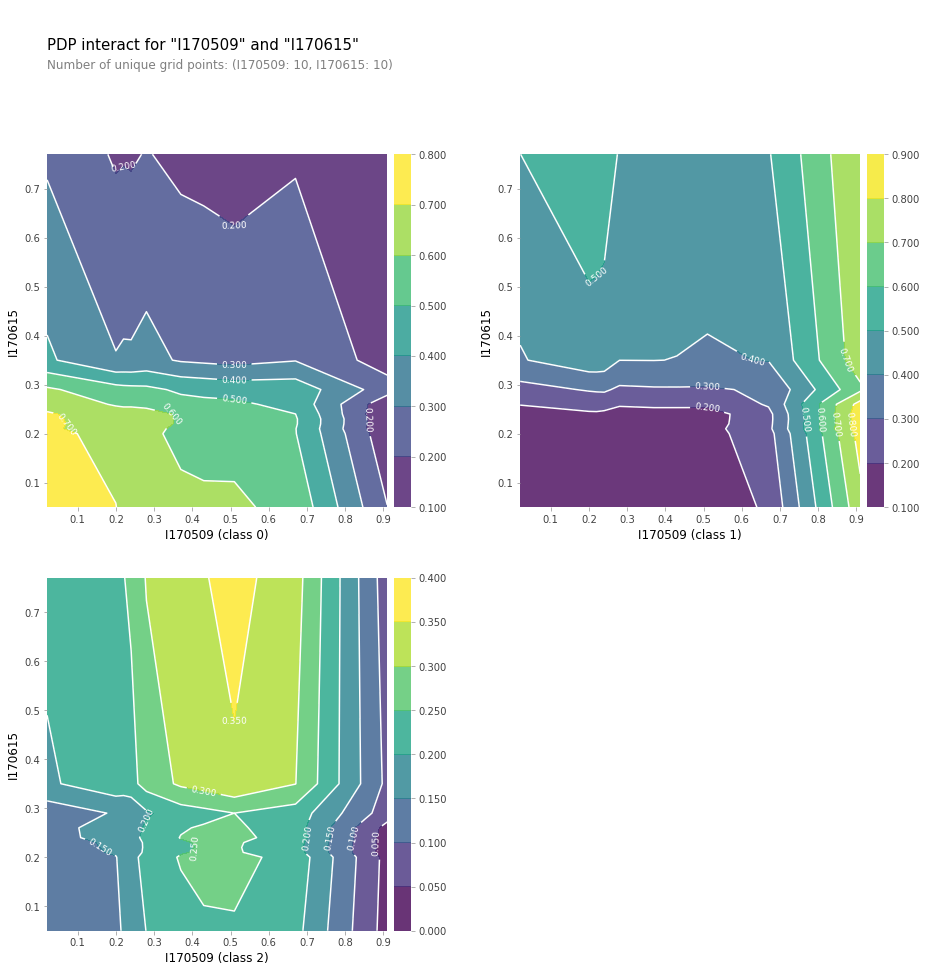

In [ ]:
features_to_plot=['I170509', 'I170615']
inter1=pdp.pdp_interact(model=model, dataset=val_X175, model_features=feature_names, features=features_to_plot)

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot)
plt.show()

##Explicabilidad con LGBC sobre los datos de 2017

In [ ]:
!pip install shap

     |████████████████████████████████| 356 kB 5.1 MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491654 sha256=cfc1207b5fd496b92a17106f20dadff3264f7426a9abd6e60d8520459c2ed715
  Stored in directory: /root/.cache/pip/wheels/ca/25/8f/6ae5df62c32651cd719e972e738a8aaa4a87414c4d2b14c9c0
Successfully built shap


In [ ]:
import shap

row_to_show = 14

data_for_prediction=val_X175.iloc[row_to_show]
data_for_prediction_array = data_for_prediction.values.reshape(1,-1)
print(model.predict_proba(data_for_prediction_array))



[[0.13685192 0.51545934 0.34768873]]


In [ ]:
k_explainer= shap.KernelExplainer(model.predict_proba, train_X175.iloc[0:50, :])
k_shap_values=k_explainer.shap_values(data_for_prediction)


In [ ]:
#Sobre Clase de Secano
shap.initjs()
shap.force_plot(k_explainer.expected_value[0], k_shap_values[0], data_for_prediction)

In [ ]:
#Sobre Clase de Regadío
shap.initjs()
shap.force_plot(k_explainer.expected_value[1], k_shap_values[1], data_for_prediction)


In [ ]:
#Sobre Clase de Suelo
shap.initjs()
shap.force_plot(k_explainer.expected_value[2], k_shap_values[2], data_for_prediction)

  0%|          | 0/1500 [00:00<?, ?it/s]

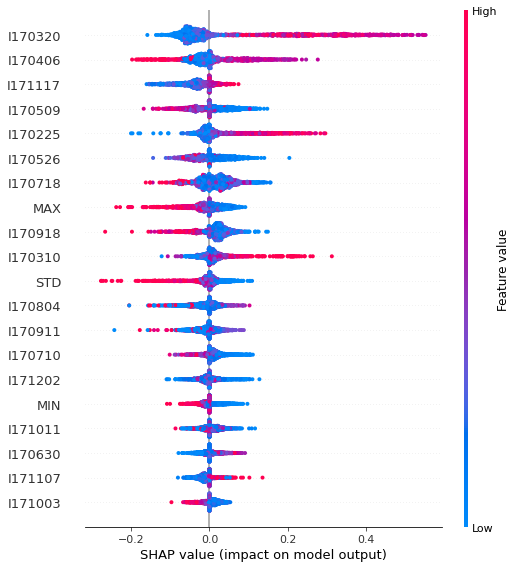

In [ ]:
#Sobre clase Secano

shap.initjs()

shap_values=k_explainer.shap_values(val_X175.iloc[0:1500, :])
shap.summary_plot(shap_values[0], val_X175.iloc[0:1500, :])

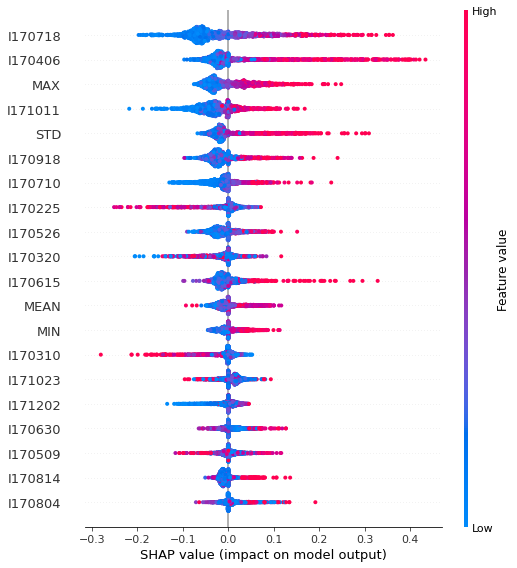

In [ ]:
#Sobre Clase Regadío
shap.initjs()


shap.summary_plot(shap_values[1], val_X175.iloc[0:1500, :])

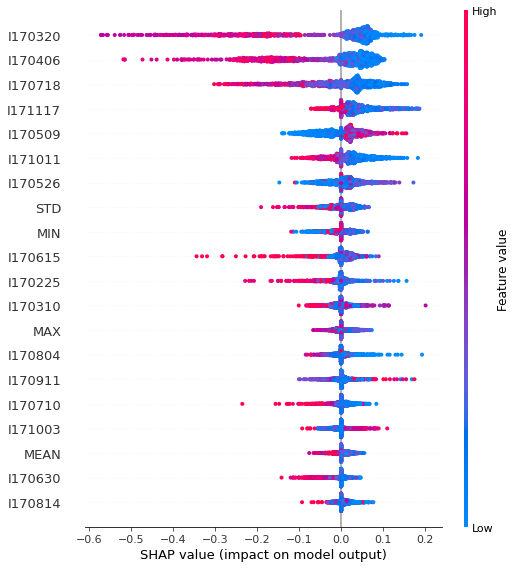

In [ ]:
#Sobre clase Suelo

shap.initjs()

#shap_values=k_explainer.shap_values(val_X175.iloc[0:1500, :])
shap.summary_plot(shap_values[2], val_X175.iloc[0:1500, :])

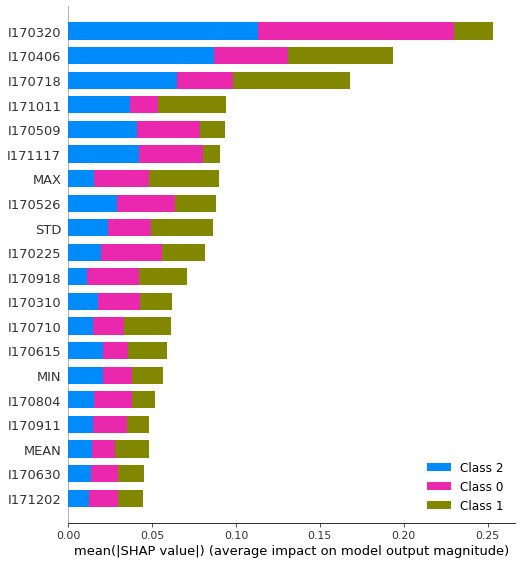

In [ ]:
shap.summary_plot(shap_values, val_X175, plot_type='bar')

#shap.dependence_plot('I170526', shap_values, val_X175.iloc[0:805031,:])

##Random Grid Search con LGBC sobre los datos de 2018

In [ ]:
# Number of trees in random forest
n_estimators = [100, 200, 300, 400]
# Number of features to consider at every split
class_weight=[None, class_weight185]

# Maximum number of levels in tree
max_depth = [-1, 10,15,20,25,30,35]

#Learning rate
learning_rate=[0.1, 0.05, 0.01, 0.001]

#num leaves
num_leaves=[30, 35, 40, 45, 50, 55, 60]

#subsample for bin
subsample_for_bin=[1000, 5000, 10000, 15000, 20000, 25000]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'class_weight': class_weight,
               'max_depth': max_depth,
               'learning_rate': learning_rate,
               'num_leaves': num_leaves,
               'subsample_for_bin': subsample_for_bin}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Use the random grid to search for best hyperparameters
# First create the base model to tune
lgbc = LGBMClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
lgbc_random18= RandomizedSearchCV(estimator = lgbc, param_distributions = random_grid, scoring='balanced_accuracy' ,n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbc_random18.fit(train_X185, train_Y185)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  41 tasks      | elapsed:   55.9s
[Parallel(n_jobs=-1)]: Done 162 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 365 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 13.3min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective=None,
                                            random_state=None, reg_alpha=0.0,
                                            reg_lambda=0.0, sile...
                                                         array([0.69771057, 1.3081611 , 1.24640242])],
                      

In [ ]:
lgbc_random18.best_params_

{'class_weight': None,
 'learning_rate': 0.1,
 'max_depth': 35,
 'n_estimators': 300,
 'num_leaves': 55,
 'subsample_for_bin': 5000}

In [ ]:
lgbc_random18.best_estimator_

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
model = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)
model.fit(np.array(train_X185, dtype=float), train_Y185)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
y_pred_val=model.predict(val_X185)

##Resultados obtenidos sobre los datos de 2018

In [ ]:
from sklearn.metrics import classification_report
#print(classification_report(ttrain_Y, y_pred_train))
print(classification_report(val_Y185, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.85      0.87      0.86    399993
           1       0.91      0.85      0.87    215755
           2       0.82      0.82      0.82    228493

    accuracy                           0.85    844241
   macro avg       0.86      0.85      0.85    844241
weighted avg       0.85      0.85      0.85    844241



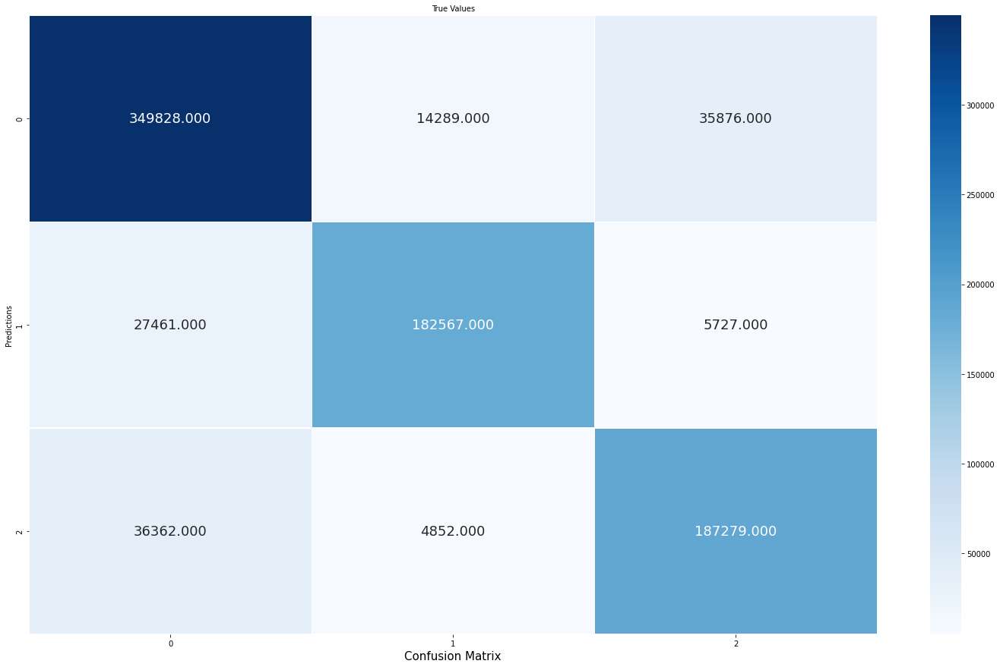

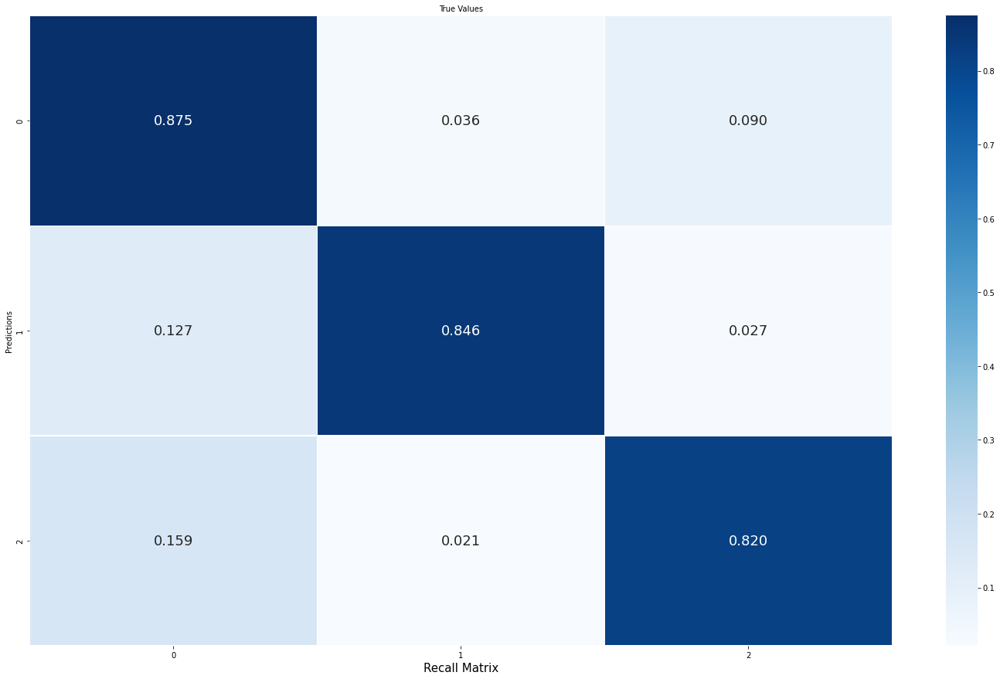

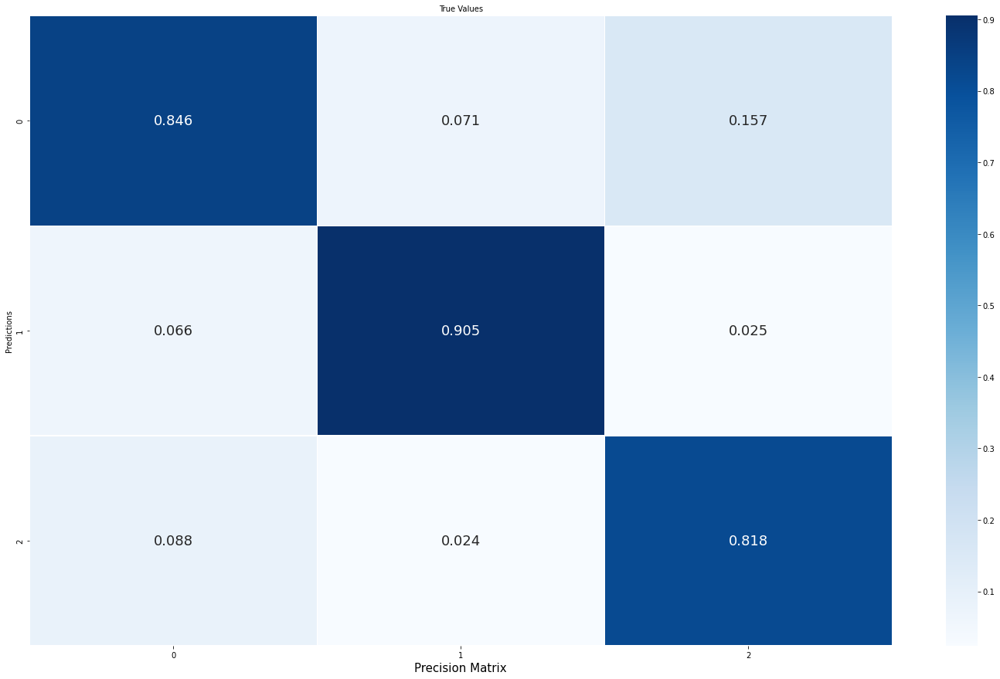

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y185, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Importancia de características en LGBC sobre datos de 2018

In [ ]:
!pip install eli5

     |████████████████████████████████| 106 kB 5.1 MB/s 


In [ ]:
for i in range(22):
  val_X185.iloc[:,i]=pd.to_numeric(val_X185.iloc[:,i])

In [ ]:
import eli5

from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state=1).fit(train_X185, train_Y185)

eli5.show_weights(perm, feature_names= val_X185.columns.tolist())

Weight,Feature
0.1438 ± 0.0016,I180516
0.1050 ± 0.0009,I180414
0.0638 ± 0.0018,I180426
0.0344 ± 0.0008,I180901
0.0340 ± 0.0016,I180730
0.0319 ± 0.0018,I180613
0.0317 ± 0.0006,I180705
0.0306 ± 0.0009,I181016
0.0304 ± 0.0011,I180718
0.0287 ± 0.0016,I180322


In [ ]:
!pip install pdpbox

     |████████████████████████████████| 34.0 MB 89 kB/s 
     |████████████████████████████████| 13.1 MB 42.6 MB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.1-py3-none-any.whl size=35758225 sha256=0ea2a68f3e19a47323b1d40c4eb111ded55f5aae1216522a8d6a552aa755d2f4
  Stored in directory: /root/.cache/pip/wheels/f4/d0/1a/b80035625c53131f52906a6fc4dd690d8efd2bf8af6a4015eb
Successfully built pdpbox
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


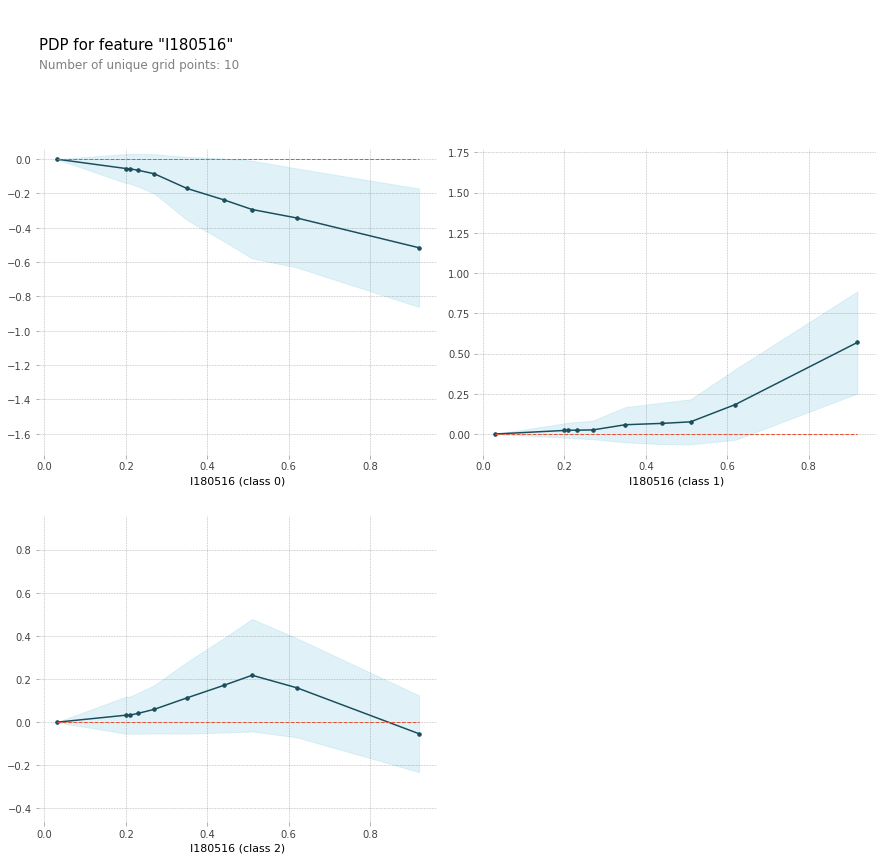

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='I180516'
feature_names=val_X185.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X185, model_features=val_X185.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

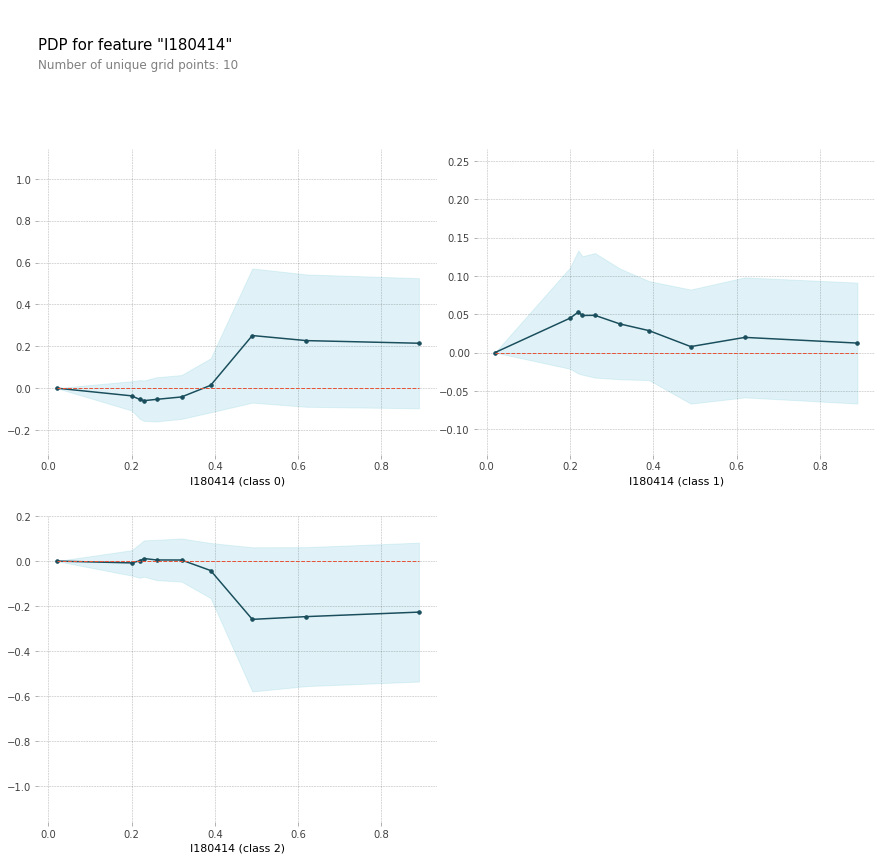

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='I180414'
feature_names=val_X185.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X185, model_features=val_X185.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

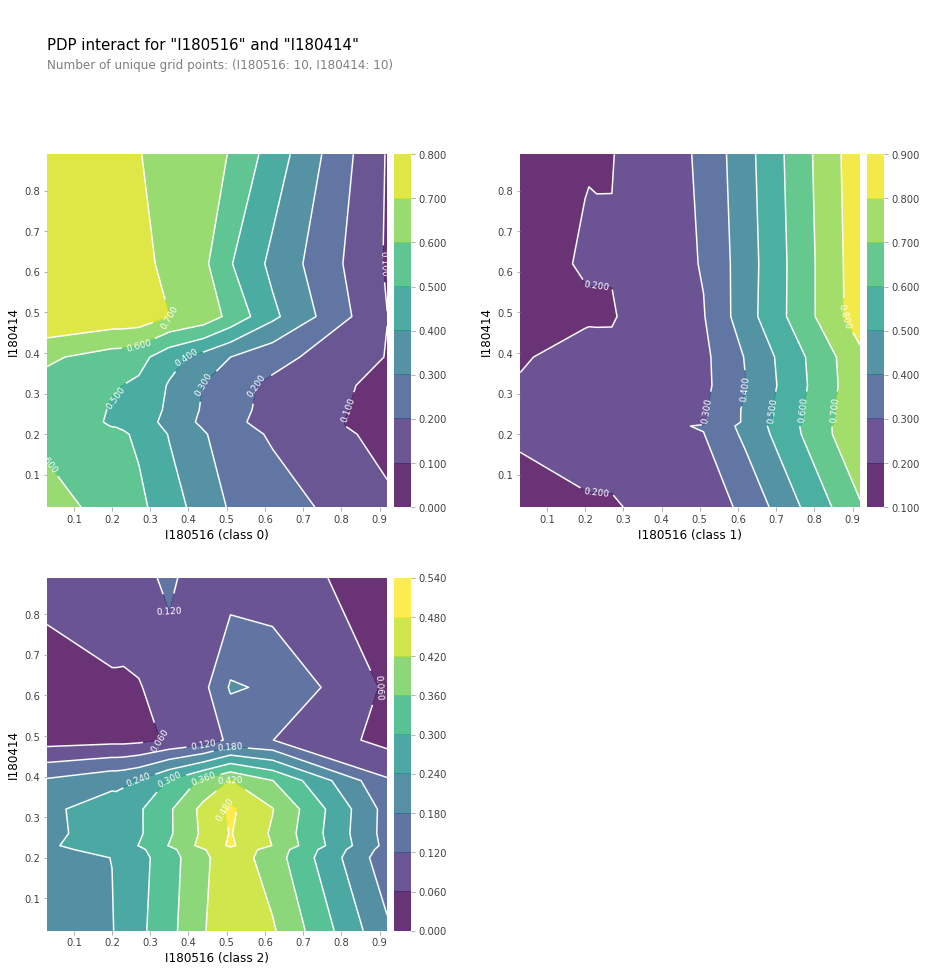

In [ ]:
features_to_plot=['I180516', 'I180414']
inter1=pdp.pdp_interact(model=model, dataset=val_X185, model_features=feature_names, features=features_to_plot)

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot)
plt.show()

##Explicabilidad con LGBC sobre los datos de 2018

In [ ]:
import shap

row_to_show = 30

data_for_prediction=val_X185.iloc[row_to_show]
data_for_prediction_array = data_for_prediction.values.reshape(1,-1)
print(model.predict_proba(data_for_prediction_array))

[[9.98647861e-01 1.32587739e-03 2.62618382e-05]]


In [ ]:
k_explainer= shap.KernelExplainer(model.predict_proba, train_X185.iloc[0:50, :])
k_shap_values=k_explainer.shap_values(data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[0], k_shap_values[0], data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[1], k_shap_values[1], data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[2], k_shap_values[2], data_for_prediction)

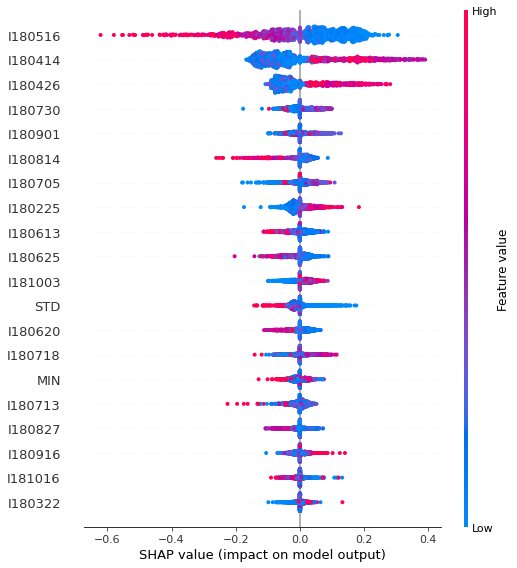

In [ ]:
shap.initjs()

#shap_values=k_explainer.shap_values(val_X185.iloc[0:1500, :])
shap.summary_plot(shap_values[0], val_X185.iloc[0:1500, :])

  0%|          | 0/1500 [00:00<?, ?it/s]

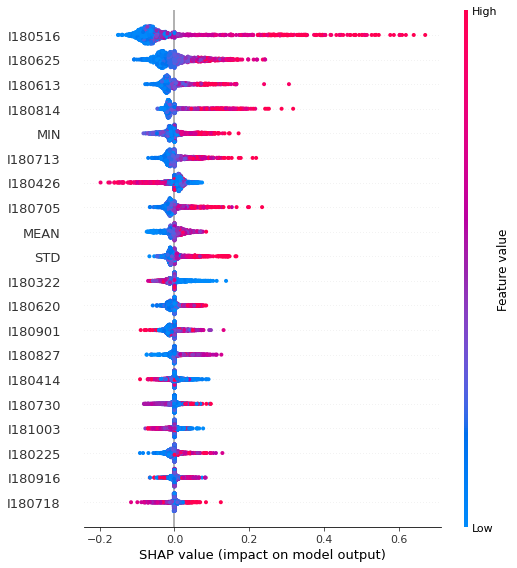

In [ ]:
shap.initjs()

shap_values=k_explainer.shap_values(val_X185.iloc[0:1500, :])
shap.summary_plot(shap_values[1], val_X185.iloc[0:1500, :])

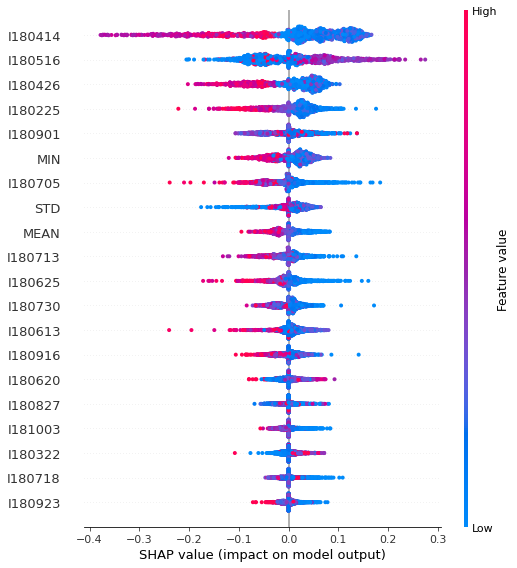

In [ ]:
shap.initjs()

#shap_values=k_explainer.shap_values(val_X185.iloc[0:1500, :])
shap.summary_plot(shap_values[2], val_X185.iloc[0:1500, :])

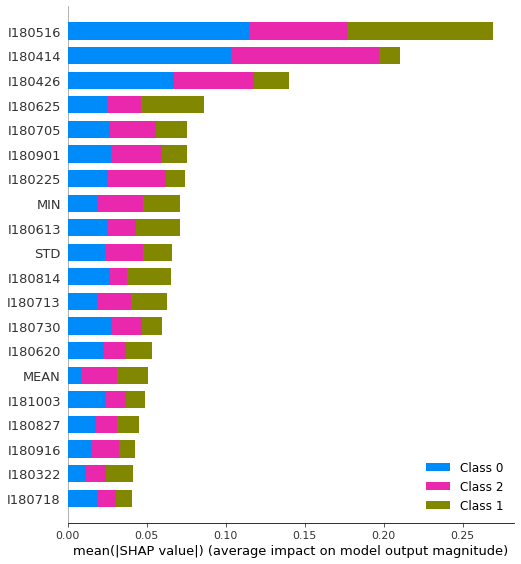

In [ ]:
shap.initjs()

shap.summary_plot(shap_values, val_X185, plot_type='bar')

##Random Grid Search con LGBC sobre datos de 2019

In [ ]:
# Number of trees in random forest
n_estimators = [100, 200, 300, 400]
# Number of features to consider at every split
class_weight=[None, class_weight195]

# Maximum number of levels in tree
max_depth = [-1, 10,15,20,25,30,35]

#Learning rate
learning_rate=[0.1, 0.05, 0.01, 0.001]

#num leaves
num_leaves=[30, 35, 40, 45, 50, 55, 60]

#subsample for bin
subsample_for_bin=[1000, 5000, 10000, 15000, 20000, 25000]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'class_weight': class_weight,
               'max_depth': max_depth,
               'learning_rate': learning_rate,
               'num_leaves': num_leaves,
               'subsample_for_bin': subsample_for_bin}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Use the random grid to search for best hyperparameters
# First create the base model to tune
lgbc = LGBMClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
lgbc_random19= RandomizedSearchCV(estimator = lgbc, param_distributions = random_grid, scoring='balanced_accuracy' ,n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbc_random19.fit(train_X195, train_Y195)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   44.2s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 13.6min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective=None,
                                            random_state=None, reg_alpha=0.0,
                                            reg_lambda=0.0, sile...
                                                         array([0.94358876, 1.26639333, 0.86913276])],
                      

In [ ]:
lgbc_random19.best_params_

{'class_weight': None,
 'learning_rate': 0.1,
 'max_depth': 35,
 'n_estimators': 300,
 'num_leaves': 55,
 'subsample_for_bin': 5000}

In [ ]:
lgbc_random19.best_estimator_

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
model = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)
model.fit(train_X195, train_Y195)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=35,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=300, n_jobs=-1, num_leaves=55, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=5000, subsample_freq=0)

In [ ]:
y_pred_val=model.predict(val_X195)

##Resultados obtenidos sobre los datos de 2019

In [ ]:
from sklearn.metrics import classification_report
#print(classification_report(ttrain_Y, y_pred_train))
print(classification_report(val_Y195, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.80      0.81      0.80    299737
           1       0.90      0.84      0.87    220733
           2       0.85      0.87      0.86    324605

    accuracy                           0.84    845075
   macro avg       0.85      0.84      0.84    845075
weighted avg       0.84      0.84      0.84    845075



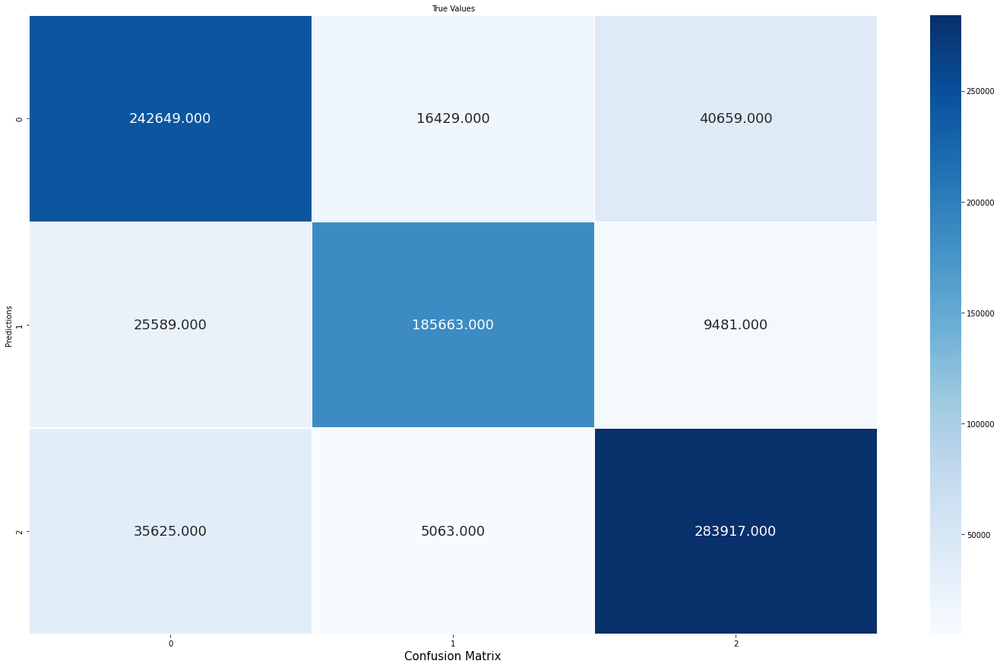

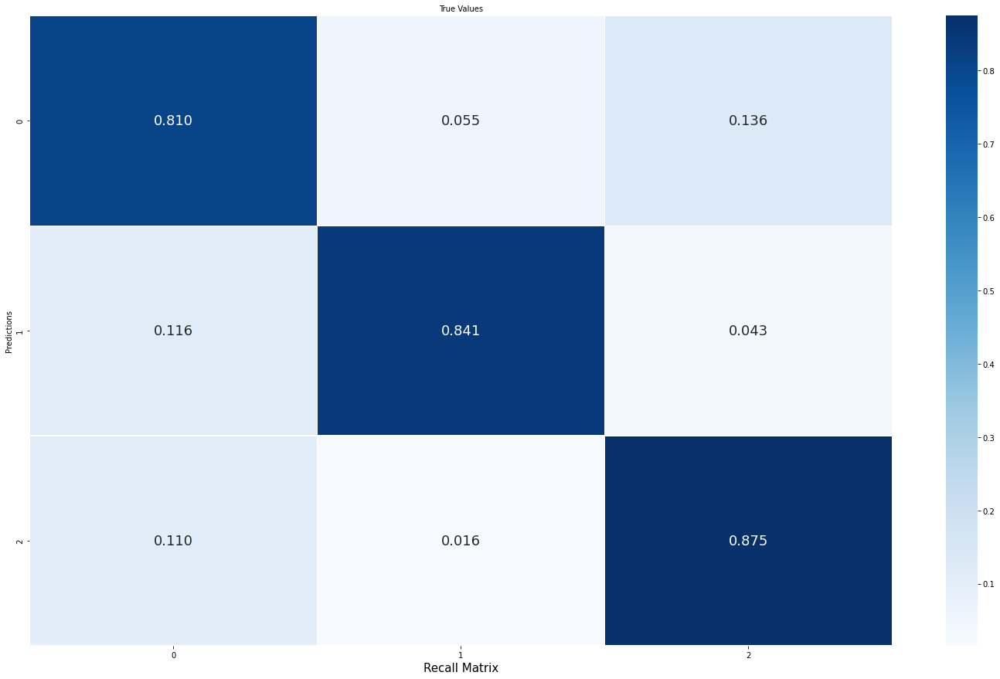

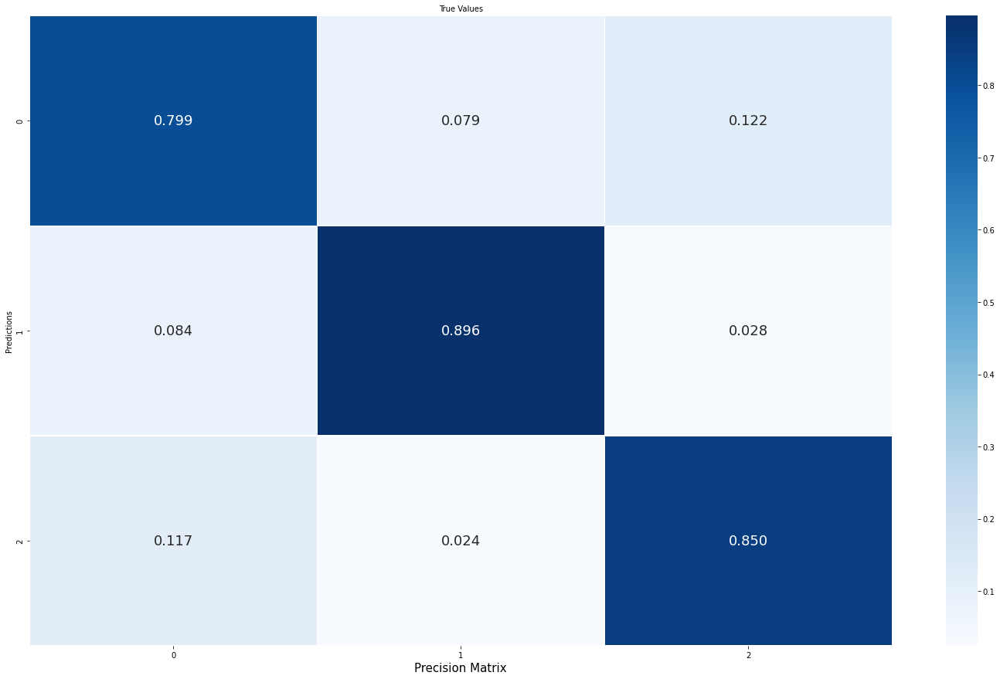

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y195, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Importancia de características en LGBC sobre datos de 2019

In [ ]:
for i in range(22):
  val_X195.iloc[:,i]=pd.to_numeric(val_X195.iloc[:,i])

In [ ]:
import eli5

from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state=1).fit(train_X195, train_Y195)

eli5.show_weights(perm, feature_names= val_X195.columns.tolist())

Weight,Feature
0.0946 ± 0.0018,i190327
0.0796 ± 0.0019,i190516
0.0750 ± 0.0026,i190416
0.0741 ± 0.0012,i190705
0.0605 ± 0.0031,i190827
0.0446 ± 0.0019,i190429
0.0415 ± 0.0016,i190718
0.0414 ± 0.0021,i190610
0.0380 ± 0.0014,i190218
0.0374 ± 0.0009,i190918


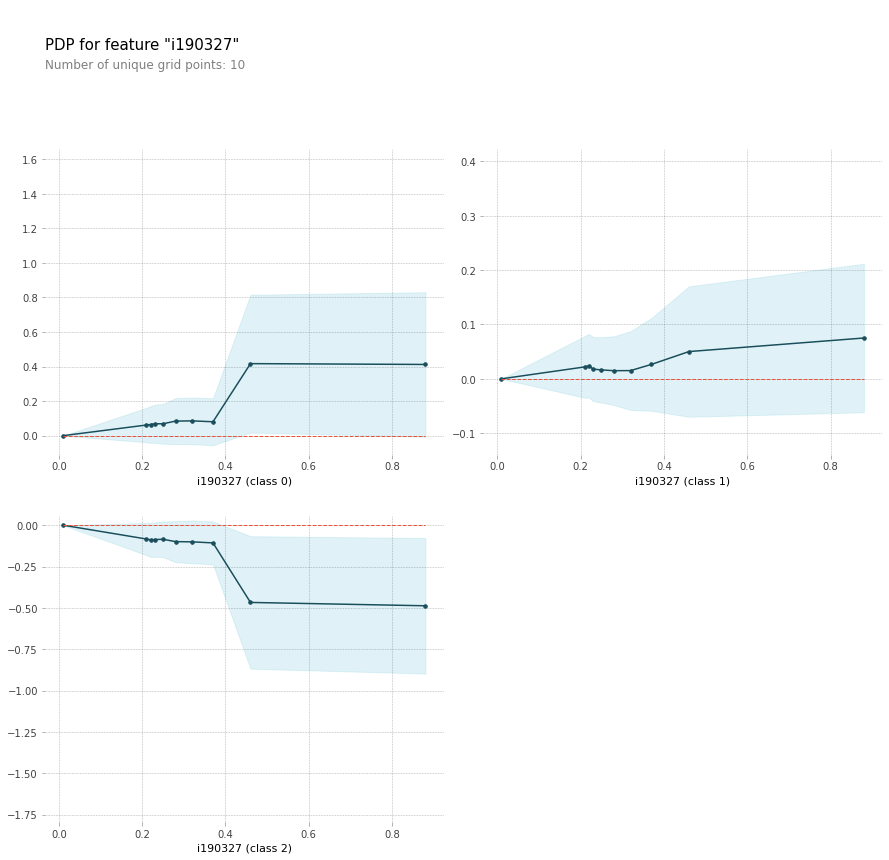

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='i190327'
feature_names=val_X195.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X195, model_features=val_X195.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

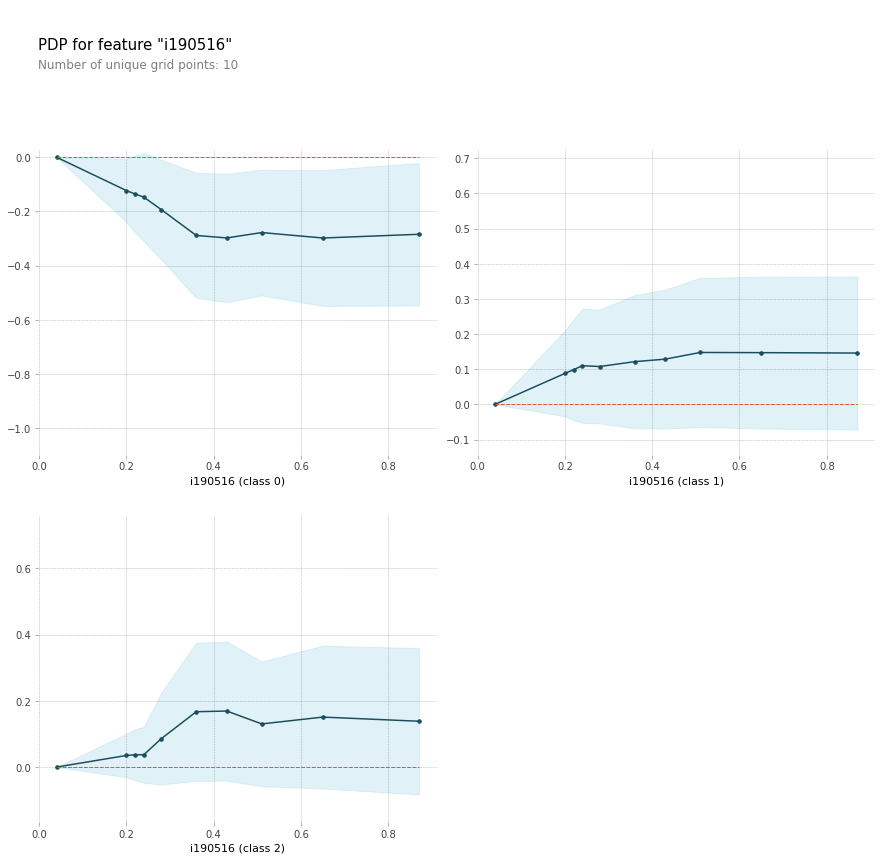

In [ ]:
from pdpbox import pdp, get_dataset, info_plots

feature_to_plot='i190516'
feature_names=val_X195.columns.tolist()


pdp_dist= pdp.pdp_isolate(model=model, dataset=val_X195, model_features=val_X195.columns.tolist(), feature=feature_to_plot)

pdp.pdp_plot(pdp_dist, feature_to_plot)
plt.show()

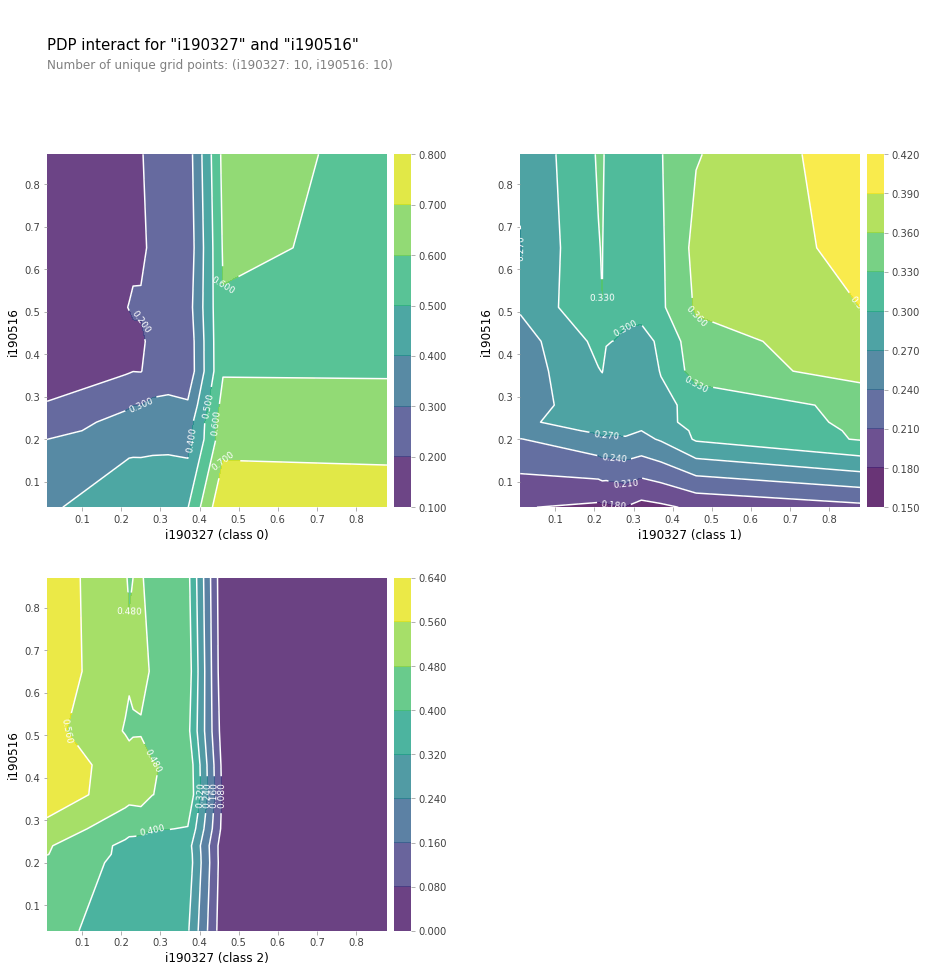

In [ ]:
features_to_plot=['i190327', 'i190516']
inter1=pdp.pdp_interact(model=model, dataset=val_X195, model_features=feature_names, features=features_to_plot)

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot)
plt.show()

##Explicabilidad con LGBC sobre los datos de 2019

In [ ]:
import shap

row_to_show = 120

data_for_prediction=val_X195.iloc[row_to_show]
data_for_prediction_array = data_for_prediction.values.reshape(1,-1)
print(model.predict_proba(data_for_prediction_array))

[[0.00164366 0.99146608 0.00689026]]


In [ ]:
k_explainer= shap.KernelExplainer(model.predict_proba, train_X195.iloc[0:50, :])
k_shap_values=k_explainer.shap_values(data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[0], k_shap_values[0], data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[1], k_shap_values[1], data_for_prediction)

In [ ]:
shap.initjs()
shap.force_plot(k_explainer.expected_value[2], k_shap_values[2], data_for_prediction)

  0%|          | 0/1500 [00:00<?, ?it/s]

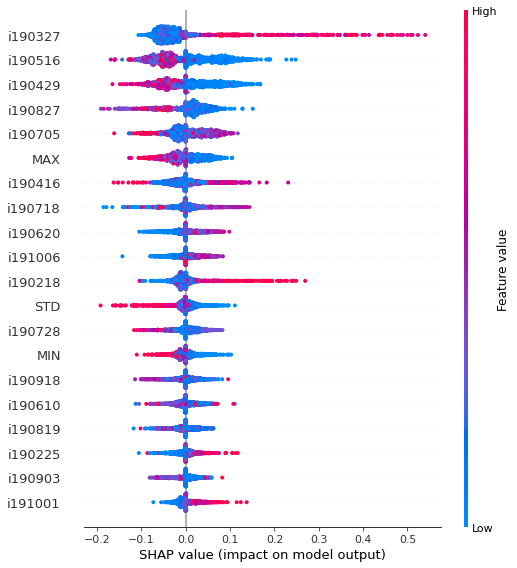

In [ ]:
shap.initjs()

shap_values=k_explainer.shap_values(val_X195.iloc[0:1500, :])
shap.summary_plot(shap_values[0], val_X195.iloc[0:1500, :])

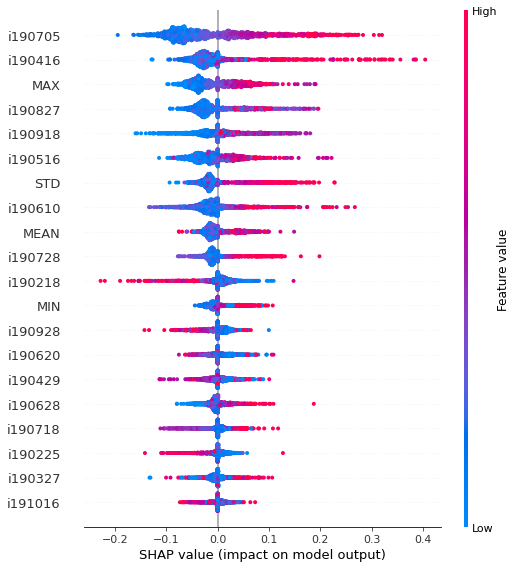

In [ ]:
shap.initjs()

shap.summary_plot(shap_values[1], val_X195.iloc[0:1500, :])

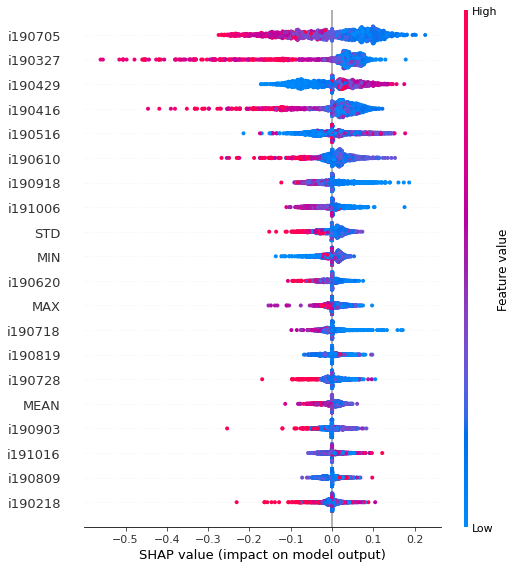

In [ ]:
shap.initjs()

shap.summary_plot(shap_values[2], val_X195.iloc[0:1500, :])

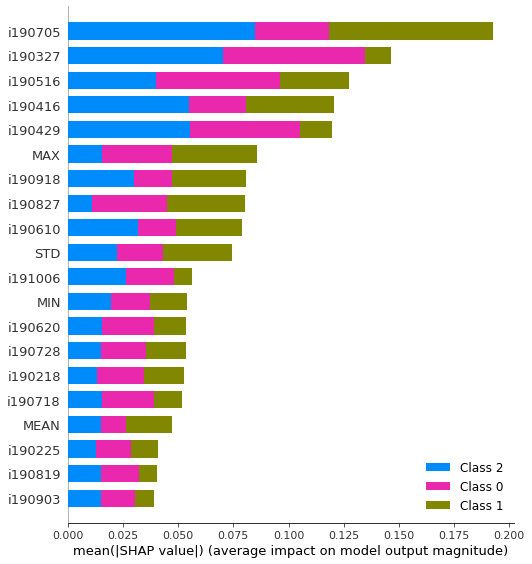

In [ ]:
shap.summary_plot(shap_values, val_X195, plot_type='bar')

#Modelo Gradient Boosting Classifier 

## Random Grid Search con GBC con los datos de 2017

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

from numpy import mean
from numpy import std

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RepeatedStratifiedKFold

# Number of trees in gradient boosting
n_estimators = [100, 200, 300]
# Number of features to consider at every split
max_features = ['auto', 'sqrt', 10, 20]
# Maximum number of levels in tree
max_depth = [10,14,18,20]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
tol=[0.001, 0.0001, 0.000001]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'tol':tol}

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
gbc = GradientBoostingClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
gbc_random17= RandomizedSearchCV(estimator = gbc, param_distributions = random_grid, scoring='balanced_accuracy' ,n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
gbc_random17.fit(train_X175, train_Y175)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 31.6min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 157.2min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 397.6min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 601.3min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=GradientBoostingClassifier(ccp_alpha=0.0,
                                                        criterion='friedman_mse',
                                                        init=None,
                                                        learning_rate=0.1,
                                                        loss='deviance',
                                                        max_depth=3,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                    

In [ ]:
gbc_random17.best_params_

NameError: ignored

In [ ]:
model_gb_clf=gbc_random17.best_model_

In [ ]:
#print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))


model_gb_clf=GradientBoostingClassifier(learning_rate=0.01, n_estimators=400, min_samples_split=10, max_depth=20, max_features=20, tol=0.000001)
model_gb_clf.fit(train_X175, train_Y175)

y_pred_train=model_gb_clf.predict(train_X175)
y_pred_val=model_gb_clf.predict(val_X175)
#y_pred_test=model_gb_clf.predict(test_X)


##Resultados obtenidos con GBC sobre los datos de 2017

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(train_Y175, y_pred_train))
print(classification_report(val_Y175, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97     24700
           1       0.99      0.97      0.98     11540
           2       0.98      0.91      0.94      8188

    accuracy                           0.97     44428
   macro avg       0.98      0.95      0.96     44428
weighted avg       0.97      0.97      0.97     44428

              precision    recall  f1-score   support

           0       0.82      0.92      0.87    469403
           1       0.90      0.86      0.88    219765
           2       0.76      0.54      0.63    154969

    accuracy                           0.83    844137
   macro avg       0.83      0.77      0.79    844137
weighted avg       0.83      0.83      0.83    844137



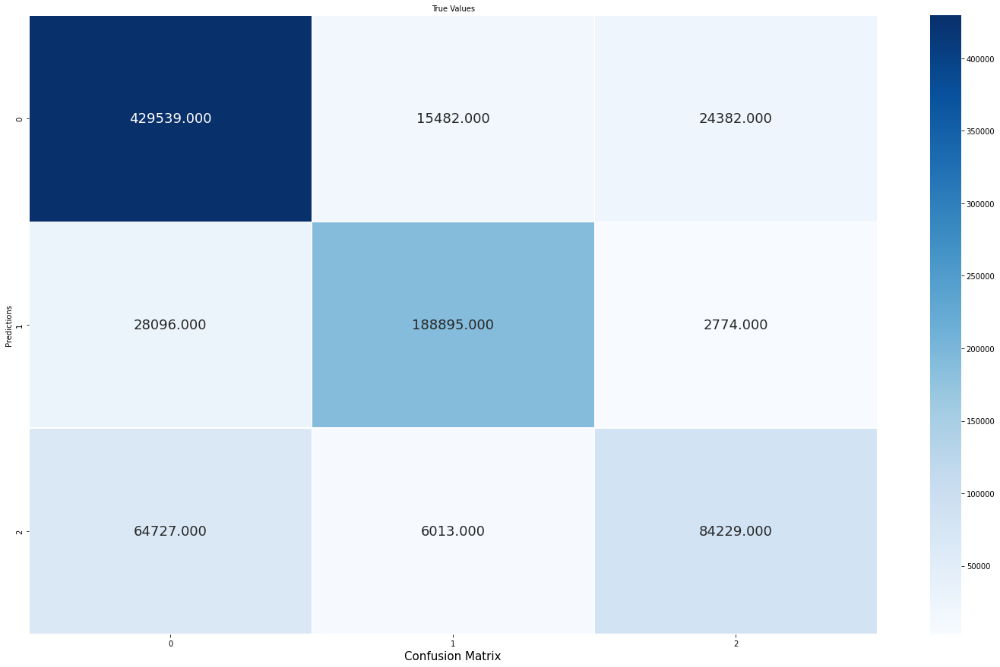

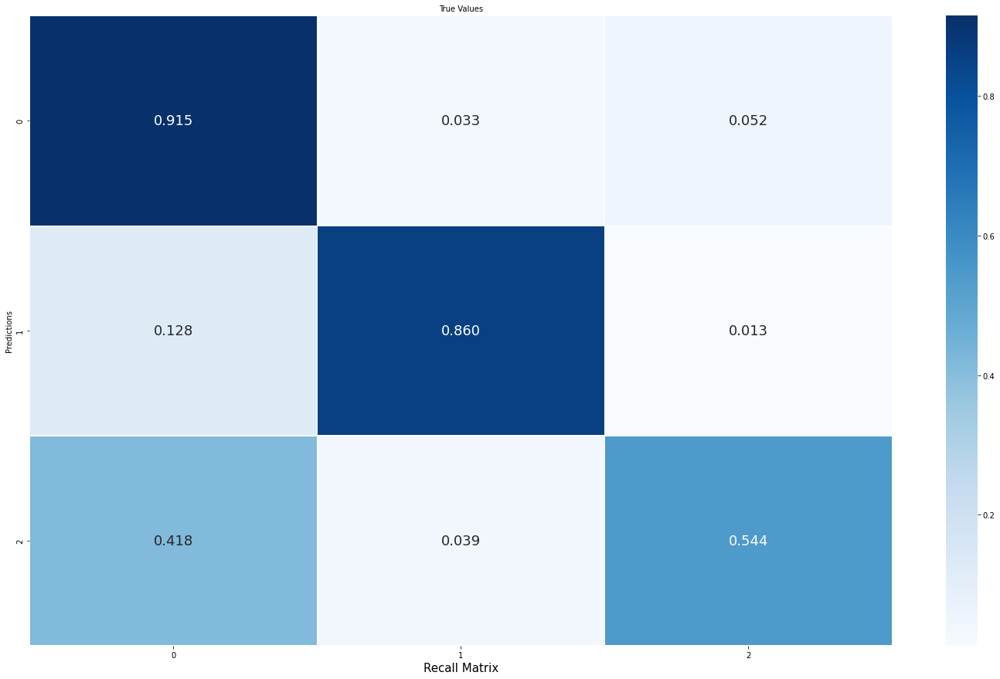

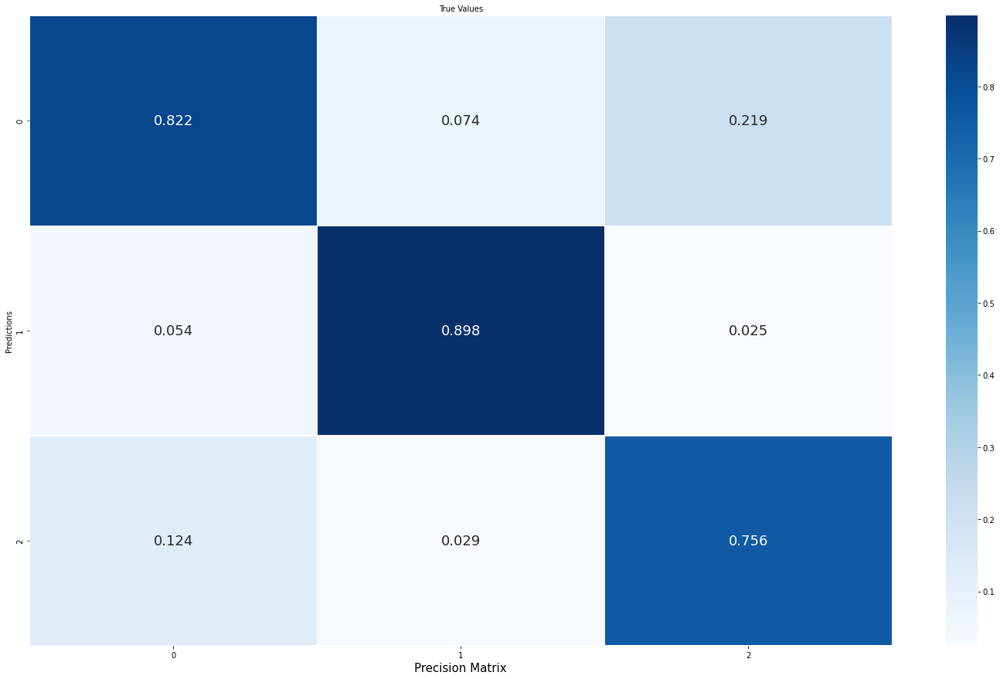

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y175, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Random Grid Search con GBC con los datos de 2018

In [ ]:
model_gb_clf=GradientBoostingClassifier(learning_rate=0.01, n_estimators=400, min_samples_split=100, max_depth=20, max_features=20, tol=0.00001)
model_gb_clf.fit(train_X185, train_Y185)

y_pred_train=model_gb_clf.predict(train_X185)
y_pred_val=model_gb_clf.predict(val_X185)
#y_pred_test=model_gb_clf.predict(test_X)

##Resultados obtenidos con GBC con los datos de 2018

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(train_Y185, y_pred_train))
print(classification_report(val_Y185, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99     21228
           1       1.00      0.98      0.99     11322
           2       0.98      0.98      0.98     11883

    accuracy                           0.98     44433
   macro avg       0.99      0.98      0.98     44433
weighted avg       0.98      0.98      0.98     44433

              precision    recall  f1-score   support

           0       0.85      0.87      0.86    399993
           1       0.91      0.85      0.88    215755
           2       0.82      0.82      0.82    228493

    accuracy                           0.85    844241
   macro avg       0.86      0.85      0.85    844241
weighted avg       0.85      0.85      0.85    844241



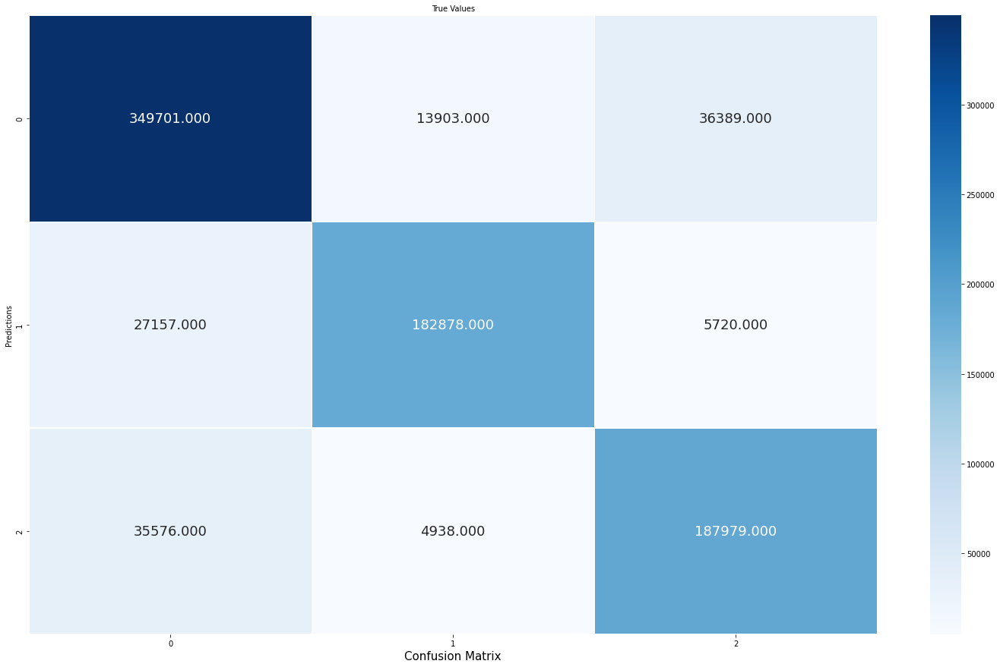

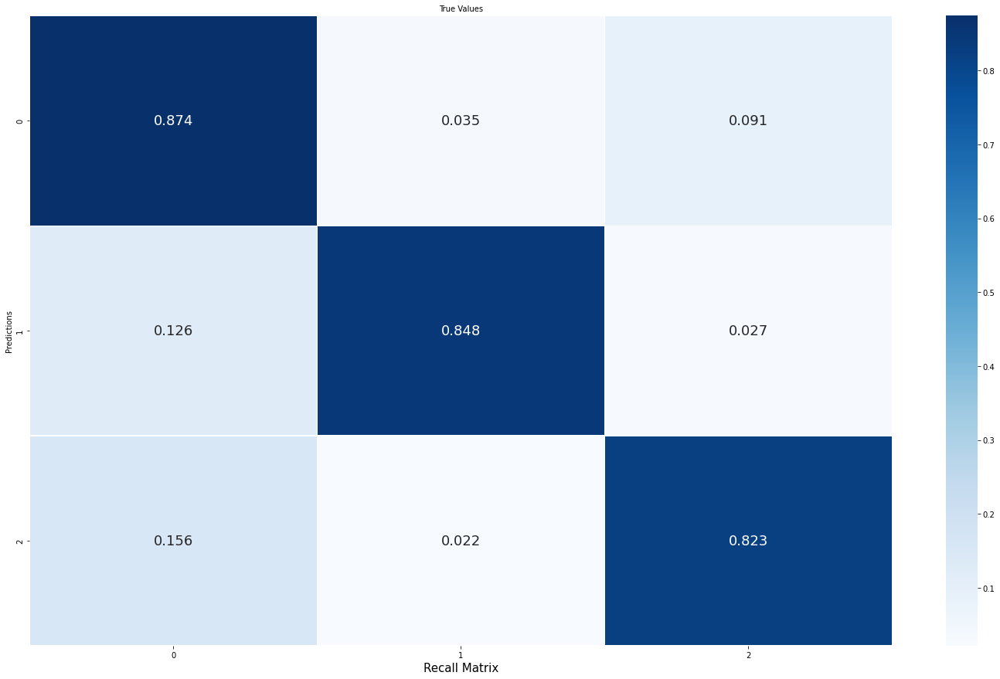

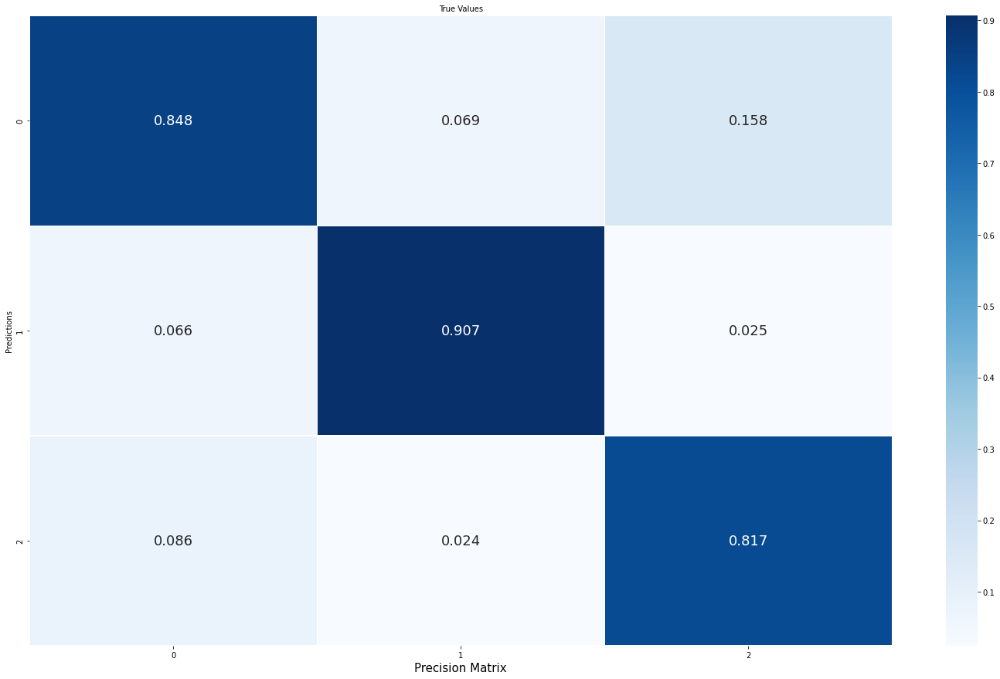

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y185, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Random Grid Search con GBC con los datos de 2019

In [ ]:
model_gb_clf=GradientBoostingClassifier(learning_rate=0.01, n_estimators=400, min_samples_split=10, max_depth=20, max_features=20, tol=0.000001)
model_gb_clf.fit(train_X195, train_Y195)

y_pred_train=model_gb_clf.predict(train_X195)
y_pred_val=model_gb_clf.predict(val_X195)
#y_pred_test=model_gb_clf.predict(test_X)

#Resultados obtenidos con GBC sobre los datos de 2019

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(train_Y195, y_pred_train))
print(classification_report(val_Y195, y_pred_val))
#print(classification_report(test_Y, y_pred_test))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98     15712
           1       0.99      0.97      0.98     11707
           2       0.98      0.99      0.98     17058

    accuracy                           0.98     44477
   macro avg       0.98      0.98      0.98     44477
weighted avg       0.98      0.98      0.98     44477

              precision    recall  f1-score   support

           0       0.80      0.81      0.81    299737
           1       0.90      0.84      0.87    220733
           2       0.85      0.88      0.86    324605

    accuracy                           0.84    845075
   macro avg       0.85      0.84      0.85    845075
weighted avg       0.84      0.84      0.84    845075



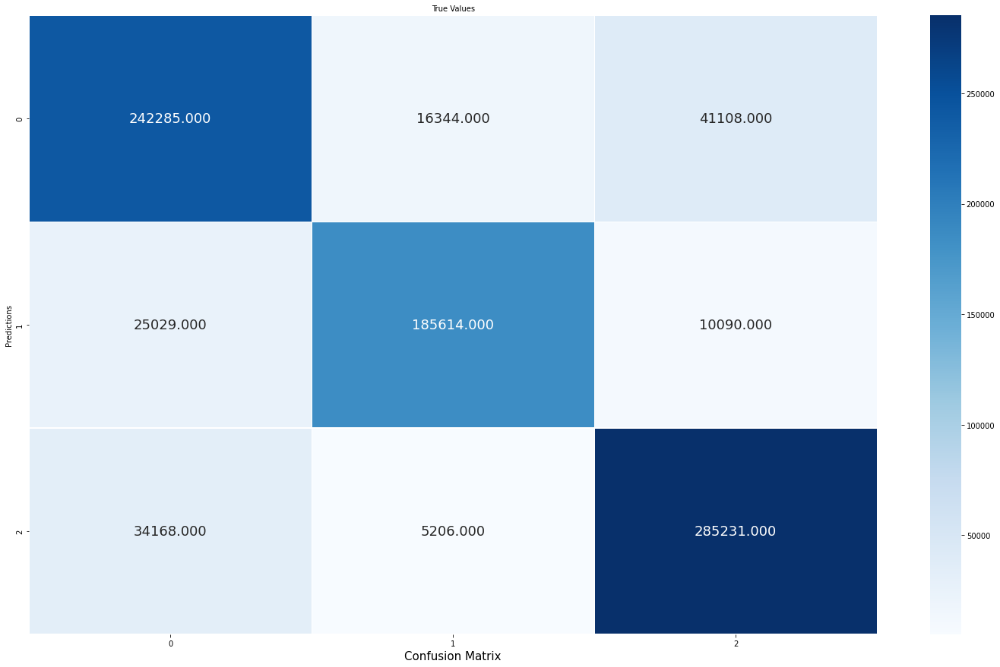

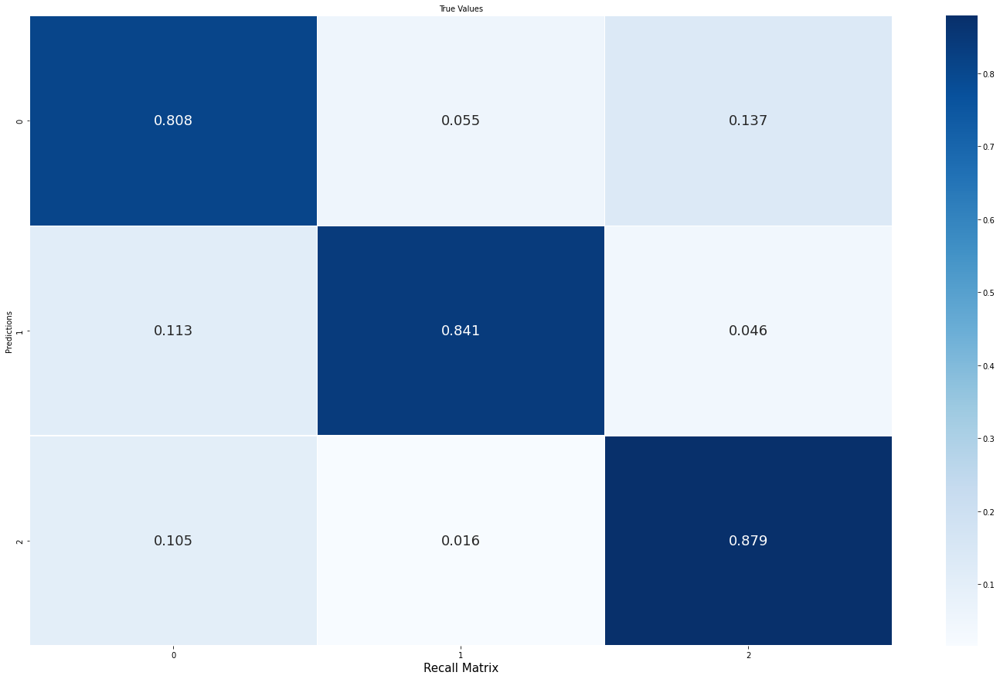

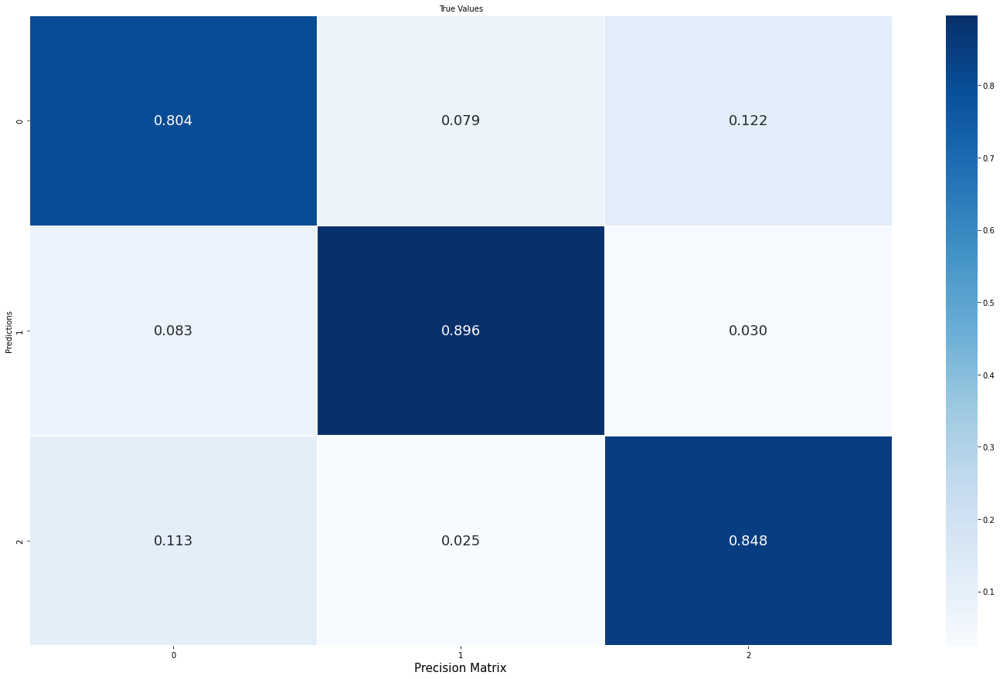

In [ ]:
confm=pd.crosstab(val_Y195, y_pred_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

#Random Forest Model


##Random Grid Search en clasificador RF sobre datos de 2017

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [100, 200, 300]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [10,12,14,16,18]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(train_X175, train_Y175)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 50.1min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 115.7min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 149.5min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
rf_random.best_estimator_

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=18, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

model_rf=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight='balanced_subsample',
                       criterion='gini', max_depth=18, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
model_rf.fit(train_X175, train_Y175)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=18, max_features='auto', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=300, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

##Resultados obtenidos en RF sobre datos de 2017

In [ ]:
from sklearn.metrics import classification_report

y_predrf_tr17=model_rf.predict(train_X175)
y_predrf_vl17=model_rf.predict(val_X175)
#y_predrf_test=model_rf.predict(test_X)

print(classification_report(train_Y175, y_predrf_tr17))
print(classification_report(val_Y175, y_predrf_vl17))
#print(classification_report(test_Y, y_predrf_test))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98     24700
           1       0.99      0.98      0.99     11540
           2       0.93      0.99      0.96      8188

    accuracy                           0.98     44428
   macro avg       0.97      0.98      0.97     44428
weighted avg       0.98      0.98      0.98     44428

              precision    recall  f1-score   support

           0       0.83      0.88      0.86    469403
           1       0.90      0.86      0.88    219765
           2       0.68      0.61      0.65    154969

    accuracy                           0.82    844137
   macro avg       0.80      0.78      0.79    844137
weighted avg       0.82      0.82      0.82    844137



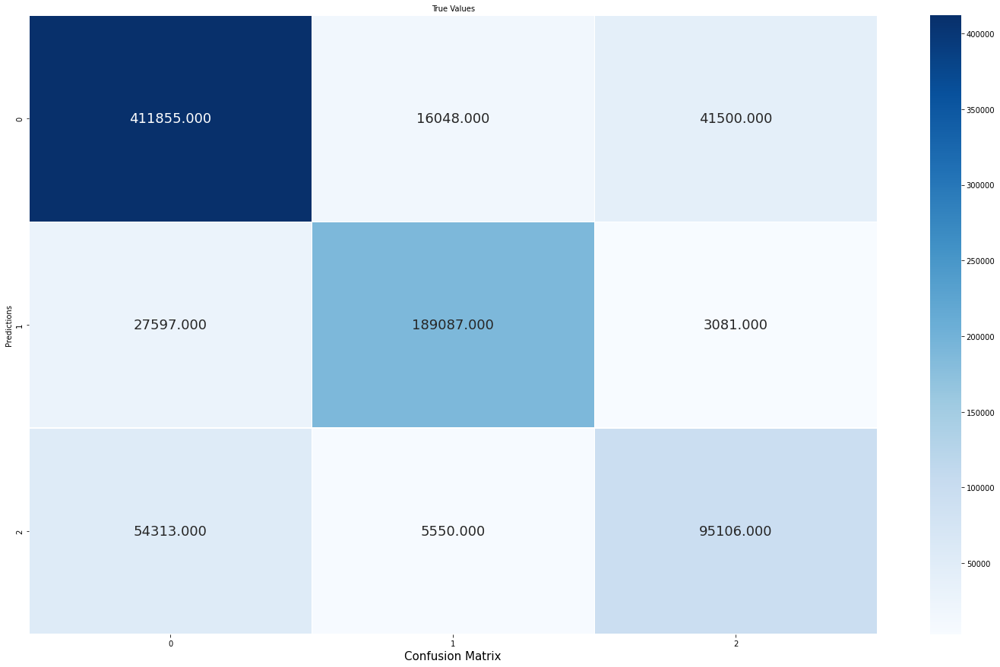

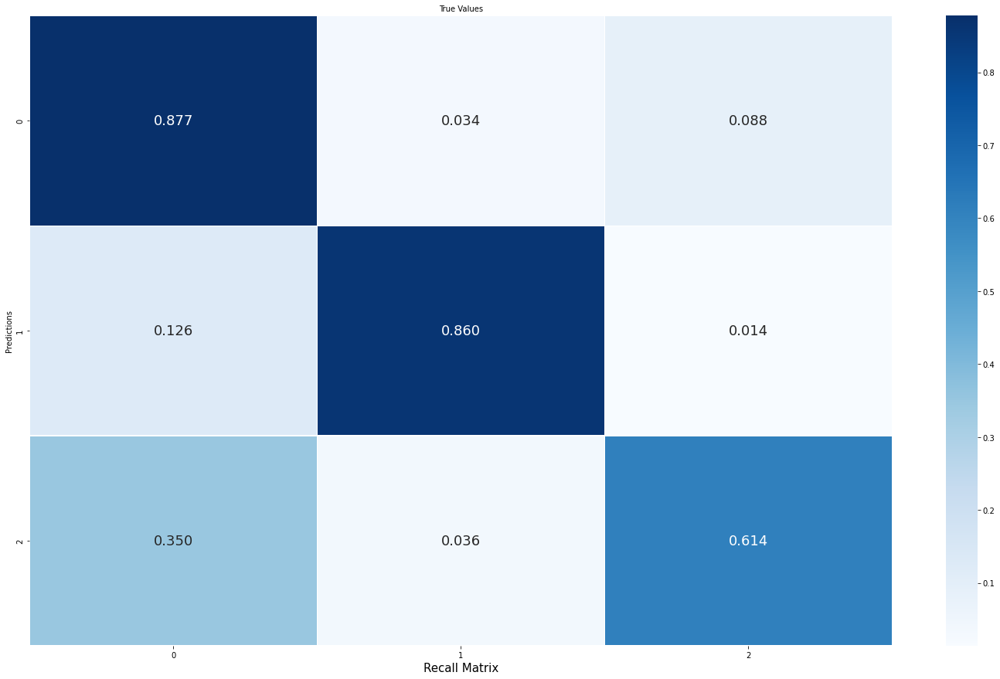

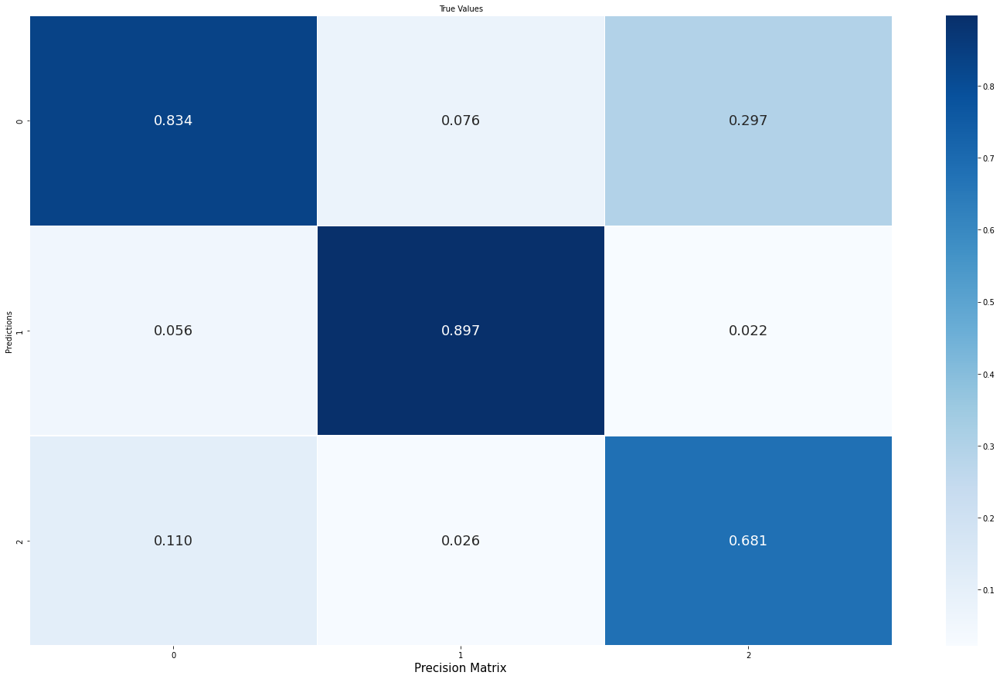

In [ ]:
confm=pd.crosstab(val_Y175, y_predrf_vl17)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Random Grid Search en clasificador RF sobre datos de 2018

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from numpy import mean
from numpy import std
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(train_X185, train_Y185)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 11.4min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 49.4min
/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 114.8min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 149.3min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
rf_random.best_estimator_

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=18, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
rf_random.cv_results_

{'mean_fit_time': array([ 67.60365782,  50.19902802, 147.37586389,  75.44950728,
         90.12026372,  74.81578507,  30.60069437,  80.67314668,
         35.52230086, 120.82188439,  21.69388304,  28.23559079,
        121.36802006,  25.16990614,  90.98082261,  31.33157301,
        145.82280273,  74.69220171,  98.11261744,  50.46266961,
         71.25640035,  93.0574482 ,  60.84138398,  94.44031601,
        134.35403652,  65.47684526,  31.72314305,  36.25144868,
         43.3772553 ,  89.94643016, 105.17022409,  92.92349834,
        101.06985435, 134.1614851 ,  70.22772393, 144.81630535,
         40.97841682,  25.21795917,  63.6868361 ,  66.80018034,
         30.31343756, 146.97424941,  85.01172004,  89.07046099,
         94.7283957 ,  50.16463909, 106.52374792,  40.89028158,
        143.65452085,  21.73019891,  66.04818878,  95.5434598 ,
        145.03344707,  21.52475801,  48.698102  ,  70.65278878,
         74.18528948, 133.61311078,  71.25767708,  83.91647077,
         33.50191016,  

In [ ]:
model_rf=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight='balanced_subsample',
                       criterion='gini', max_depth=18, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
model_rf.fit(train_X185, train_Y185)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=18, max_features='auto', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

##Resultados obtenidos en RF sobre datos de 2018

In [ ]:
from sklearn.metrics import classification_report

y_predrf_tr18=model_rf.predict(train_X185)
y_predrf_vl18=model_rf.predict(val_X185)

print(classification_report(train_Y185, y_predrf_tr18))
print(classification_report(val_Y185, y_predrf_vl18))


              precision    recall  f1-score   support

           0       0.99      0.97      0.98     21228
           1       1.00      0.99      0.99     11322
           2       0.95      0.99      0.97     11883

    accuracy                           0.98     44433
   macro avg       0.98      0.98      0.98     44433
weighted avg       0.98      0.98      0.98     44433

              precision    recall  f1-score   support

           0       0.85      0.85      0.85    399993
           1       0.90      0.85      0.88    215755
           2       0.79      0.84      0.82    228493

    accuracy                           0.85    844241
   macro avg       0.85      0.85      0.85    844241
weighted avg       0.85      0.85      0.85    844241



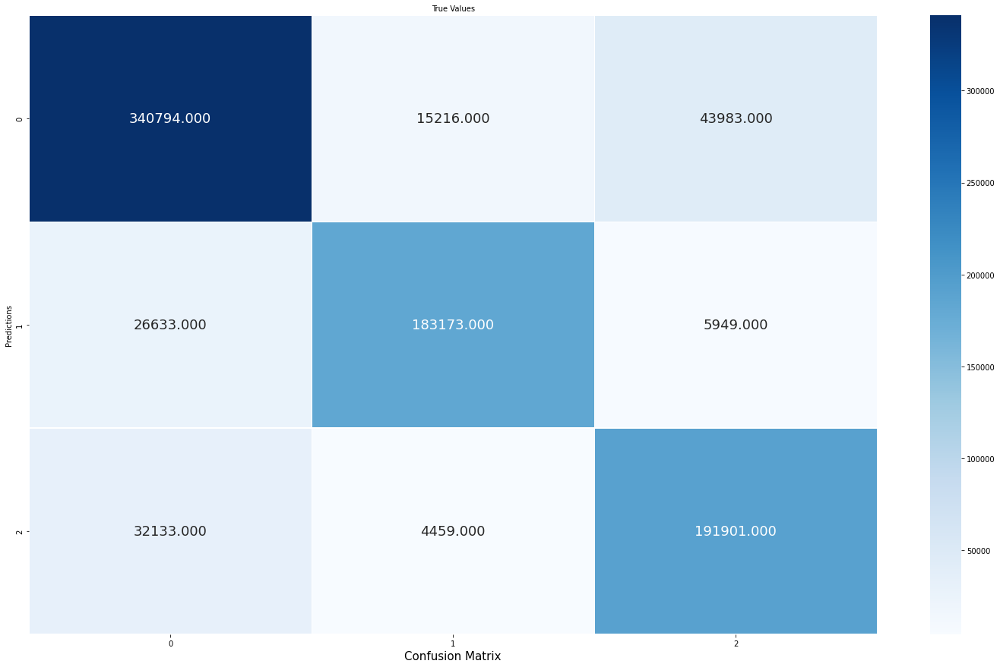

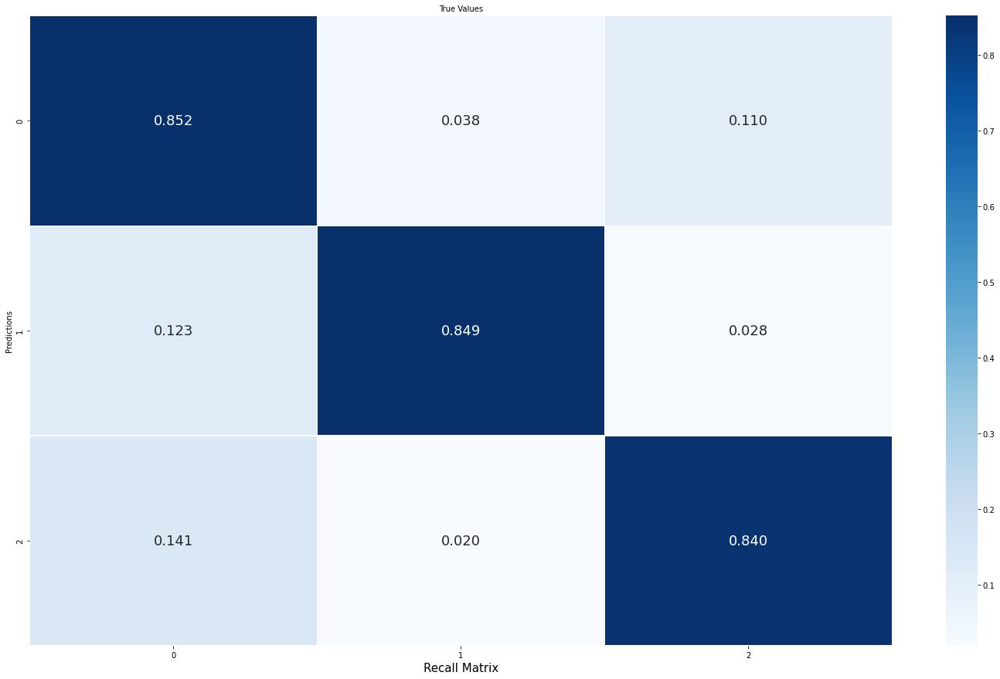

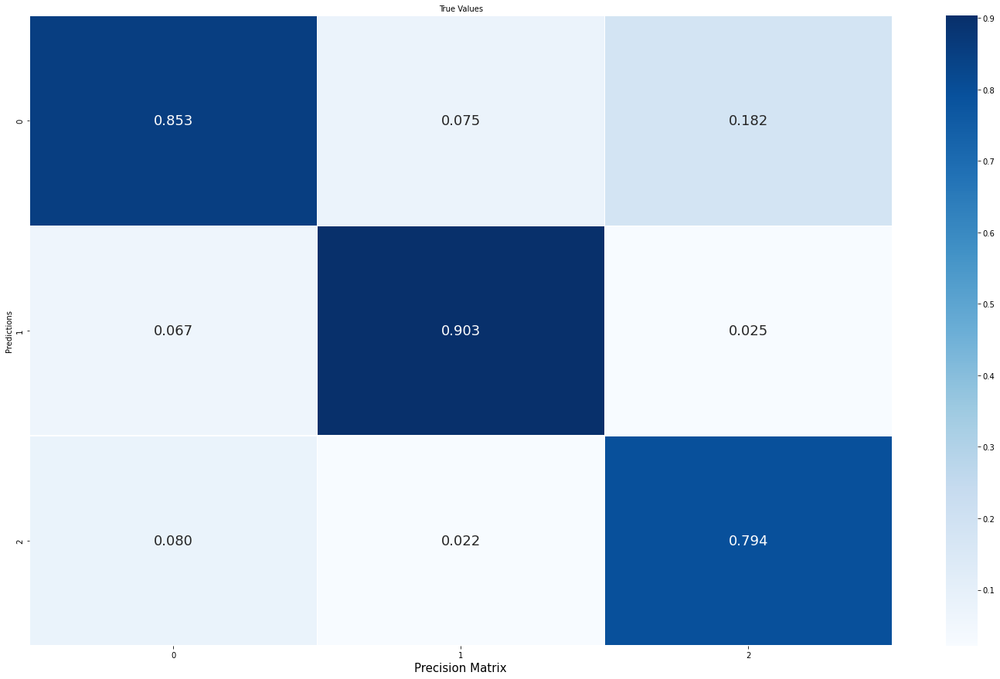

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y185, y_predrf_vl18)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Random Grid Search en clasificador RF sobre datos de 2019

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [100, 200, 300]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [10,12,14,16,18]

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
#Class weight or not
class_weight=[None, 'balanced_subsample']
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'class_weight': class_weight}

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from numpy import mean
from numpy import std
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, scoring='balanced_accuracy',verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(train_X195, train_Y195)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed: 11.5min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 48.5min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 104.0min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 151.7min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
rf_random.cv_results_

{'mean_fit_time': array([ 33.0287302 ,  88.17103176, 131.34459853,  29.33375072,
         97.46464968,  69.78800554,  91.79235687,  45.92109623,
         50.18252749, 127.40814419,  98.23727226,  88.44382267,
         69.42179418,  82.74192095,  88.86588635,  69.75939479,
         29.55715275,  37.59180913,  36.94241905, 110.53421335,
         73.63476443,  49.0695837 , 106.16664853,  66.41242132,
         37.6209198 ,  46.55115623,  32.42636905,  90.70329523,
         51.4205616 ,  97.74929481, 118.34497981,  80.02563977,
         21.35322266,  53.62786231,  31.24546237, 104.09765468,
        144.26797404,  72.64969645,  26.68895597, 146.64633088,
         97.67092671,  87.5576468 , 117.6846488 ,  42.14057527,
        138.51462855,  55.75976105,  49.4491529 ,  42.8540535 ,
         96.58715138,  29.95904102,  31.11387186,  75.48705764,
         33.17124581,  61.47159157,  35.24847469,  63.46219106,
         42.21617436,  40.14292889,  35.58786945,  37.54594111,
        105.97612896,  

In [ ]:
rf_random.best_estimator_

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=18, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=300, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [ ]:
model_rf=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=18, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=300, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)
model_rf.fit(train_X195, train_Y195)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=18, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=4,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=300, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

##Resultados obtenidos en RF sobre datos de 2019

In [ ]:
from sklearn.metrics import classification_report

y_predrf_tr19=model_rf.predict(train_X195)
y_predrf_vl19=model_rf.predict(val_X195)


print(classification_report(train_Y195, y_predrf_tr19))
print(classification_report(val_Y195, y_predrf_vl19))


              precision    recall  f1-score   support

           0       0.94      0.95      0.94     15712
           1       0.98      0.95      0.96     11707
           2       0.95      0.96      0.96     17058

    accuracy                           0.95     44477
   macro avg       0.95      0.95      0.95     44477
weighted avg       0.95      0.95      0.95     44477

              precision    recall  f1-score   support

           0       0.79      0.81      0.80    299737
           1       0.89      0.84      0.86    220733
           2       0.85      0.87      0.86    324605

    accuracy                           0.84    845075
   macro avg       0.84      0.84      0.84    845075
weighted avg       0.84      0.84      0.84    845075



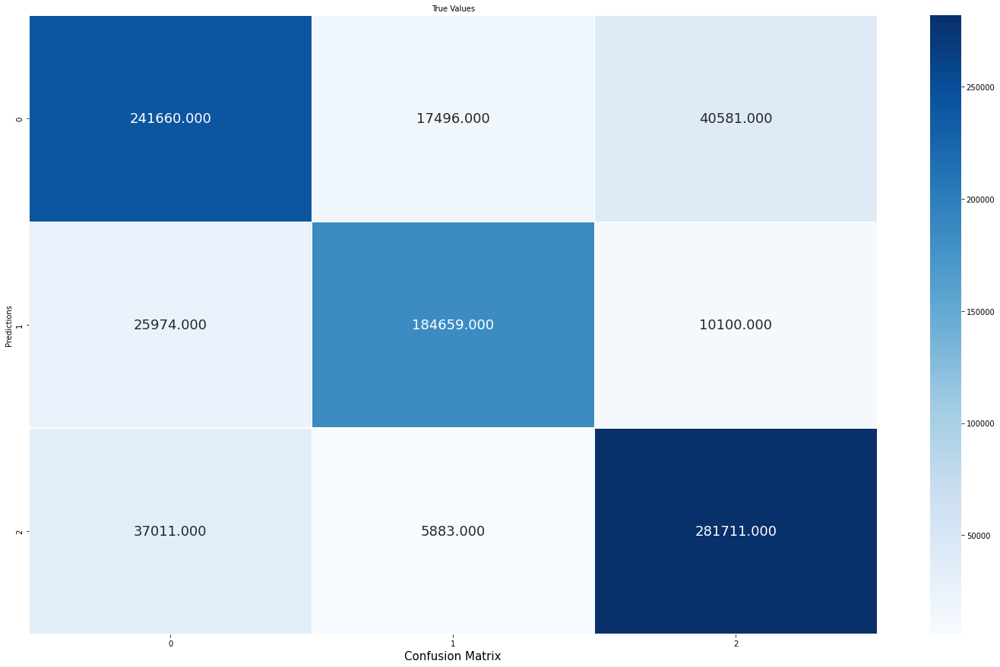

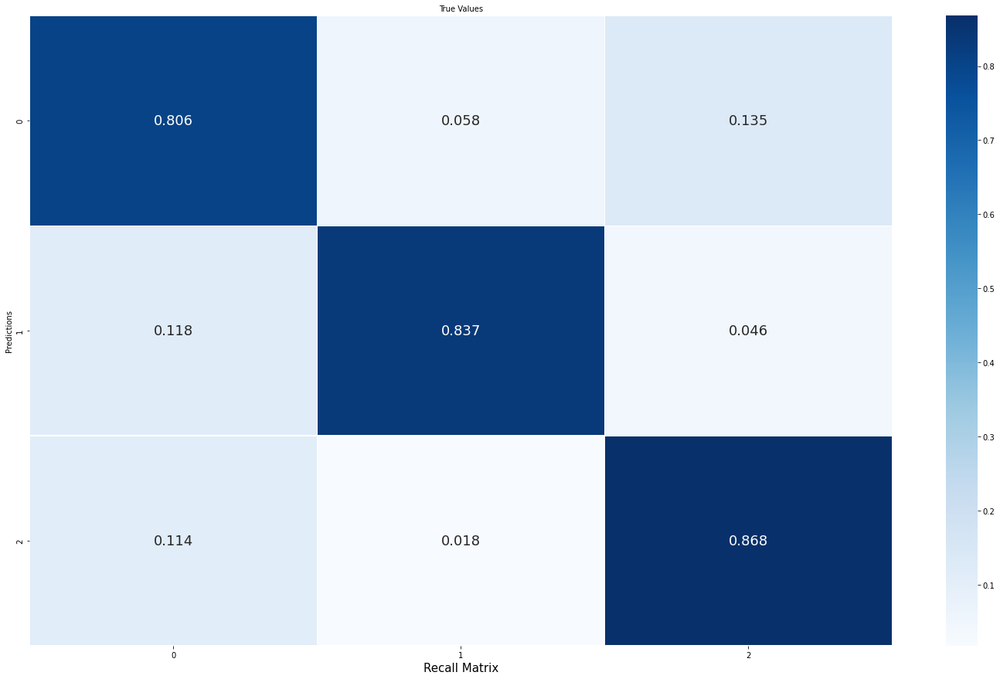

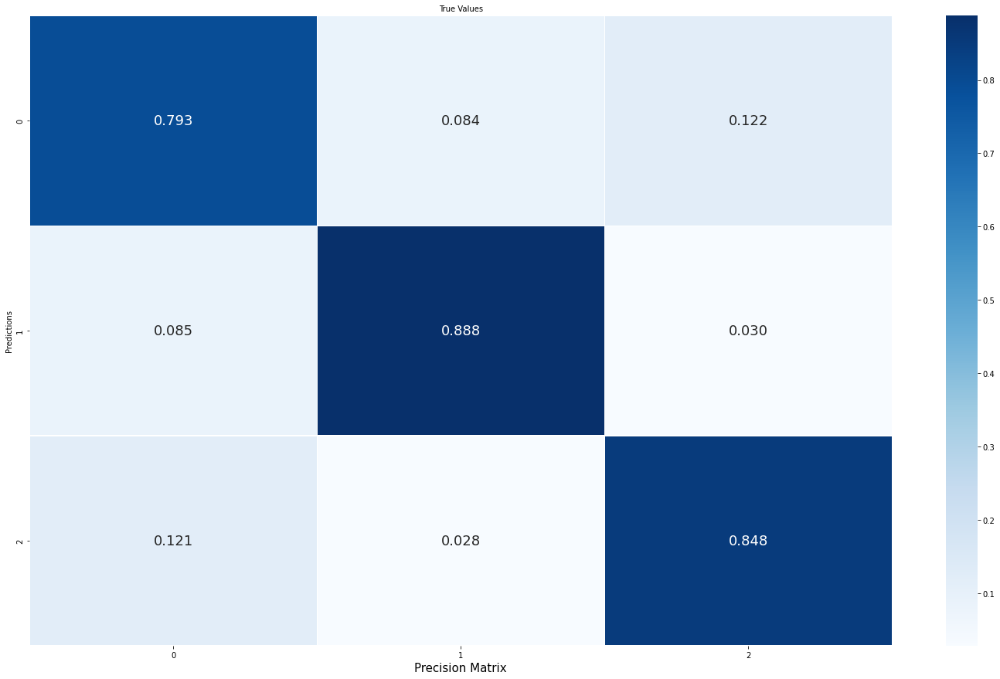

In [ ]:
import seaborn as sns

confm=pd.crosstab(val_Y195, y_predrf_vl19)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size":18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

#Modelo 2-biLSTM


##Pasando a tensor los datos

In [ ]:
TX_train175=tf.convert_to_tensor(train_X175, dtype=float)

TX_val175=tf.convert_to_tensor(val_X175,dtype=float)

TX_train185=tf.convert_to_tensor(train_X185, dtype=float)

TX_val185=tf.convert_to_tensor(val_X185,dtype=float)

TX_train195=tf.convert_to_tensor(train_X195, dtype=float)

TX_val195=tf.convert_to_tensor(val_X195,dtype=float)

##Función para visualizar el proceso de entrenamiento y validación

## Modelos planteados con diferentes hiperparámetros

In [ ]:
def plot_curves(history):
  plt.figure()
  plt.xlabel('Épocas')
  plt.ylabel('Error')
  plt.plot(history['loss'])
  plt.plot(history['val_loss']) 
  plt.legend(['Entrenamiento', 'Validación'])

  plt.figure()
  plt.xlabel('Épocas')
  plt.ylabel('Accuracy')
  plt.plot(history['accuracy'])
  plt.plot(history['val_accuracy'])
  plt.legend(['Entrenamiento', 'Validación'], loc='lower right');


In [ ]:
#(lr=0.01, bs=64)==1, (lr=0.01, bs=128)==2, (lr=0.01, bs=256)==3, (lr=0.001, bs=64)==4, (lr=0.001, bs=128)==5, (lr=0.001, bs=256)==6

lr = 0.01
batch_size = 64
n_epochs = 30
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

import os

checkpoint_path = "training_4/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

#REGULARIZACIÓN L2 CON 0.01
num_feat=3
model1 = Sequential()
model1.add(Bidirectional(LSTM(40,return_sequences=True, activation='tanh', recurrent_activation='sigmoid' , kernel_regularizer=regularizers.l2(0.01),use_bias=False)))
model1.add(Bidirectional(LSTM(40,activation='tanh', recurrent_activation='sigmoid', kernel_regularizer=regularizers.l2(0.01) ,use_bias=False)))
model1.add(Dense(num_feat, activation='softmax'))
model1.compile(loss='categorical_crossentropy', optimizer= optimizer, metrics=['accuracy'])

#
##SPLIT DATA FOR CROSS VALIDATION (CON StratifiedKFold)
#folds = StratifiedKFold(n_splits=7)
#results_CV=[]
#for train_index, test_index in kf.split(X_CV):
# X_train, X_test, y_train, y_test = X_CV.iloc[train_index, :], X_CV.iloc[test_index, :], Y_CV.iloc[train_index, :], Y_CV.iloc[test_index, :]
# results_CV.append(get_score(model, X_train, X_test, y_train, y_test))

In [ ]:
#(lr=0.01, bs=64)==1, (lr=0.01, bs=128)==2, (lr=0.01, bs=256)==3, (lr=0.001, bs=64)==4, (lr=0.001, bs=128)==5, (lr=0.001, bs=256)==6

lr = 0.01
batch_size = 128
n_epochs = 30
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

import os

checkpoint_path = "training_4/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

#REGULARIZACIÓN L2 CON 0.01
num_feat=3
model2 = Sequential()
model2.add(Bidirectional(LSTM(40,return_sequences=True, activation='tanh', recurrent_activation='sigmoid' , kernel_regularizer=regularizers.l2(0.01),use_bias=False)))
model2.add(Bidirectional(LSTM(40,activation='tanh', recurrent_activation='sigmoid', kernel_regularizer=regularizers.l2(0.01) ,use_bias=False)))
model2.add(Dense(num_feat, activation='softmax'))
model2.compile(loss='categorical_crossentropy', optimizer= optimizer, metrics=['accuracy'])

In [ ]:
#(lr=0.01, bs=64)==1, (lr=0.01, bs=128)==2, (lr=0.01, bs=256)==3, (lr=0.001, bs=64)==4, (lr=0.001, bs=128)==5, (lr=0.001, bs=256)==6

lr = 0.01
batch_size = 256
n_epochs = 30
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

import os

checkpoint_path = "training_4/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

#REGULARIZACIÓN L2 CON 0.01
num_feat=3
model3 = Sequential()
model3.add(Bidirectional(LSTM(40,return_sequences=True, activation='tanh', recurrent_activation='sigmoid' , kernel_regularizer=regularizers.l2(0.01),use_bias=False)))
model3.add(Bidirectional(LSTM(40,activation='tanh', recurrent_activation='sigmoid', kernel_regularizer=regularizers.l2(0.01) ,use_bias=False)))
model3.add(Dense(num_feat, activation='softmax'))
model3.compile(loss='categorical_crossentropy', optimizer= optimizer, metrics=['accuracy'])

In [ ]:
#(lr=0.01, bs=64)==1, (lr=0.01, bs=128)==2, (lr=0.01, bs=256)==3, (lr=0.001, bs=64)==4, (lr=0.001, bs=128)==5, (lr=0.001, bs=256)==6

lr = 0.001
batch_size = 64
n_epochs = 30
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

import os

checkpoint_path = "training_4/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

#REGULARIZACIÓN L2 CON 0.01
num_feat=3
model4 = Sequential()
model4.add(Bidirectional(LSTM(40,return_sequences=True, activation='tanh', recurrent_activation='sigmoid' , kernel_regularizer=regularizers.l2(0.01),use_bias=False)))
model4.add(Bidirectional(LSTM(40,activation='tanh', recurrent_activation='sigmoid', kernel_regularizer=regularizers.l2(0.01) ,use_bias=False)))
model4.add(Dense(num_feat, activation='softmax'))
model4.compile(loss='categorical_crossentropy', optimizer= optimizer, metrics=['accuracy'])

In [ ]:
#(lr=0.01, bs=64)==1, (lr=0.01, bs=128)==2, (lr=0.01, bs=256)==3, (lr=0.001, bs=64)==4, (lr=0.001, bs=128)==5, (lr=0.001, bs=256)==6

lr = 0.001
batch_size = 128
n_epochs = 30
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

import os

checkpoint_path = "training_4/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

#REGULARIZACIÓN L2 CON 0.01
num_feat=3
model5 = Sequential()
model5.add(Bidirectional(LSTM(40,return_sequences=True, activation='tanh', recurrent_activation='sigmoid' , kernel_regularizer=regularizers.l2(0.01),use_bias=False)))
model5.add(Bidirectional(LSTM(40,activation='tanh', recurrent_activation='sigmoid', kernel_regularizer=regularizers.l2(0.01) ,use_bias=False)))
model5.add(Dense(num_feat, activation='softmax'))
model5.compile(loss='categorical_crossentropy', optimizer= optimizer, metrics=['accuracy'])

In [ ]:
#(lr=0.01, bs=64)==1, (lr=0.01, bs=128)==2, (lr=0.01, bs=256)==3, (lr=0.001, bs=64)==4, (lr=0.001, bs=128)==5, (lr=0.001, bs=256)==6

lr = 0.001
batch_size = 256
n_epochs = 30
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

import os

checkpoint_path = "training_4/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

#REGULARIZACIÓN L2 CON 0.01
num_feat=3
model6 = Sequential()
model6.add(Bidirectional(LSTM(40,return_sequences=True, activation='tanh', recurrent_activation='sigmoid' , kernel_regularizer=regularizers.l2(0.01),use_bias=False)))
model6.add(Bidirectional(LSTM(40,activation='tanh', recurrent_activation='sigmoid', kernel_regularizer=regularizers.l2(0.01) ,use_bias=False)))
model6.add(Dense(num_feat, activation='softmax'))
model6.compile(loss='categorical_crossentropy', optimizer= optimizer, metrics=['accuracy'])

##Selección mejores hiperparámetros de la red con datos de 2017

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model1.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=64, 
                                epochs=20, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model1.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model1.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/20
139/139 [==============================] - 74s 534ms/step - loss: 1.2983 - accuracy: 0.1877 - val_loss: 1.1953 - val_accuracy: 0.1836

Epoch 00001: val_accuracy improved from -inf to 0.18358, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/20
139/139 [==============================] - 76s 550ms/step - loss: 1.2764 - accuracy: 0.1916 - val_loss: 1.1942 - val_accuracy: 0.1836

Epoch 00002: val_accuracy did not improve from 0.18358
Epoch 3/20
139/139 [==============================] - 76s 548ms/step - loss: 1.2746 - accuracy: 0.1843 - val_loss: 1.1807 - val_accuracy: 0.1836

Epoch 00003: val_accuracy did not improve from 0.18358
Epoch 4/20
139/139 [==============================] - 80s 578ms/step - loss: 1.2719 - accuracy: 0.2269 - val_loss: 1.1789 - val_accuracy: 0.2139

Epoch 00004: val_accuracy improved from 0.18358 to 0.21393, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/asse

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model2.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=128, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model2.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model2.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 83s 567ms/step - loss: 1.3715 - accuracy: 0.2009 - val_loss: 1.2593 - val_accuracy: 0.1836

Epoch 00001: val_accuracy improved from -inf to 0.18357, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 76s 550ms/step - loss: 1.3005 - accuracy: 0.1846 - val_loss: 1.1707 - val_accuracy: 0.1836

Epoch 00002: val_accuracy did not improve from 0.18357
Epoch 3/30
139/139 [==============================] - 76s 548ms/step - loss: 1.2780 - accuracy: 0.1890 - val_loss: 1.2284 - val_accuracy: 0.1836

Epoch 00003: val_accuracy did not improve from 0.18357
Epoch 4/30
139/139 [==============================] - 75s 543ms/step - loss: 1.2835 - accuracy: 0.1878 - val_loss: 1.1779 - val_accuracy: 0.1836

Epoch 00004: val_accuracy did not improve from 0.18357
Epoch 5/30
139/139 [==============================] - 78s 568ms/step - loss: 1.3322 - accuracy: 0.

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model3.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=256, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model3.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model3.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 109s 746ms/step - loss: 1.3246 - accuracy: 0.2590 - val_loss: 1.1060 - val_accuracy: 0.4042

Epoch 00001: val_accuracy improved from -inf to 0.40416, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 104s 753ms/step - loss: 0.9391 - accuracy: 0.4557 - val_loss: 0.9174 - val_accuracy: 0.4294

Epoch 00002: val_accuracy improved from 0.40416 to 0.42941, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 102s 738ms/step - loss: 0.8610 - accuracy: 0.5439 - val_loss: 0.7862 - val_accuracy: 0.6368

Epoch 00003: val_accuracy improved from 0.42941 to 0.63682, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 101s 733ms/step - loss: 0.8175 - accurac

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model4.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=64, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model4.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model4.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 106s 724ms/step - loss: 1.9026 - accuracy: 0.2955 - val_loss: 1.0133 - val_accuracy: 0.5106

Epoch 00001: val_accuracy improved from -inf to 0.51065, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 102s 741ms/step - loss: 0.9797 - accuracy: 0.5447 - val_loss: 0.8860 - val_accuracy: 0.5918

Epoch 00002: val_accuracy improved from 0.51065 to 0.59185, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 103s 747ms/step - loss: 0.9005 - accuracy: 0.5963 - val_loss: 0.8293 - val_accuracy: 0.6375

Epoch 00003: val_accuracy improved from 0.59185 to 0.63751, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 104s 750ms/step - loss: 0.8785 - accurac

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model5.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=128, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model5.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model5.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 105s 717ms/step - loss: 1.9326 - accuracy: 0.2620 - val_loss: 1.0868 - val_accuracy: 0.3985

Epoch 00001: val_accuracy improved from -inf to 0.39851, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 97s 703ms/step - loss: 0.9588 - accuracy: 0.4900 - val_loss: 0.8798 - val_accuracy: 0.5051

Epoch 00002: val_accuracy improved from 0.39851 to 0.50514, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 99s 716ms/step - loss: 0.8776 - accuracy: 0.5250 - val_loss: 0.7925 - val_accuracy: 0.6276

Epoch 00003: val_accuracy improved from 0.50514 to 0.62763, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 97s 700ms/step - loss: 0.8578 - accuracy: 

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps175
Y = train_Y175.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model6.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps175, dtype=float), pd.get_dummies(val_Y175)), 
                                batch_size=256, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW175, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model6.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model6.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 104s 707ms/step - loss: 1.9409 - accuracy: 0.2545 - val_loss: 1.0877 - val_accuracy: 0.3652

Epoch 00001: val_accuracy improved from -inf to 0.36516, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 94s 678ms/step - loss: 0.9607 - accuracy: 0.4884 - val_loss: 0.8319 - val_accuracy: 0.5718

Epoch 00002: val_accuracy improved from 0.36516 to 0.57177, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 96s 696ms/step - loss: 0.8757 - accuracy: 0.5484 - val_loss: 0.8081 - val_accuracy: 0.5963

Epoch 00003: val_accuracy improved from 0.57177 to 0.59631, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 96s 696ms/step - loss: 0.8497 - accuracy: 

##Entrenamiento y resultados con la mejor red 2-BiLSTM obtenida para los datos de 2017

In [ ]:
import os

checkpoint_path = "training_2/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, monitor='val_accuracy',
                                                 save_best_only=True,
                                                 verbose=1)

cp_callback_list=[cp_callback]


histograma=model2.fit(TX_train175[:,:,None], pd.get_dummies(train_Y175), 
                       validation_data=(TX_val175[:,:,None], pd.get_dummies(val_Y175)), 
                       epochs=40, batch_size=128, callbacks=cp_callback_list)

Epoch 1/40
348/348 [==============================] - 102s 280ms/step - loss: 0.8386 - accuracy: 0.6712 - val_loss: 0.6358 - val_accuracy: 0.7370

Epoch 00001: val_accuracy improved from -inf to 0.73696, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 2/40
348/348 [==============================] - 99s 286ms/step - loss: 0.6213 - accuracy: 0.7502 - val_loss: 0.5816 - val_accuracy: 0.7766

Epoch 00002: val_accuracy improved from 0.73696 to 0.77661, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 3/40
348/348 [==============================] - 95s 275ms/step - loss: 0.5877 - accuracy: 0.7651 - val_loss: 0.6264 - val_accuracy: 0.7288

Epoch 00003: val_accuracy did not improve from 0.77661
Epoch 4/40
348/348 [==============================] - 98s 282ms/step - loss: 0.5647 - accuracy: 0.7772 - val_loss: 0.5549 - val_accuracy: 0.7825

Epoch 00004: val_accuracy improved from 0.77661 to 0.78253, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 5/40
348/348 [==============================] - 99s 284ms/step - loss: 0.5599 - accuracy: 0.7778 - val_loss: 0.5779 - val_accuracy: 0.7727

Epoch 00005: val_accuracy did not improve from 0.78253
Epoch 6/40
348/348 [==============================] - 97s 280ms/step - loss: 0.5452 - accuracy: 0.7858 - val_loss: 0.5394 - val_accuracy: 0.7862

Epoch 00006: val_accuracy improved from 0.78253 to 0.78616, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 7/40
348/348 [==============================] - 97s 278ms/step - loss: 0.5487 - accuracy: 0.7834 - val_loss: 0.5316 - val_accuracy: 0.7936

Epoch 00007: val_accuracy improved from 0.78616 to 0.79355, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 8/40
348/348 [==============================] - 99s 284ms/step - loss: 0.5403 - accuracy: 0.7882 - val_loss: 0.5247 - val_accuracy: 0.7948

Epoch 00008: val_accuracy improved from 0.79355 to 0.79478, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 9/40
348/348 [==============================] - 97s 279ms/step - loss: 0.5370 - accuracy: 0.7891 - val_loss: 0.5243 - val_accuracy: 0.7967

Epoch 00009: val_accuracy improved from 0.79478 to 0.79675, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 10/40
348/348 [==============================] - 98s 282ms/step - loss: 0.5319 - accuracy: 0.7911 - val_loss: 0.5249 - val_accuracy: 0.7955

Epoch 00010: val_accuracy did not improve from 0.79675
Epoch 11/40
348/348 [==============================] - 98s 282ms/step - loss: 0.5277 - accuracy: 0.7938 - val_loss: 0.5356 - val_accuracy: 0.7892

Epoch 00011: val_accuracy did not improve from 0.79675
Epoch 12/40
348/348 [==============================] - 100s 287ms/step - loss: 0.5295 - accuracy: 0.7921 - val_loss: 0.5293 - val_accuracy: 0.7897

Epoch 00012: val_accuracy did not improve from 0.79675
Epoch 13/40
348/348 [==============================] - 98s 284ms/step - loss: 0.5258 - accuracy: 0.7920 - val_loss: 0.5130 - val_accuracy: 0.8004

Epoch 00013: val_accuracy improved from 0.79675 to 0.80039, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 14/40
348/348 [==============================] - 96s 276ms/step - loss: 0.5240 - accuracy: 0.7952 - val_loss: 0.5932 - val_accuracy: 0.7545

Epoch 00014: val_accuracy did not improve from 0.80039
Epoch 15/40
348/348 [==============================] - 99s 284ms/step - loss: 0.5252 - accuracy: 0.7934 - val_loss: 0.5386 - val_accuracy: 0.7828

Epoch 00015: val_accuracy did not improve from 0.80039
Epoch 16/40
348/348 [==============================] - 98s 281ms/step - loss: 0.5171 - accuracy: 0.7967 - val_loss: 0.6025 - val_accuracy: 0.7505

Epoch 00016: val_accuracy did not improve from 0.80039
Epoch 17/40
348/348 [==============================] - 98s 283ms/step - loss: 0.5203 - accuracy: 0.7950 - val_loss: 0.5252 - val_accuracy: 0.7961

Epoch 00017: val_accuracy did not improve from 0.80039
Epoch 18/40
348/348 [==============================] - 97s 281ms/step - loss: 0.5163 - accuracy: 0.7969 - val_loss: 0.5187 - val_accuracy: 0.7961

Epoch 00018: val_accuracy did not improve fro

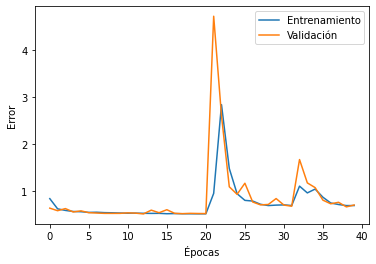

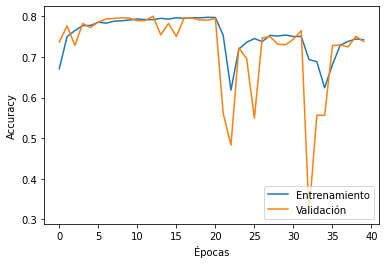

In [ ]:
plot_curves(histograma.history)

In [ ]:
#predicciones del modelo
from sklearn.metrics import classification_report


predictions_train=model2.predict(TX_train175[:,:,None])
resultados_train=np.argmax(predictions_train, axis=1)

predictions_val = model2.predict(TX_val175[:,:,None])
resultados_val=np.argmax(predictions_val, axis=1)

print(classification_report(train_Y175, resultados_train))
print(classification_report(val_Y175, resultados_val))







              precision    recall  f1-score   support

           0       0.72      0.90      0.80     24755
           1       0.90      0.68      0.77     11471
           2       0.56      0.32      0.41      8202

    accuracy                           0.74     44428
   macro avg       0.73      0.63      0.66     44428
weighted avg       0.74      0.74      0.72     44428

              precision    recall  f1-score   support

           0       0.72      0.90      0.80    469348
           1       0.90      0.68      0.77    219834
           2       0.57      0.33      0.41    154955

    accuracy                           0.74    844137
   macro avg       0.73      0.63      0.66    844137
weighted avg       0.74      0.74      0.72    844137



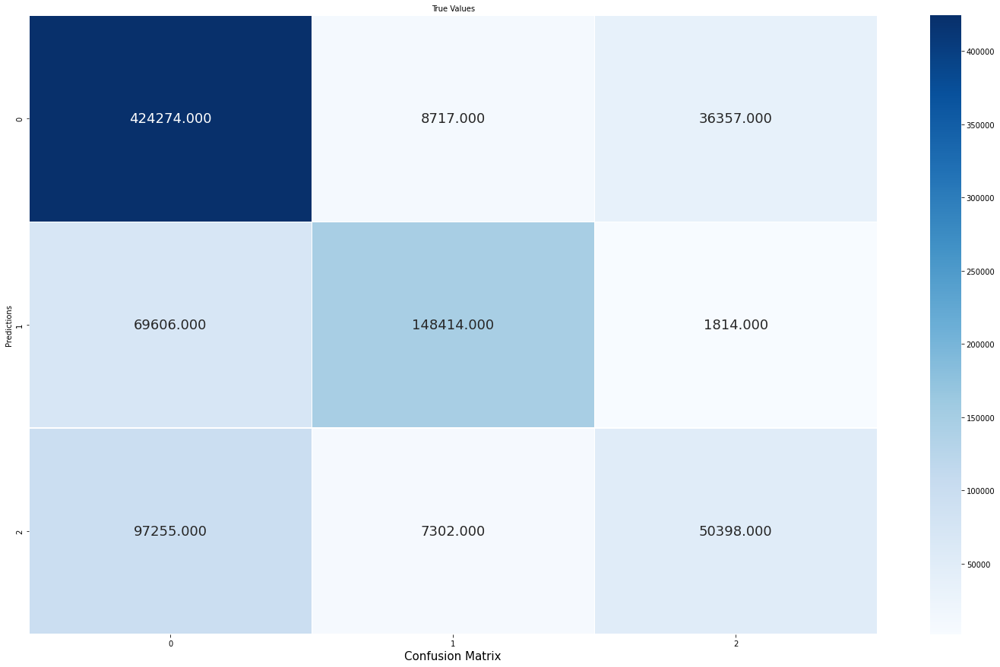

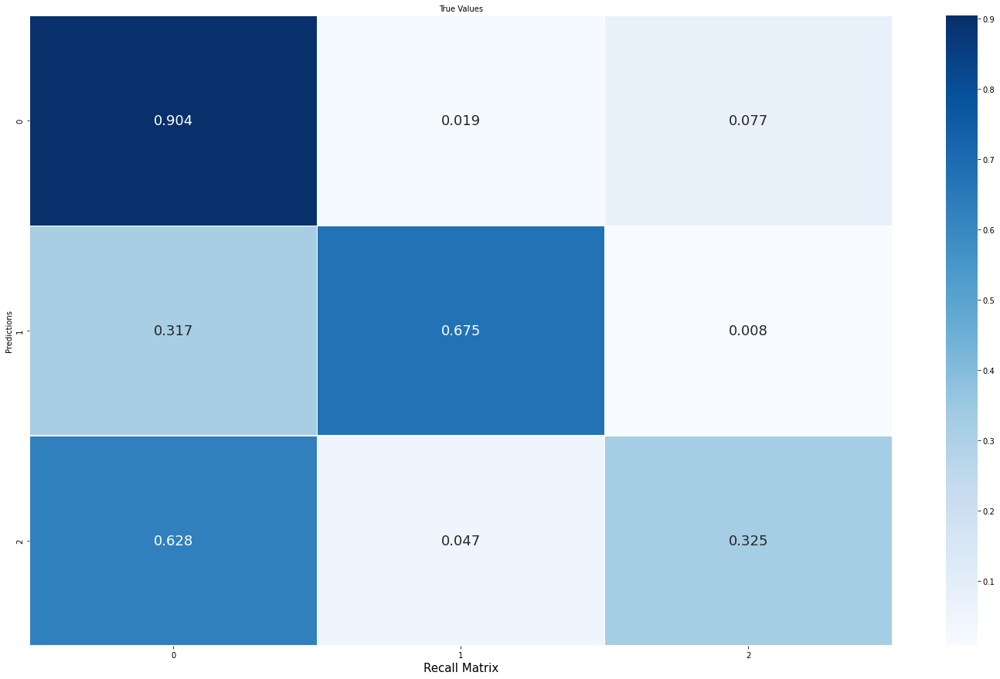

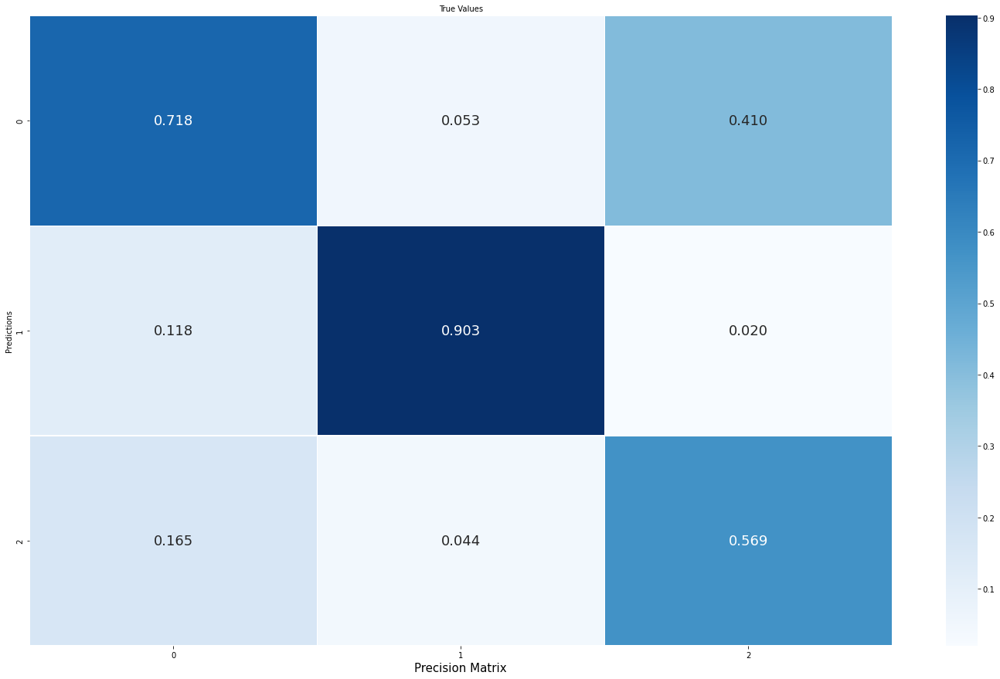

In [ ]:
confm=pd.crosstab(val_Y175, resultados_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm ,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Selección mejores hiperparámetros de la red con datos de 2018

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model1.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=64, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model1.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model1.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 102s 701ms/step - loss: 1.4406 - accuracy: 0.2742 - val_loss: 1.2078 - val_accuracy: 0.2704

Epoch 00001: val_accuracy improved from -inf to 0.27036, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 89s 647ms/step - loss: 1.3796 - accuracy: 0.3144 - val_loss: 1.2326 - val_accuracy: 0.2791

Epoch 00002: val_accuracy improved from 0.27036 to 0.27912, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 94s 681ms/step - loss: 1.3004 - accuracy: 0.3237 - val_loss: 0.9908 - val_accuracy: 0.4404

Epoch 00003: val_accuracy improved from 0.27912 to 0.44037, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 94s 679ms/step - loss: 1.0048 - accuracy: 

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model2.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=128, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model2.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model2.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 88s 607ms/step - loss: 1.4482 - accuracy: 0.2745 - val_loss: 1.1783 - val_accuracy: 0.2704

Epoch 00001: val_accuracy improved from -inf to 0.27036, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 85s 615ms/step - loss: 1.3434 - accuracy: 0.2729 - val_loss: 1.1840 - val_accuracy: 0.2704

Epoch 00002: val_accuracy did not improve from 0.27036
Epoch 3/30
139/139 [==============================] - 85s 613ms/step - loss: 1.3432 - accuracy: 0.2739 - val_loss: 1.1858 - val_accuracy: 0.2704

Epoch 00003: val_accuracy did not improve from 0.27036
Epoch 4/30
139/139 [==============================] - 85s 615ms/step - loss: 1.3509 - accuracy: 0.2735 - val_loss: 1.1772 - val_accuracy: 0.2704

Epoch 00004: val_accuracy did not improve from 0.27036
Epoch 5/30
139/139 [==============================] - 87s 628ms/step - loss: 1.3814 - accuracy: 0.

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model3.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=256, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model3.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model3.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 87s 597ms/step - loss: 1.4309 - accuracy: 0.2837 - val_loss: 1.1886 - val_accuracy: 0.2704

Epoch 00001: val_accuracy improved from -inf to 0.27036, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 83s 602ms/step - loss: 1.3425 - accuracy: 0.2769 - val_loss: 1.1631 - val_accuracy: 0.2704

Epoch 00002: val_accuracy did not improve from 0.27036
Epoch 3/30
139/139 [==============================] - 82s 591ms/step - loss: 1.4580 - accuracy: 0.2818 - val_loss: 1.2852 - val_accuracy: 0.2704

Epoch 00003: val_accuracy did not improve from 0.27036
Epoch 4/30
139/139 [==============================] - 82s 596ms/step - loss: 1.3751 - accuracy: 0.2729 - val_loss: 1.1886 - val_accuracy: 0.2704

Epoch 00004: val_accuracy did not improve from 0.27036
Epoch 5/30
139/139 [==============================] - 83s 603ms/step - loss: 1.3067 - accuracy: 0.

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model4.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=64, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model4.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model4.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 86s 590ms/step - loss: 2.0271 - accuracy: 0.3060 - val_loss: 1.0806 - val_accuracy: 0.4958

Epoch 00001: val_accuracy improved from -inf to 0.49581, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 81s 589ms/step - loss: 1.0430 - accuracy: 0.5045 - val_loss: 0.8684 - val_accuracy: 0.5585

Epoch 00002: val_accuracy improved from 0.49581 to 0.55853, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 79s 571ms/step - loss: 0.9479 - accuracy: 0.5462 - val_loss: 0.8599 - val_accuracy: 0.5552

Epoch 00003: val_accuracy did not improve from 0.55853
Epoch 4/30
139/139 [==============================] - 82s 590ms/step - loss: 0.9304 - accuracy: 0.5538 - val_loss: 0.8241 - val_accuracy: 0.5813

Epoch 00004: val_accuracy improved from 0.55853 to 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model5.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=128, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model5.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model5.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 92s 633ms/step - loss: 1.9917 - accuracy: 0.3300 - val_loss: 1.0840 - val_accuracy: 0.4214

Epoch 00001: val_accuracy improved from -inf to 0.42138, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 86s 622ms/step - loss: 0.9553 - accuracy: 0.5576 - val_loss: 0.8169 - val_accuracy: 0.6112

Epoch 00002: val_accuracy improved from 0.42138 to 0.61119, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 86s 624ms/step - loss: 0.8543 - accuracy: 0.6280 - val_loss: 0.8323 - val_accuracy: 0.6323

Epoch 00003: val_accuracy improved from 0.61119 to 0.63227, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 86s 621ms/step - loss: 0.7949 - accuracy: 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps185
Y = train_Y185.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model6.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps185, dtype=float), pd.get_dummies(val_Y185)), 
                                batch_size=256, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW185, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model6.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model6.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 115s 795ms/step - loss: 2.0028 - accuracy: 0.3302 - val_loss: 1.0018 - val_accuracy: 0.5336

Epoch 00001: val_accuracy improved from -inf to 0.53360, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 108s 783ms/step - loss: 0.9742 - accuracy: 0.5508 - val_loss: 0.9316 - val_accuracy: 0.5301

Epoch 00002: val_accuracy did not improve from 0.53360
Epoch 3/30
139/139 [==============================] - 100s 727ms/step - loss: 0.8712 - accuracy: 0.6104 - val_loss: 0.7956 - val_accuracy: 0.6318

Epoch 00003: val_accuracy improved from 0.53360 to 0.63185, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 97s 699ms/step - loss: 0.8465 - accuracy: 0.6343 - val_loss: 0.7781 - val_accuracy: 0.6463

Epoch 00004: val_accuracy improved from 0.63185 t

##Entrenamiento y resultados con la mejor red 2-BiLSTM obtenida para los datos de 2018

In [ ]:
import os

checkpoint_path = "training_2/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, monitor='val_accuracy',
                                                 save_best_only=True,
                                                 verbose=1)

cp_callback_list=[cp_callback]


histograma=model3.fit(TX_train185[:,:,None], pd.get_dummies(train_Y185), 
                       validation_data=(TX_val185[:,:,None], pd.get_dummies(val_Y185)), 
                       epochs=40, batch_size=256, callbacks=cp_callback_list)

Epoch 1/40
174/174 [==============================] - 87s 500ms/step - loss: 0.5670 - accuracy: 0.7698 - val_loss: 0.5361 - val_accuracy: 0.7805

Epoch 00001: val_accuracy improved from -inf to 0.78055, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 2/40
174/174 [==============================] - 88s 506ms/step - loss: 0.5323 - accuracy: 0.7832 - val_loss: 0.5415 - val_accuracy: 0.7807

Epoch 00002: val_accuracy improved from 0.78055 to 0.78075, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 3/40
174/174 [==============================] - 86s 497ms/step - loss: 0.5322 - accuracy: 0.7846 - val_loss: 0.5533 - val_accuracy: 0.7824

Epoch 00003: val_accuracy improved from 0.78075 to 0.78245, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 4/40
174/174 [==============================] - 87s 505ms/step - loss: 0.5314 - accuracy: 0.7837 - val_loss: 0.5505 - val_accuracy: 0.7752

Epoch 00004: val_accuracy did not improve from 0.78245
Epoch 5/40
174/174 [==============================] - 87s 505ms/step - loss: 0.5207 - accuracy: 0.7882 - val_loss: 0.5255 - val_accuracy: 0.7859

Epoch 00005: val_accuracy improved from 0.78245 to 0.78587, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 6/40
174/174 [==============================] - 87s 502ms/step - loss: 0.5204 - accuracy: 0.7895 - val_loss: 0.5108 - val_accuracy: 0.7940

Epoch 00006: val_accuracy improved from 0.78587 to 0.79397, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 7/40
174/174 [==============================] - 88s 509ms/step - loss: 0.5175 - accuracy: 0.7896 - val_loss: 0.5122 - val_accuracy: 0.7948

Epoch 00007: val_accuracy improved from 0.79397 to 0.79477, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 8/40
174/174 [==============================] - 83s 480ms/step - loss: 0.5119 - accuracy: 0.7938 - val_loss: 0.5021 - val_accuracy: 0.7963

Epoch 00008: val_accuracy improved from 0.79477 to 0.79631, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 9/40
174/174 [==============================] - 87s 501ms/step - loss: 0.5075 - accuracy: 0.7952 - val_loss: 0.5115 - val_accuracy: 0.7955

Epoch 00009: val_accuracy did not improve from 0.79631
Epoch 10/40
174/174 [==============================] - 86s 499ms/step - loss: 0.5080 - accuracy: 0.7963 - val_loss: 0.4954 - val_accuracy: 0.8029

Epoch 00010: val_accuracy improved from 0.79631 to 0.80290, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 11/40
174/174 [==============================] - 85s 493ms/step - loss: 0.5108 - accuracy: 0.7958 - val_loss: 0.5116 - val_accuracy: 0.7956

Epoch 00011: val_accuracy did not improve from 0.80290
Epoch 12/40
174/174 [==============================] - 86s 499ms/step - loss: 0.5012 - accuracy: 0.7983 - val_loss: 0.4973 - val_accuracy: 0.8008

Epoch 00012: val_accuracy did not improve from 0.80290
Epoch 13/40
174/174 [==============================] - 86s 494ms/step - loss: 0.5062 - accuracy: 0.7987 - val_loss: 0.5262 - val_accuracy: 0.7908

Epoch 00013: val_accuracy did not improve from 0.80290
Epoch 14/40
174/174 [==============================] - 85s 492ms/step - loss: 0.5039 - accuracy: 0.7977 - val_loss: 0.5092 - val_accuracy: 0.7978

Epoch 00014: val_accuracy did not improve from 0.80290
Epoch 15/40
174/174 [==============================] - 85s 493ms/step - loss: 0.5015 - accuracy: 0.7992 - val_loss: 0.5014 - val_accuracy: 0.7995

Epoch 00015: val_accuracy did not improve fro

INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 17/40
174/174 [==============================] - 85s 489ms/step - loss: 0.4957 - accuracy: 0.8022 - val_loss: 0.4821 - val_accuracy: 0.8098

Epoch 00017: val_accuracy improved from 0.80327 to 0.80977, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 18/40
174/174 [==============================] - 86s 497ms/step - loss: 0.4898 - accuracy: 0.8039 - val_loss: 0.5064 - val_accuracy: 0.7954

Epoch 00018: val_accuracy did not improve from 0.80977
Epoch 19/40
174/174 [==============================] - 86s 497ms/step - loss: 0.4911 - accuracy: 0.8039 - val_loss: 0.4930 - val_accuracy: 0.8048

Epoch 00019: val_accuracy did not improve from 0.80977
Epoch 20/40
174/174 [==============================] - 86s 494ms/step - loss: 0.4882 - accuracy: 0.8049 - val_loss: 0.5023 - val_accuracy: 0.7985

Epoch 00020: val_accuracy did not improve from 0.80977
Epoch 21/40
174/174 [==============================] - 87s 502ms/step - loss: 0.5008 - accuracy: 0.8015 - val_loss: 0.4839 - val_accuracy: 0.8077

Epoch 00021: val_accuracy did not improve from 0.80977
Epoch 22/40
174/174 [==============================] - 85s 493ms/step - loss: 0.4841 - accuracy: 0.8070 - val_loss: 0.4866 - val_accuracy: 0.8060

Epoch 00022: val_accuracy did not improve fro

INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 30/40
174/174 [==============================] - 86s 499ms/step - loss: 0.4728 - accuracy: 0.8111 - val_loss: 0.4891 - val_accuracy: 0.8074

Epoch 00030: val_accuracy did not improve from 0.81367
Epoch 31/40
174/174 [==============================] - 86s 496ms/step - loss: 0.4837 - accuracy: 0.8089 - val_loss: 0.4729 - val_accuracy: 0.8130

Epoch 00031: val_accuracy did not improve from 0.81367
Epoch 32/40
174/174 [==============================] - 87s 503ms/step - loss: 0.4726 - accuracy: 0.8133 - val_loss: 0.4799 - val_accuracy: 0.8097

Epoch 00032: val_accuracy did not improve from 0.81367
Epoch 33/40
174/174 [==============================] - 86s 496ms/step - loss: 0.4743 - accuracy: 0.8101 - val_loss: 0.4730 - val_accuracy: 0.8116

Epoch 00033: val_accuracy did not improve from 0.81367
Epoch 34/40
174/174 [==============================] - 86s 498ms/step - loss: 0.4731 - accuracy: 0.8109 - val_loss: 0.4849 - val_accuracy: 0.8065

Epoch 00034: val_accuracy did not improve fro

INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 37/40
174/174 [==============================] - 85s 489ms/step - loss: 0.4696 - accuracy: 0.8132 - val_loss: 0.4967 - val_accuracy: 0.8028

Epoch 00037: val_accuracy did not improve from 0.81578
Epoch 38/40
174/174 [==============================] - 86s 498ms/step - loss: 0.4706 - accuracy: 0.8127 - val_loss: 0.4729 - val_accuracy: 0.8112

Epoch 00038: val_accuracy did not improve from 0.81578
Epoch 39/40
174/174 [==============================] - 87s 500ms/step - loss: 0.4688 - accuracy: 0.8156 - val_loss: 0.4690 - val_accuracy: 0.8173

Epoch 00039: val_accuracy improved from 0.81578 to 0.81734, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


Epoch 40/40
174/174 [==============================] - 88s 505ms/step - loss: 0.4691 - accuracy: 0.8127 - val_loss: 0.4654 - val_accuracy: 0.8175

Epoch 00040: val_accuracy improved from 0.81734 to 0.81750, saving model to training_2/cp.ckpt
INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_2/cp.ckpt/assets


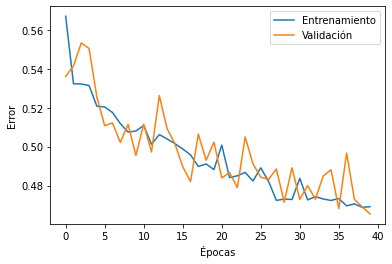

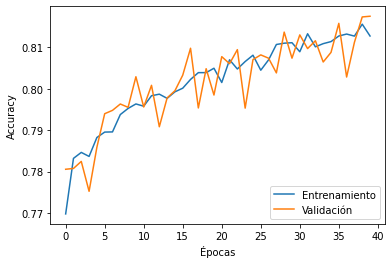

In [ ]:
plot_curves(histograma.history)

In [ ]:
#predicciones del modelo
from sklearn.metrics import classification_report


predictions_train=model3.predict(TX_train185[:,:,None])
resultados_train=np.argmax(predictions_train, axis=1)

predictions_val = model3.predict(TX_val185[:,:,None])
resultados_val=np.argmax(predictions_val, axis=1)

print(classification_report(train_Y185, resultados_train))
print(classification_report(val_Y185, resultados_val))


              precision    recall  f1-score   support

           0       0.83      0.83      0.83     20987
           1       0.85      0.83      0.84     11318
           2       0.78      0.81      0.79     12128

    accuracy                           0.82     44433
   macro avg       0.82      0.82      0.82     44433
weighted avg       0.82      0.82      0.82     44433

              precision    recall  f1-score   support

           0       0.83      0.82      0.83    400234
           1       0.85      0.82      0.84    215759
           2       0.77      0.80      0.79    228248

    accuracy                           0.82    844241
   macro avg       0.82      0.82      0.82    844241
weighted avg       0.82      0.82      0.82    844241



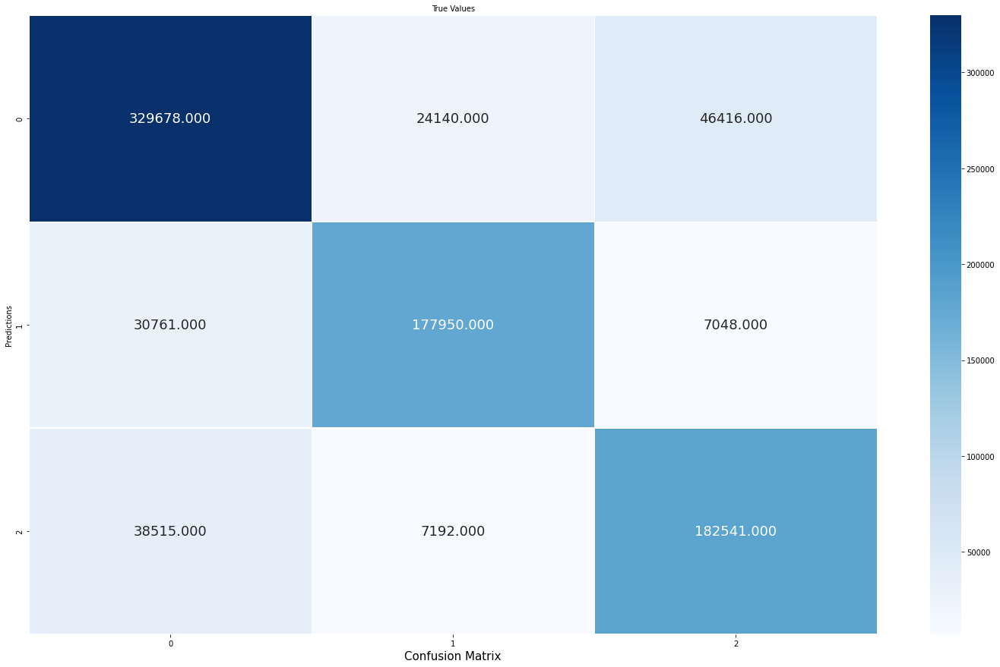

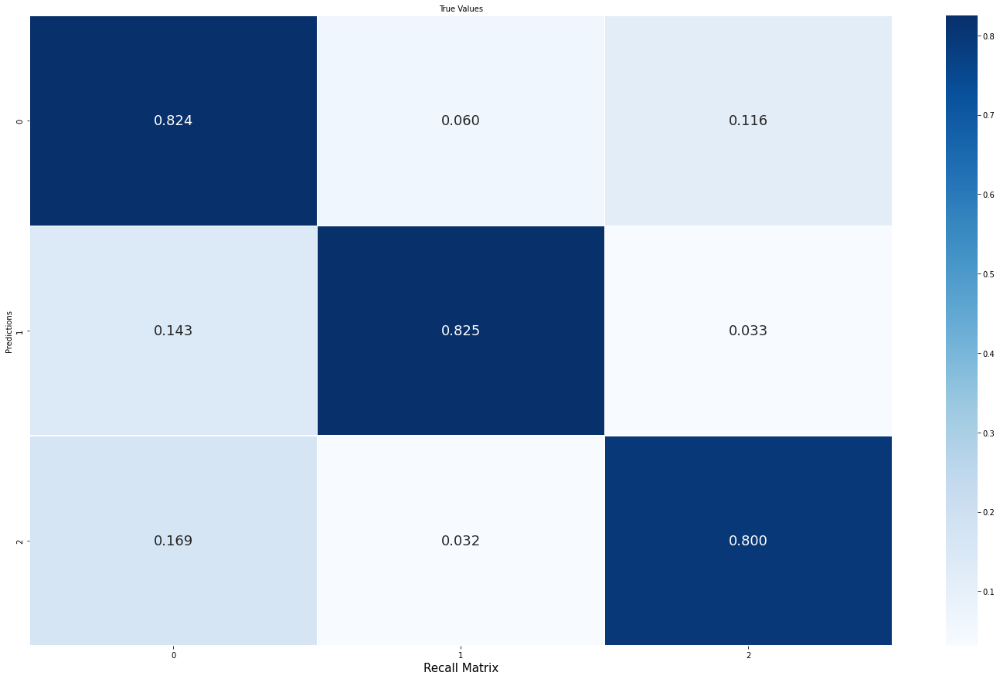

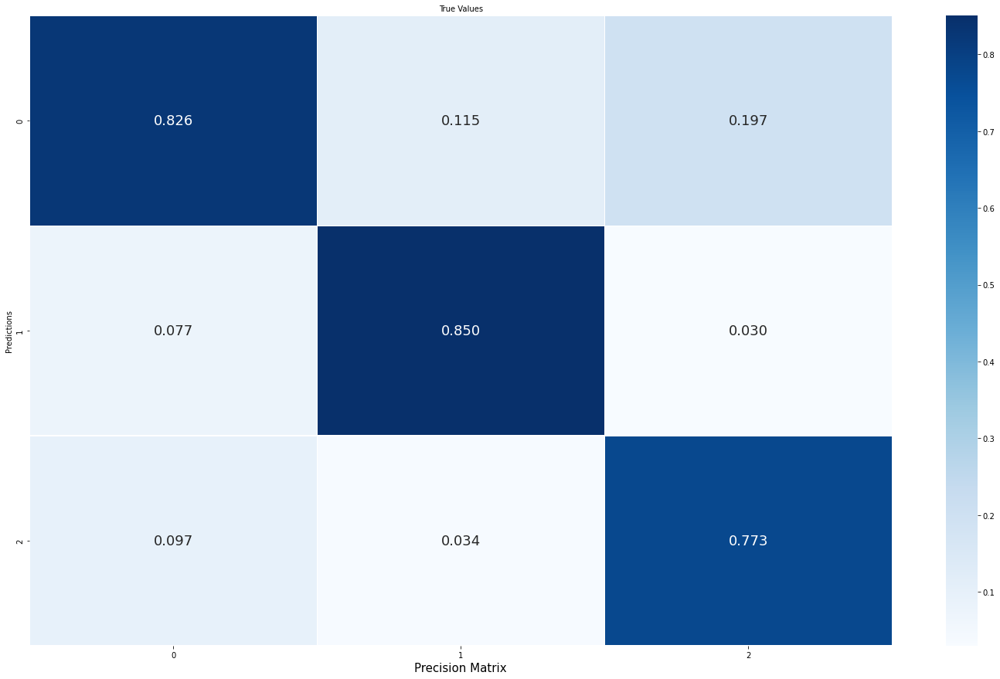

In [ ]:
confm=pd.crosstab(val_Y185, resultados_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm ,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

##Selección mejores hiperparámetros de la red con datos de 2019

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)


# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 5-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model1.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model1.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model1.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 92s 629ms/step - loss: 1.3837 - accuracy: 0.4842 - val_loss: 0.8233 - val_accuracy: 0.6343

Epoch 00001: val_accuracy improved from -inf to 0.63433, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 91s 657ms/step - loss: 0.9259 - accuracy: 0.6829 - val_loss: 0.7215 - val_accuracy: 0.7058

Epoch 00002: val_accuracy improved from 0.63433 to 0.70580, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 93s 675ms/step - loss: 0.8147 - accuracy: 0.7333 - val_loss: 0.7094 - val_accuracy: 0.7081

Epoch 00003: val_accuracy improved from 0.70580 to 0.70807, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 95s 689ms/step - loss: 0.8103 - accuracy: 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model2.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model2.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model2.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 92s 668ms/step - loss: 1.4461 - accuracy: 0.3886 - val_loss: 1.2972 - val_accuracy: 0.1836

Epoch 00001: val_accuracy improved from -inf to 0.18357, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 88s 636ms/step - loss: 1.2019 - accuracy: 0.5183 - val_loss: 1.0868 - val_accuracy: 0.4215

Epoch 00002: val_accuracy improved from 0.18357 to 0.42147, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 88s 635ms/step - loss: 0.9826 - accuracy: 0.6391 - val_loss: 0.9922 - val_accuracy: 0.5275

Epoch 00003: val_accuracy improved from 0.42147 to 0.52747, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 92s 669ms/step - loss: 0.8934 - accuracy: 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model3.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model3.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model3.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 88s 607ms/step - loss: 1.2549 - accuracy: 0.5333 - val_loss: 0.7631 - val_accuracy: 0.6808

Epoch 00001: val_accuracy improved from -inf to 0.68076, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 83s 600ms/step - loss: 0.8853 - accuracy: 0.6958 - val_loss: 0.7228 - val_accuracy: 0.7047

Epoch 00002: val_accuracy improved from 0.68076 to 0.70466, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 84s 607ms/step - loss: 0.8401 - accuracy: 0.7213 - val_loss: 0.7293 - val_accuracy: 0.7057

Epoch 00003: val_accuracy improved from 0.70466 to 0.70569, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 82s 592ms/step - loss: 0.7995 - accuracy: 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model4.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model4.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model4.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 81s 551ms/step - loss: 2.1656 - accuracy: 0.3853 - val_loss: 1.1424 - val_accuracy: 0.4972

Epoch 00001: val_accuracy improved from -inf to 0.49720, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 76s 547ms/step - loss: 1.2399 - accuracy: 0.5427 - val_loss: 0.8975 - val_accuracy: 0.6214

Epoch 00002: val_accuracy improved from 0.49720 to 0.62145, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 74s 537ms/step - loss: 1.0105 - accuracy: 0.6545 - val_loss: 0.8079 - val_accuracy: 0.6649

Epoch 00003: val_accuracy improved from 0.62145 to 0.66494, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 75s 546ms/step - loss: 0.9646 - accuracy: 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model5.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model5.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model5.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 81s 553ms/step - loss: 2.1247 - accuracy: 0.4137 - val_loss: 1.0510 - val_accuracy: 0.5440

Epoch 00001: val_accuracy improved from -inf to 0.54396, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 75s 541ms/step - loss: 1.1527 - accuracy: 0.5482 - val_loss: 0.9619 - val_accuracy: 0.5351

Epoch 00002: val_accuracy did not improve from 0.54396
Epoch 3/30
139/139 [==============================] - 76s 547ms/step - loss: 1.0828 - accuracy: 0.5736 - val_loss: 0.8567 - val_accuracy: 0.5990

Epoch 00003: val_accuracy improved from 0.54396 to 0.59899, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 4/30
139/139 [==============================] - 76s 550ms/step - loss: 1.0270 - accuracy: 0.6221 - val_loss: 0.7842 - val_accuracy: 0.6704

Epoch 00004: val_accuracy improved from 0.59899 to 0

In [ ]:
# fix random seed for reproducibility
from sklearn.model_selection import StratifiedKFold
import os

checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


LOAD_MODEL=False

if not LOAD_MODEL:

    
    checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1,
                                 save_best_only=True,
                                 mode='max') # graba sólo los que mejoran en validación
    callbacks_list = [checkpoint]

seed = 7

np.random.seed(seed)
# load pima indians dataset

# split into input (X) and output (Y) variables
X = train_Xnps195
Y = train_Y195.values

# define 10-fold cross validation test harness
kfold = StratifiedKFold(n_splits=5, shuffle=True , random_state=seed) 
cvscores = []
for train, test in kfold.split(X, Y):
  # create model
 model6.fit(tf.convert_to_tensor(X[train], dtype=float), pd.get_dummies(Y[train]), 
                                validation_data=(tf.convert_to_tensor(val_Xnps195, dtype=float), pd.get_dummies(val_Y195)), 
                                batch_size=batch_size, 
                                epochs=30, verbose=1,
                                class_weight=class_dictW195, 
                                callbacks=callbacks_list
                            )
 # evaluate the model
 scores = model6.evaluate(tf.convert_to_tensor(X[test], dtype=float), pd.get_dummies(Y[test]), verbose=0)

 print("%s: %.2f%%" % (model6.metrics_names[1], scores[1]*100))
 cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Epoch 1/30
139/139 [==============================] - 82s 560ms/step - loss: 2.1636 - accuracy: 0.3932 - val_loss: 1.0605 - val_accuracy: 0.5200

Epoch 00001: val_accuracy improved from -inf to 0.51998, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 2/30
139/139 [==============================] - 76s 547ms/step - loss: 1.0928 - accuracy: 0.5811 - val_loss: 0.8293 - val_accuracy: 0.6546

Epoch 00002: val_accuracy improved from 0.51998 to 0.65457, saving model to training_1/cp.ckpt
INFO:tensorflow:Assets written to: training_1/cp.ckpt/assets
Epoch 3/30
139/139 [==============================] - 77s 557ms/step - loss: 1.0143 - accuracy: 0.6425 - val_loss: 0.8735 - val_accuracy: 0.6058

Epoch 00003: val_accuracy did not improve from 0.65457
Epoch 4/30
139/139 [==============================] - 78s 568ms/step - loss: 0.9921 - accuracy: 0.6524 - val_loss: 0.8128 - val_accuracy: 0.6444

Epoch 00004: val_accuracy did not improve from 0.654

##Entrenamiento y resultados con la mejor red 2-BiLSTM obtenida para los datos de 2019

In [ ]:

batch_size = 256
n_epochs = 40


import os

checkpoint_path = "training_6/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, monitor='val_accuracy',
                                                 save_best_only=True,
                                                 verbose=1)

cp_callback_list=[cp_callback]


histograma=model3.fit(TX_train195[:,:,None], pd.get_dummies(train_Y195), 
                       validation_data=(TX_val195[:,:,None], pd.get_dummies(val_Y195)), 
                       epochs=40, batch_size=256, callbacks=cp_callback_list)

Epoch 1/40
174/174 [==============================] - 88s 481ms/step - loss: 1.0866 - accuracy: 0.5130 - val_loss: 0.7668 - val_accuracy: 0.6826

Epoch 00001: val_accuracy improved from -inf to 0.68263, saving model to training_6/cp.ckpt
INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 2/40
174/174 [==============================] - 83s 480ms/step - loss: 0.7310 - accuracy: 0.6959 - val_loss: 0.7590 - val_accuracy: 0.6823

Epoch 00002: val_accuracy did not improve from 0.68263
Epoch 3/40
174/174 [==============================] - 85s 488ms/step - loss: 0.6698 - accuracy: 0.7308 - val_loss: 0.6368 - val_accuracy: 0.7496

Epoch 00003: val_accuracy improved from 0.68263 to 0.74958, saving model to training_6/cp.ckpt
INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 4/40
174/174 [==============================] - 83s 478ms/step - loss: 0.6456 - accuracy: 0.7424 - val_loss: 0.6614 - val_accuracy: 0.7290

Epoch 00004: val_accuracy did not improve from 0.74958
Epoch 5/40
174/174 [==============================] - 83s 479ms/step - loss: 0.6420 - accuracy: 0.7460 - val_loss: 0.6587 - val_accuracy: 0.7396

Epoch 00005: val_accuracy did not improve from 0.74958
Epoch 6/40
174/174 [==============================] - 85s 490ms/step - loss: 0.6281 - accuracy: 0.7517 - val_loss: 0.6317 - val_accuracy: 0.7489

Epoch 00006: val_accuracy did not improve from 0.74958
Epoch 7/40
174/174 [==============================] - 85s 490ms/step - loss: 0.6268 - accuracy: 0.7522 - val_loss: 0.6285 - val_accuracy: 0.7464

Epoch 00007: val_accuracy did not improve from 0.74958
Epoch 8/40
174/174 [==============================] - 84s 487ms/step - loss: 0.6214 - accuracy: 0.7550 - val_loss: 0.6161 - val_accuracy: 0.7575

Epoch 00008: val_accuracy improved from 0.74958 to

INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 9/40
174/174 [==============================] - 81s 470ms/step - loss: 0.6170 - accuracy: 0.7555 - val_loss: 0.6222 - val_accuracy: 0.7512

Epoch 00009: val_accuracy did not improve from 0.75752
Epoch 10/40
174/174 [==============================] - 85s 490ms/step - loss: 0.6182 - accuracy: 0.7564 - val_loss: 0.6460 - val_accuracy: 0.7366

Epoch 00010: val_accuracy did not improve from 0.75752
Epoch 11/40
174/174 [==============================] - 83s 479ms/step - loss: 0.6179 - accuracy: 0.7562 - val_loss: 0.6244 - val_accuracy: 0.7512

Epoch 00011: val_accuracy did not improve from 0.75752
Epoch 12/40
174/174 [==============================] - 82s 472ms/step - loss: 0.6090 - accuracy: 0.7590 - val_loss: 0.6254 - val_accuracy: 0.7525

Epoch 00012: val_accuracy did not improve from 0.75752
Epoch 13/40
174/174 [==============================] - 85s 492ms/step - loss: 0.6178 - accuracy: 0.7554 - val_loss: 0.6085 - val_accuracy: 0.7583

Epoch 00013: val_accuracy improved from 0.7575

INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 14/40
174/174 [==============================] - 85s 492ms/step - loss: 0.6151 - accuracy: 0.7570 - val_loss: 0.6257 - val_accuracy: 0.7479

Epoch 00014: val_accuracy did not improve from 0.75832
Epoch 15/40
174/174 [==============================] - 83s 477ms/step - loss: 0.6001 - accuracy: 0.7638 - val_loss: 0.6101 - val_accuracy: 0.7567

Epoch 00015: val_accuracy did not improve from 0.75832
Epoch 16/40
174/174 [==============================] - 84s 485ms/step - loss: 0.6043 - accuracy: 0.7617 - val_loss: 0.6068 - val_accuracy: 0.7581

Epoch 00016: val_accuracy did not improve from 0.75832
Epoch 17/40
174/174 [==============================] - 84s 487ms/step - loss: 0.6072 - accuracy: 0.7609 - val_loss: 0.6487 - val_accuracy: 0.7313

Epoch 00017: val_accuracy did not improve from 0.75832
Epoch 18/40
174/174 [==============================] - 83s 479ms/step - loss: 0.5971 - accuracy: 0.7632 - val_loss: 0.6567 - val_accuracy: 0.7323

Epoch 00018: val_accuracy did not improve fro

INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 21/40
174/174 [==============================] - 83s 480ms/step - loss: 0.5977 - accuracy: 0.7604 - val_loss: 0.5827 - val_accuracy: 0.7683

Epoch 00021: val_accuracy improved from 0.75999 to 0.76833, saving model to training_6/cp.ckpt
INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 22/40
174/174 [==============================] - 85s 492ms/step - loss: 0.5925 - accuracy: 0.7648 - val_loss: 0.5911 - val_accuracy: 0.7654

Epoch 00022: val_accuracy did not improve from 0.76833
Epoch 23/40
174/174 [==============================] - 86s 496ms/step - loss: 0.5856 - accuracy: 0.7669 - val_loss: 0.5878 - val_accuracy: 0.7688

Epoch 00023: val_accuracy improved from 0.76833 to 0.76883, saving model to training_6/cp.ckpt
INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 24/40
174/174 [==============================] - 84s 482ms/step - loss: 0.5846 - accuracy: 0.7679 - val_loss: 0.5926 - val_accuracy: 0.7588

Epoch 00024: val_accuracy did not improve from 0.76883
Epoch 25/40
174/174 [==============================] - 86s 499ms/step - loss: 0.5879 - accuracy: 0.7666 - val_loss: 0.5891 - val_accuracy: 0.7631

Epoch 00025: val_accuracy did not improve from 0.76883
Epoch 26/40
174/174 [==============================] - 85s 488ms/step - loss: 0.5814 - accuracy: 0.7689 - val_loss: 0.5755 - val_accuracy: 0.7689

Epoch 00026: val_accuracy improved from 0.76883 to 0.76891, saving model to training_6/cp.ckpt
INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 27/40
174/174 [==============================] - 84s 487ms/step - loss: 0.5797 - accuracy: 0.7699 - val_loss: 0.5911 - val_accuracy: 0.7603

Epoch 00027: val_accuracy did not improve from 0.76891
Epoch 28/40
174/174 [==============================] - 82s 476ms/step - loss: 0.5734 - accuracy: 0.7724 - val_loss: 0.5733 - val_accuracy: 0.7719

Epoch 00028: val_accuracy improved from 0.76891 to 0.77185, saving model to training_6/cp.ckpt
INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 29/40
174/174 [==============================] - 83s 481ms/step - loss: 0.5795 - accuracy: 0.7698 - val_loss: 0.5826 - val_accuracy: 0.7685

Epoch 00029: val_accuracy did not improve from 0.77185
Epoch 30/40
174/174 [==============================] - 86s 499ms/step - loss: 0.5739 - accuracy: 0.7727 - val_loss: 0.5941 - val_accuracy: 0.7630

Epoch 00030: val_accuracy did not improve from 0.77185
Epoch 31/40
174/174 [==============================] - 84s 486ms/step - loss: 0.5785 - accuracy: 0.7690 - val_loss: 0.5762 - val_accuracy: 0.7681

Epoch 00031: val_accuracy did not improve from 0.77185
Epoch 32/40
174/174 [==============================] - 85s 488ms/step - loss: 0.5683 - accuracy: 0.7742 - val_loss: 0.5661 - val_accuracy: 0.7762

Epoch 00032: val_accuracy improved from 0.77185 to 0.77618, saving model to training_6/cp.ckpt
INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 33/40
174/174 [==============================] - 85s 491ms/step - loss: 0.5650 - accuracy: 0.7762 - val_loss: 0.5877 - val_accuracy: 0.7673

Epoch 00033: val_accuracy did not improve from 0.77618
Epoch 34/40
174/174 [==============================] - 85s 494ms/step - loss: 0.5667 - accuracy: 0.7773 - val_loss: 0.5775 - val_accuracy: 0.7733

Epoch 00034: val_accuracy did not improve from 0.77618
Epoch 35/40
174/174 [==============================] - 85s 490ms/step - loss: 0.5649 - accuracy: 0.7758 - val_loss: 0.5668 - val_accuracy: 0.7767

Epoch 00035: val_accuracy improved from 0.77618 to 0.77671, saving model to training_6/cp.ckpt
INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 36/40
174/174 [==============================] - 85s 493ms/step - loss: 0.5637 - accuracy: 0.7796 - val_loss: 0.5716 - val_accuracy: 0.7720

Epoch 00036: val_accuracy did not improve from 0.77671
Epoch 37/40
174/174 [==============================] - 86s 497ms/step - loss: 0.5613 - accuracy: 0.7793 - val_loss: 0.5625 - val_accuracy: 0.7755

Epoch 00037: val_accuracy did not improve from 0.77671
Epoch 38/40
174/174 [==============================] - 85s 490ms/step - loss: 0.5582 - accuracy: 0.7799 - val_loss: 0.5500 - val_accuracy: 0.7835

Epoch 00038: val_accuracy improved from 0.77671 to 0.78351, saving model to training_6/cp.ckpt
INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


INFO:tensorflow:Assets written to: training_6/cp.ckpt/assets


Epoch 39/40
174/174 [==============================] - 87s 503ms/step - loss: 0.5525 - accuracy: 0.7820 - val_loss: 0.5467 - val_accuracy: 0.7825

Epoch 00039: val_accuracy did not improve from 0.78351
Epoch 40/40
174/174 [==============================] - 85s 488ms/step - loss: 0.5536 - accuracy: 0.7807 - val_loss: 0.5650 - val_accuracy: 0.7743

Epoch 00040: val_accuracy did not improve from 0.78351


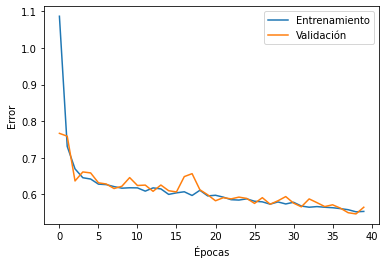

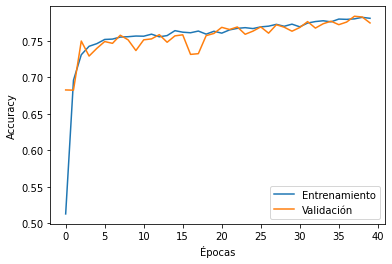

In [ ]:
plot_curves(histograma.history)

In [ ]:
#predicciones del modelo
from sklearn.metrics import classification_report


predictions_train=model3.predict(TX_train195[:,:,None])
resultados_train=np.argmax(predictions_train, axis=1)

predictions_val = model3.predict(TX_val195[:,:,None])
resultados_val=np.argmax(predictions_val, axis=1)

print(classification_report(train_Y195, resultados_train))
print(classification_report(val_Y195, resultados_val))


              precision    recall  f1-score   support

           0       0.74      0.73      0.73     15883
           1       0.90      0.70      0.79     11335
           2       0.76      0.88      0.82     17259

    accuracy                           0.78     44477
   macro avg       0.80      0.77      0.78     44477
weighted avg       0.79      0.78      0.78     44477

              precision    recall  f1-score   support

           0       0.73      0.72      0.72    299566
           1       0.90      0.69      0.78    221105
           2       0.75      0.88      0.81    324404

    accuracy                           0.77    845075
   macro avg       0.79      0.76      0.77    845075
weighted avg       0.78      0.77      0.77    845075



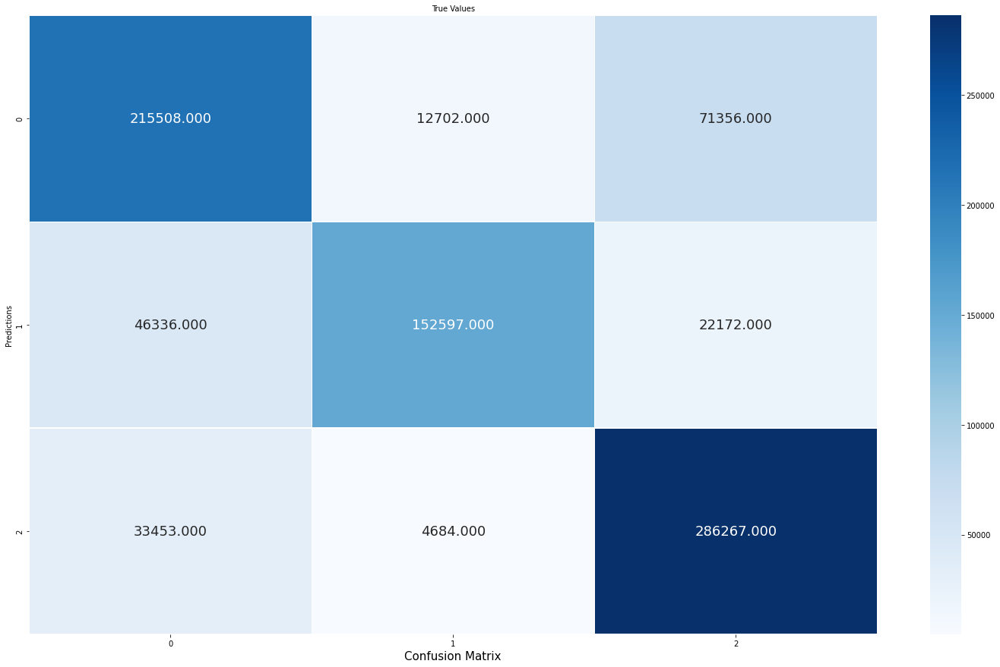

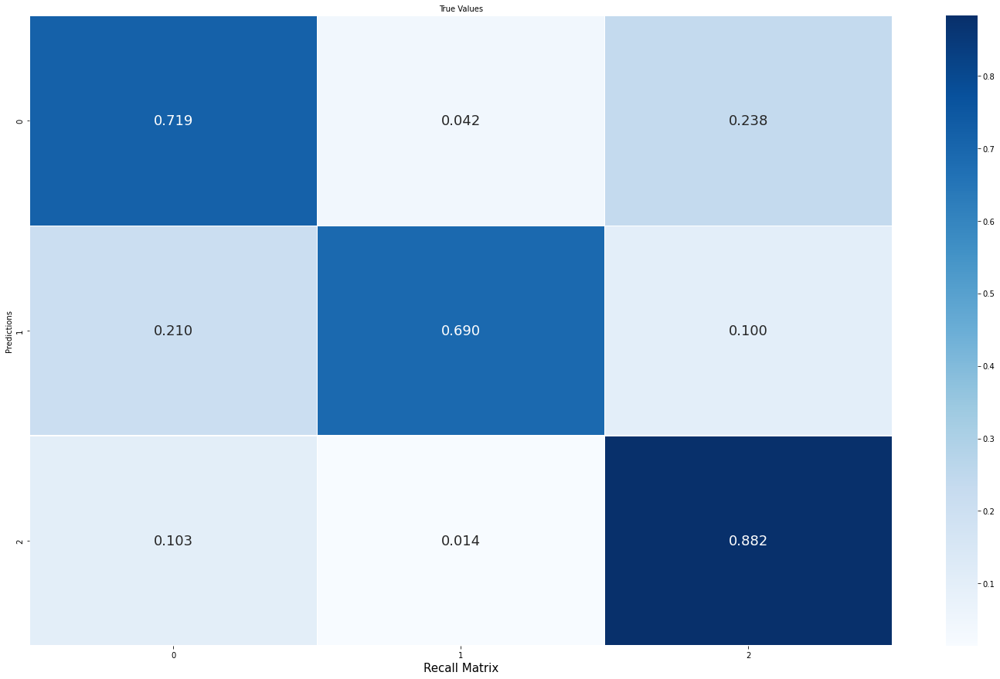

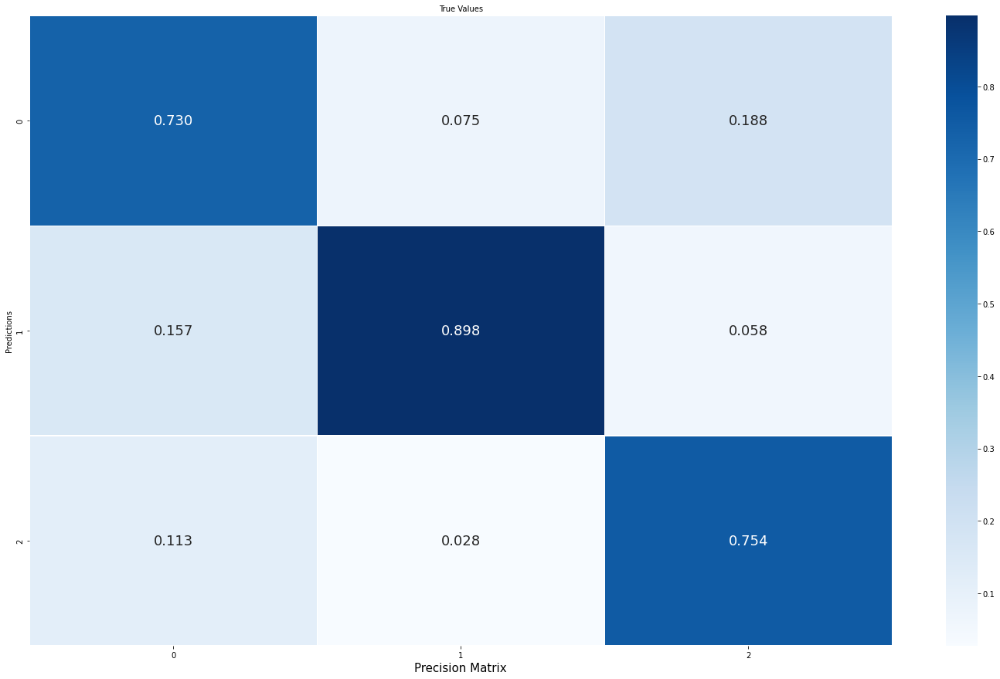

In [ ]:
confm=pd.crosstab(val_Y195, resultados_val)
cmrecall=np.transpose(np.transpose(confm) / confm.astype(np.float).sum(axis=1))
cmpre=confm / confm.astype(np.float).sum(axis=0)

d_cm_r=pd.DataFrame(cmrecall)
d_cm_p=pd.DataFrame(cmpre)

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(confm ,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Confusion Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()


fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_r,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Recall Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()

fig, ax = plt.subplots(figsize=(25,15))
grafica=sns.heatmap(d_cm_p,cmap='Blues', annot=True, linewidths=0.1, ax=ax, fmt=".3f", annot_kws={"size": 18})

plt.title('True Values', fontsize=10)
plt.ylabel('Valores verdaderos')
plt.xlabel('Precision Matrix', fontsize=15)
grafica.set(ylabel='Predictions')
plt.show()